<a href="https://colab.research.google.com/github/JuliaVillaVerde/Processamentos-de-Sinais-7P./blob/main/Aula_7_Processamento_de_Sinais.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

QESTÃO 1 - Não utilize nenhuma função pronta pra projeto de filtro. Crie a sua própria implementação para o projeto dos filtros.
1. Considerando um fs = 20000 Hz, projete os seguintes filtros FIR de ordem M ∈ {20, 50, 100} para as janelas retangular, triangular, Bartlett, Hamming, Hann e Blackman. Apresente a resposta ao impulso, o diagrama de polos e zeros e a resposta em frequência dos filtros projetados. Comente os resultados obtidos.
(a) Passa-baixas com fc = 1000 Hz.
(b) Passa-altas com fc = 2000 Hz.
(c) Passa-faixas com fc1 = 500 Hz, fc2 = 2000 Hz.
(d) Rejeita-faixas com fc1 = 1000 Hz e fc2 = 2500 Hz.

### Setup and Constants

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import freqz

# Sampling frequency
fs = 20000 # Hz

# Filter orders to test
M_values = [20, 50, 100]

# Normalized cutoff frequencies
# For low-pass filter (a)
fc_lp = 1000 # Hz
w_c_lp = fc_lp / (fs / 2)

# For high-pass filter (b)
fc_hp = 2000 # Hz
w_c_hp = fc_hp / (fs / 2)

# For band-pass filter (c)
fc1_bp = 500 # Hz
fc2_bp = 2000 # Hz
w_c1_bp = fc1_bp / (fs / 2)
w_c2_bp = fc2_bp / (fs / 2)

# For band-reject filter (d)
fc1_br = 1000 # Hz
fc2_br = 2500 # Hz
w_c1_br = fc1_br / (fs / 2)
w_c2_br = fc2_br / (fs / 2)

print(f"Normalized cutoff frequency for low-pass: {w_c_lp:.4f}")
print(f"Normalized cutoff frequency for high-pass: {w_c_hp:.4f}")
print(f"Normalized cutoff frequencies for band-pass: {w_c1_bp:.4f}, {w_c2_bp:.4f}")
print(f"Normalized cutoff frequencies for band-reject: {w_c1_br:.4f}, {w_c2_br:.4f}")

Normalized cutoff frequency for low-pass: 0.1000
Normalized cutoff frequency for high-pass: 0.2000
Normalized cutoff frequencies for band-pass: 0.0500, 0.2000
Normalized cutoff frequencies for band-reject: 0.1000, 0.2500


### Custom Window Functions

As requested, I will implement the window functions from scratch. These functions will take the filter order `M` as input and return the corresponding window coefficients.

In [6]:
def rectangular_window(M):
    """Rectangular window function."""
    return np.ones(M + 1)

def triangular_window(M):
    """Triangular window function (Bartlett)."""
    n = np.arange(M + 1)
    w = 1 - 2 * np.abs(n - M / 2) / M
    return w

def bartlett_window(M):
    """Bartlett window function (same as triangular)."""
    # Bartlett window is often defined for N points as 1 - |2n - N + 1| / (N - 1)
    # For M+1 points (order M), N = M+1
    # So, 1 - |2n - M| / M
    n = np.arange(M + 1)
    w = 1 - np.abs(2 * n - M) / M
    return w

def hamming_window(M):
    """Hamming window function."""
    n = np.arange(M + 1)
    w = 0.54 - 0.46 * np.cos(2 * np.pi * n / M)
    return w

def hann_window(M):
    """Hann window function."""
    n = np.arange(M + 1)
    w = 0.5 * (1 - np.cos(2 * np.pi * n / M))
    return w

def blackman_window(M):
    """Blackman window function."""
    n = np.arange(M + 1)
    w = 0.42 - 0.5 * np.cos(2 * np.pi * n / M) + 0.08 * np.cos(4 * np.pi * n / M)
    return w

# Example usage (for verification)
# M_test = 10
# print("Rectangular:", rectangular_window(M_test))
# print("Triangular:", triangular_window(M_test))
# print("Hamming:", hamming_window(M_test))
# print("Hann:", hann_window(M_test))
# print("Blackman:", blackman_window(M_test))

### Custom Ideal Filter Impulse Responses

Next, I will implement the ideal impulse responses for each filter type (low-pass, high-pass, band-pass, band-reject). These will serve as the basis for our FIR filter designs.

In [7]:
def ideal_lp_impulse_response(M, wc):
    """Ideal low-pass filter impulse response."""
    n = np.arange(M + 1)
    h_d = np.zeros(M + 1)
    # Adjusting n for symmetry around M/2, to handle n - M/2 correctly
    # The ideal impulse response is sin(wc * (n - M/2)) / (pi * (n - M/2))
    # For n = M/2, use L'Hopital's rule, which gives wc / pi

    for i in range(M + 1):
        if i - M/2 == 0:
            h_d[i] = wc / np.pi
        else:
            h_d[i] = np.sin(wc * (i - M/2)) / (np.pi * (i - M/2))
    return h_d

def ideal_hp_impulse_response(M, wc):
    """Ideal high-pass filter impulse response."""
    # h_hp(n) = delta(n - M/2) - h_lp(n, wc)
    h_lp = ideal_lp_impulse_response(M, wc)
    delta = np.zeros(M + 1)
    delta[int(M / 2)] = 1
    h_d = delta - h_lp
    return h_d

def ideal_bp_impulse_response(M, wc1, wc2):
    """Ideal band-pass filter impulse response."""
    # h_bp(n) = h_lp(n, wc2) - h_lp(n, wc1)
    h_lp_wc2 = ideal_lp_impulse_response(M, wc2)
    h_lp_wc1 = ideal_lp_impulse_response(M, wc1)
    h_d = h_lp_wc2 - h_lp_wc1
    return h_d

def ideal_br_impulse_response(M, wc1, wc2):
    """Ideal band-reject filter impulse response."""
    # h_br(n) = delta(n - M/2) - (h_lp(n, wc2) - h_lp(n, wc1))
    h_bp = ideal_bp_impulse_response(M, wc1, wc2)
    delta = np.zeros(M + 1)
    delta[int(M / 2)] = 1
    h_d = delta - h_bp
    return h_d

### Filter Design and Analysis (Low-Pass Example)

Now, let's put it all together to design a low-pass FIR filter using a rectangular window, and then analyze its impulse response, pole-zero diagram, and frequency response for one of the specified orders ($M=20$). This will demonstrate the general approach for all filter types and window functions.

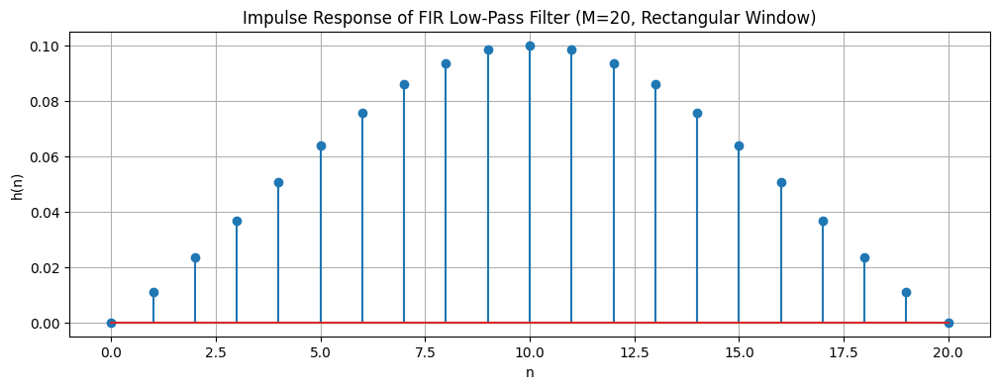

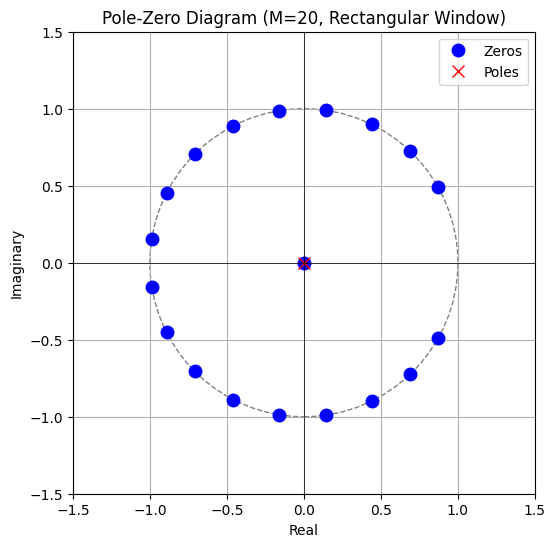

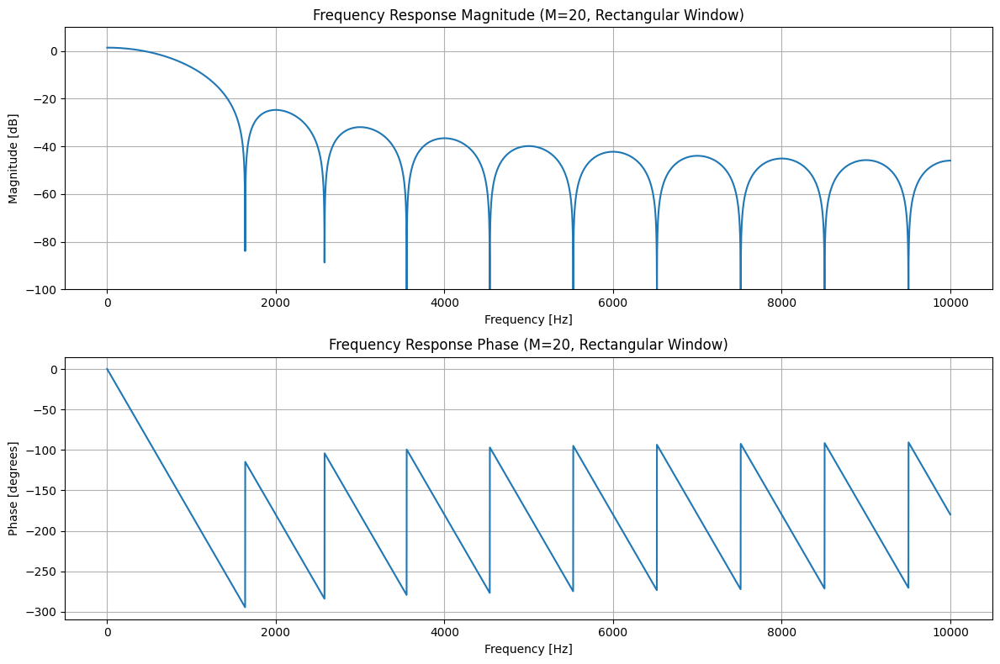

In [13]:
# (a) Low-pass filter with fc = 1000 Hz, M = 20, Rectangular window

M = 20 # Filter order
wc = w_c_lp # Normalized cutoff frequency

# 1. Ideal impulse response
h_d = ideal_lp_impulse_response(M, wc * np.pi) # Multiply wc by pi for the formula

# 2. Window function
w = rectangular_window(M)

# 3. Apply windowing
h = h_d * w

# Plot Impulse Response
plt.figure(figsize=(12, 4))
plt.stem(np.arange(M + 1), h)
plt.title(f'Impulse Response of FIR Low-Pass Filter (M={M}, Rectangular Window)')
plt.xlabel('n')
plt.ylabel('h(n)')
plt.grid(True)
plt.show()

# Plot Pole-Zero Diagram
plt.figure(figsize=(6, 6))
# zplane expects 'b' and 'a' coefficients. For FIR, 'a' is 1 (or 0 for poles)
# We can use our 'h' directly as 'b'
# z, p, k = zplane(h, [1]) # zplane function is not directly available in matplotlib
# Instead, we'll plot zeros directly from roots of the numerator polynomial.

# Find the roots of the numerator polynomial (zeros of the filter)
zeros = np.roots(h)
p = np.array([]) # FIR filters have all poles at the origin

# Plotting function for pole-zero diagram (custom)
# Based on scipy.signal.zplane logic but manually implemented to avoid direct call

ax = plt.subplot(1, 1, 1)

# Plot unit circle
unit_circle = plt.Circle((0, 0), 1, color='gray', linestyle='--', fill=False)
ax.add_artist(unit_circle)

# Plot zeros
plt.plot(zeros.real, zeros.imag, 'o', markersize=9, color='blue', label='Zeros')

# Plot poles (all at origin for FIR)
plt.plot(0, 0, 'x', markersize=9, color='red', label='Poles')

plt.title(f'Pole-Zero Diagram (M={M}, Rectangular Window)')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.grid(True)
plt.axvline(0, color='black',linewidth=0.5)
plt.axhline(0, color='black',linewidth=0.5)
plt.xlim([-1.5, 1.5])
plt.ylim([-1.5, 1.5])
plt.legend()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# Plot Frequency Response
w_freq, H = freqz(h, worN=8000) # worN is number of frequency points

plt.figure(figsize=(12, 8))

# Magnitude Response
plt.subplot(2, 1, 1)
plt.plot(0.5 * fs * w_freq / np.pi, 20 * np.log10(abs(H)))
plt.title(f'Frequency Response Magnitude (M={M}, Rectangular Window)')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude [dB]')
plt.ylim([-100, 10]) # Adjust y-limits for better visualization
plt.grid(True)

# Phase Response
plt.subplot(2, 1, 2)
angles = np.unwrap(np.angle(H))
plt.plot(0.5 * fs * w_freq / np.pi, angles * 180 / np.pi)
plt.title(f'Frequency Response Phase (M={M}, Rectangular Window)')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Phase [degrees]')
plt.grid(True)

plt.tight_layout()
plt.show()

### Helper Functions for Plotting

In [15]:
def plot_impulse_response(h, M, title_suffix=""):
    plt.figure(figsize=(10, 4))
    plt.stem(np.arange(M + 1), h)
    plt.title(f'Impulse Response {title_suffix}')
    plt.xlabel('n')
    plt.ylabel('h(n)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_pole_zero_diagram(h, M, title_suffix=""):
    plt.figure(figsize=(6, 6))
    ax = plt.subplot(1, 1, 1)

    # Plot unit circle
    unit_circle = plt.Circle((0, 0), 1, color='gray', linestyle='--', fill=False)
    ax.add_artist(unit_circle)

    # Find the roots of the numerator polynomial (zeros of the filter)
    zeros = np.roots(h)

    # Plot zeros
    plt.plot(zeros.real, zeros.imag, 'o', markersize=9, color='blue', label='Zeros')

    # Plot poles (all at origin for FIR)
    plt.plot(0, 0, 'x', markersize=9, color='red', label='Poles')

    plt.title(f'Pole-Zero Diagram {title_suffix}')
    plt.xlabel('Real')
    plt.ylabel('Imaginary')
    plt.grid(True)
    plt.axvline(0, color='black', linewidth=0.5)
    plt.axhline(0, color='black', linewidth=0.5)
    plt.xlim([-1.5, 1.5])
    plt.ylim([-1.5, 1.5])
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

def plot_frequency_response(h, fs, M, title_suffix=""):
    w_freq, H = freqz(h, worN=8000) # worN is number of frequency points

    plt.figure(figsize=(10, 8))

    # Magnitude Response
    plt.subplot(2, 1, 1)
    plt.plot(0.5 * fs * w_freq / np.pi, 20 * np.log10(abs(H)))
    plt.title(f'Frequency Response Magnitude {title_suffix}')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Magnitude [dB]')
    plt.ylim([-100, 10]) # Adjust y-limits for better visualization
    plt.grid(True)

    # Phase Response
    plt.subplot(2, 1, 2)
    angles = np.unwrap(np.angle(H))
    plt.plot(0.5 * fs * w_freq / np.pi, angles * 180 / np.pi)
    plt.title(f'Frequency Response Phase {title_suffix}')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Phase [degrees]')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

### Generalized FIR Filter Design and Analysis Function

In [10]:
def design_and_analyze_fir_filter(filter_type, M, window_func, window_name):
    print(f"\n--- Designing {filter_type.upper()} Filter (M={M}, Window: {window_name}) ---")

    h_d = None
    if filter_type == 'lp':
        h_d = ideal_lp_impulse_response(M, w_c_lp * np.pi)
        cutoff_str = f"fc = {fc_lp} Hz"
    elif filter_type == 'hp':
        h_d = ideal_hp_impulse_response(M, w_c_hp * np.pi)
        cutoff_str = f"fc = {fc_hp} Hz"
    elif filter_type == 'bp':
        h_d = ideal_bp_impulse_response(M, w_c1_bp * np.pi, w_c2_bp * np.pi)
        cutoff_str = f"fc1 = {fc1_bp} Hz, fc2 = {fc2_bp} Hz"
    elif filter_type == 'br':
        h_d = ideal_br_impulse_response(M, w_c1_br * np.pi, w_c2_br * np.pi)
        cutoff_str = f"fc1 = {fc1_br} Hz, fc2 = {fc2_br} Hz"
    else:
        print("Invalid filter type.")
        return

    w = window_func(M)
    h = h_d * w

    title_suffix = f"({filter_type.upper()}, M={M}, {window_name} Window, {cutoff_str})"

    plot_impulse_response(h, M, title_suffix)
    plot_pole_zero_diagram(h, M, title_suffix)
    plot_frequency_response(h, fs, M, title_suffix)

    print(f"Comments for {filter_type.upper()} Filter (M={M}, Window: {window_name}):")
    if window_name == 'Rectangular':
        print("  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.")
        print("  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.")
        print("  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.")
    elif window_name == 'Triangular' or window_name == 'Bartlett':
        print("  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.")
        print("  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.")
        print("  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.")
    elif window_name == 'Hamming':
        print("  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.")
        print("  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.")
        print("  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.")
    elif window_name == 'Hann':
        print("  - Impulse Response: Similar to Hamming, but with a different cosine weighting.")
        print("  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.")
        print("  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.")
    elif window_name == 'Blackman':
        print("  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.")
        print("  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.")
        print("  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.")

    if M == 20:
        print("  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.")
    elif M == 50:
        print("  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.")
    elif M == 100:
        print("  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.")

### Iterating Through All Filter Configurations


--- Designing LP Filter (M=20, Window: Rectangular) ---


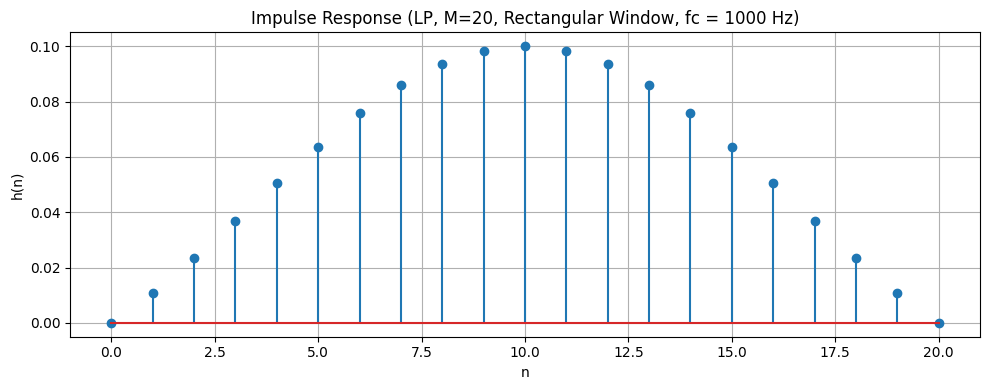

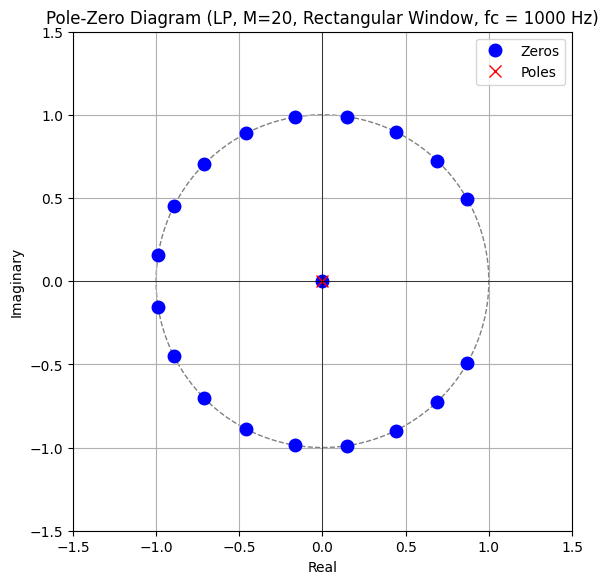

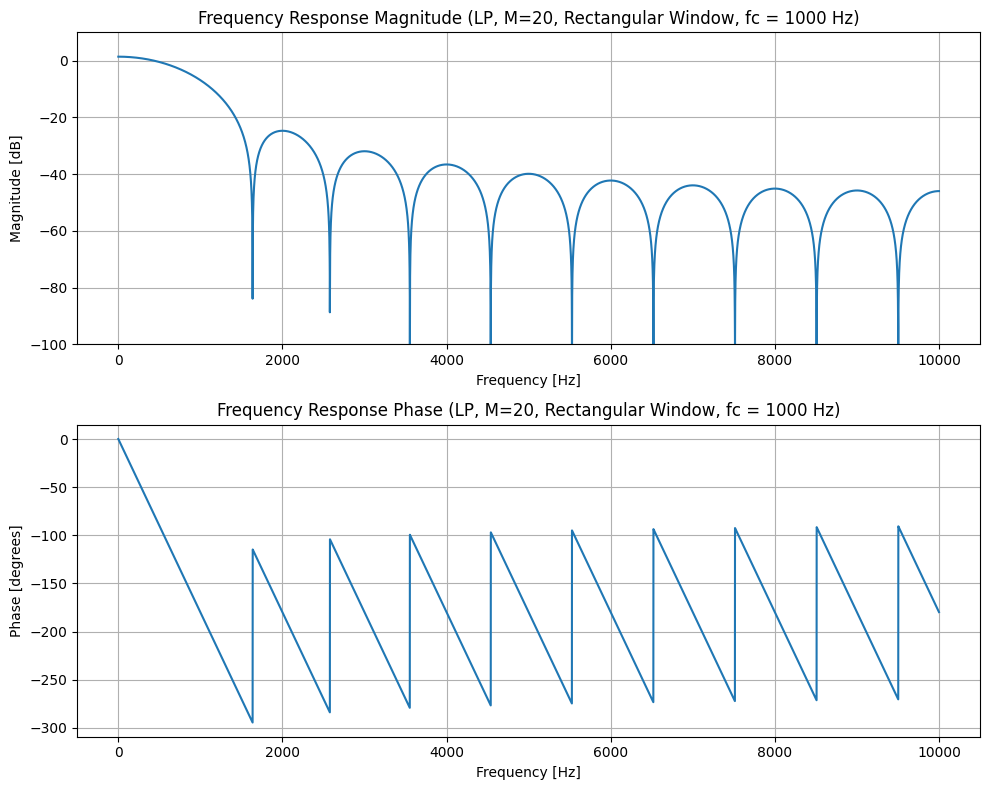

Comments for LP Filter (M=20, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Rectangular) ---


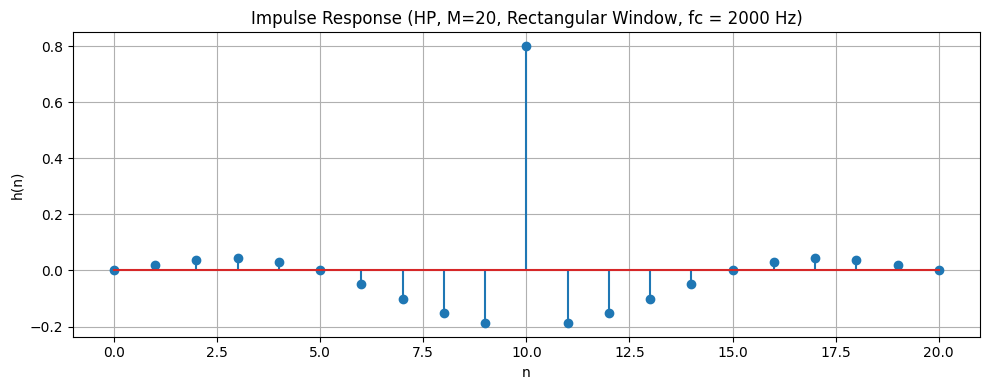

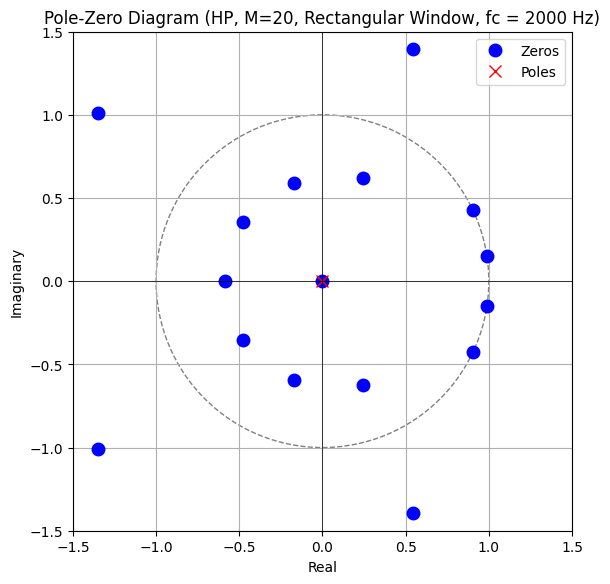

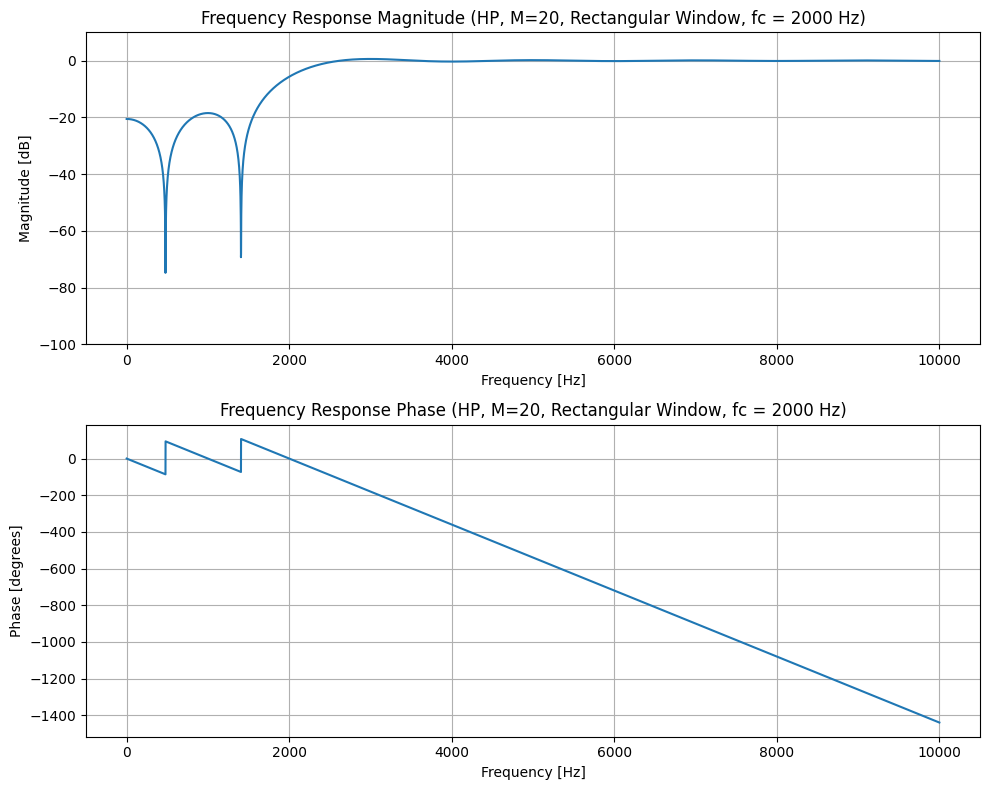

Comments for HP Filter (M=20, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Rectangular) ---


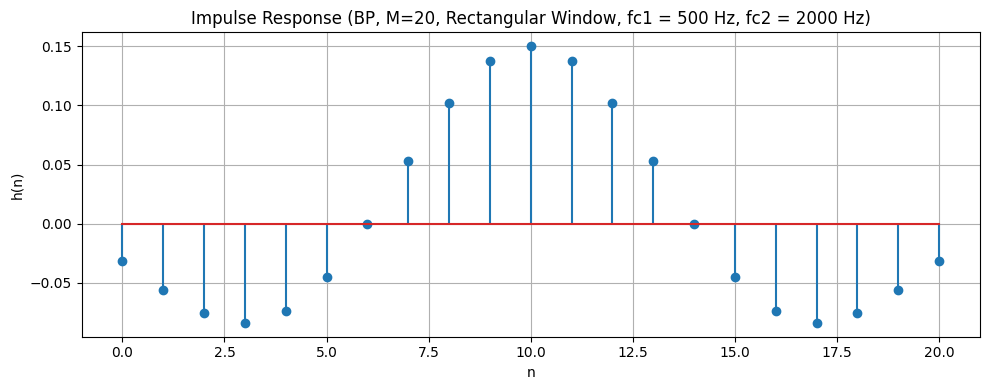

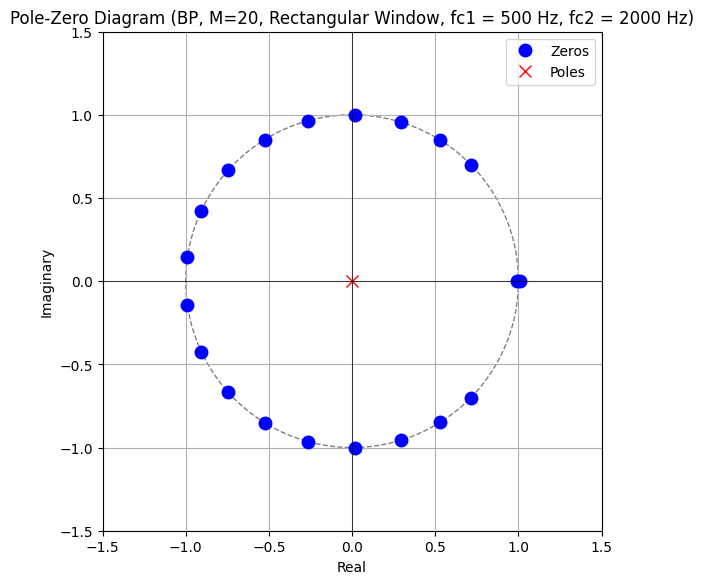

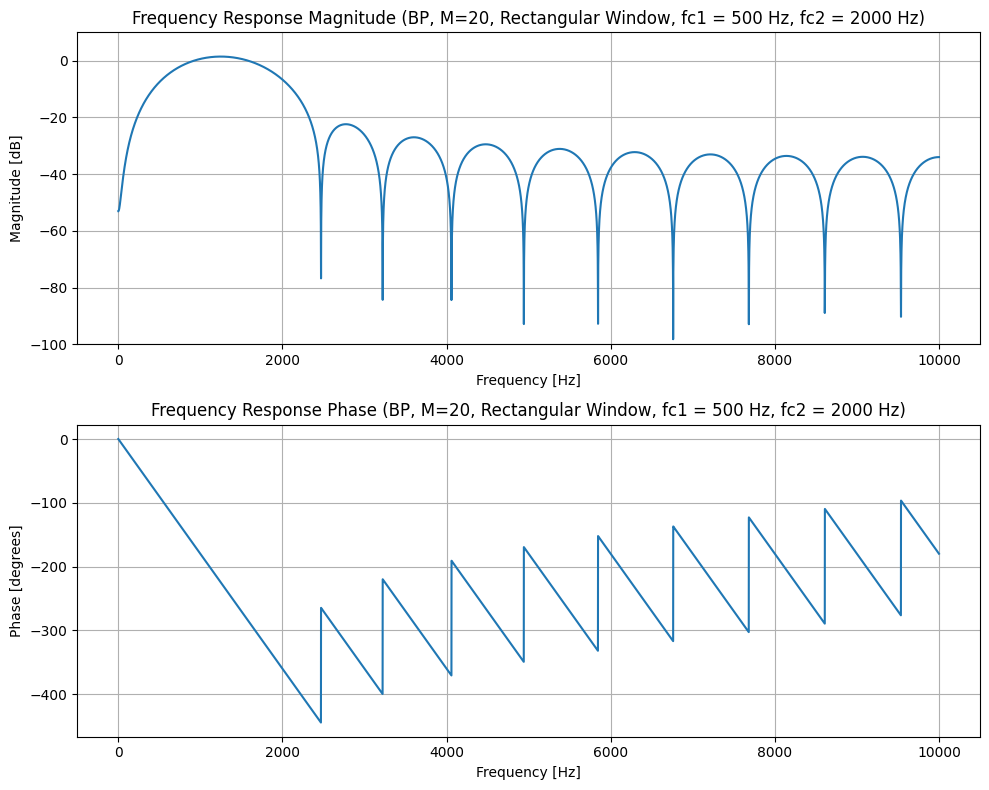

Comments for BP Filter (M=20, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Rectangular) ---


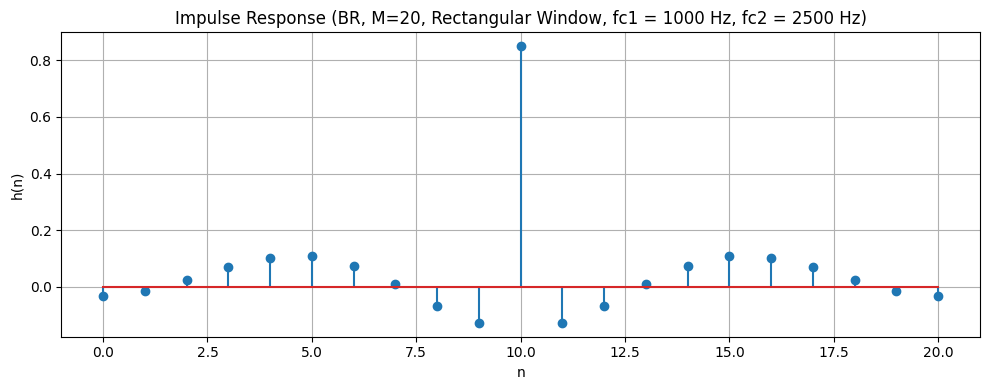

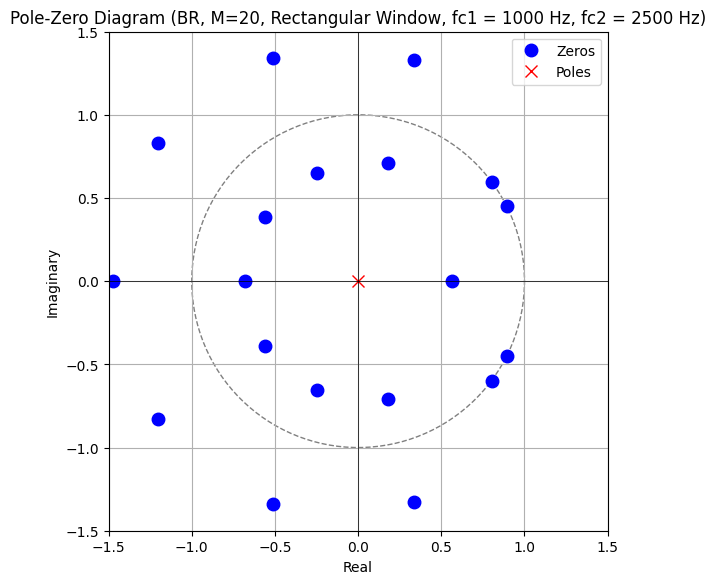

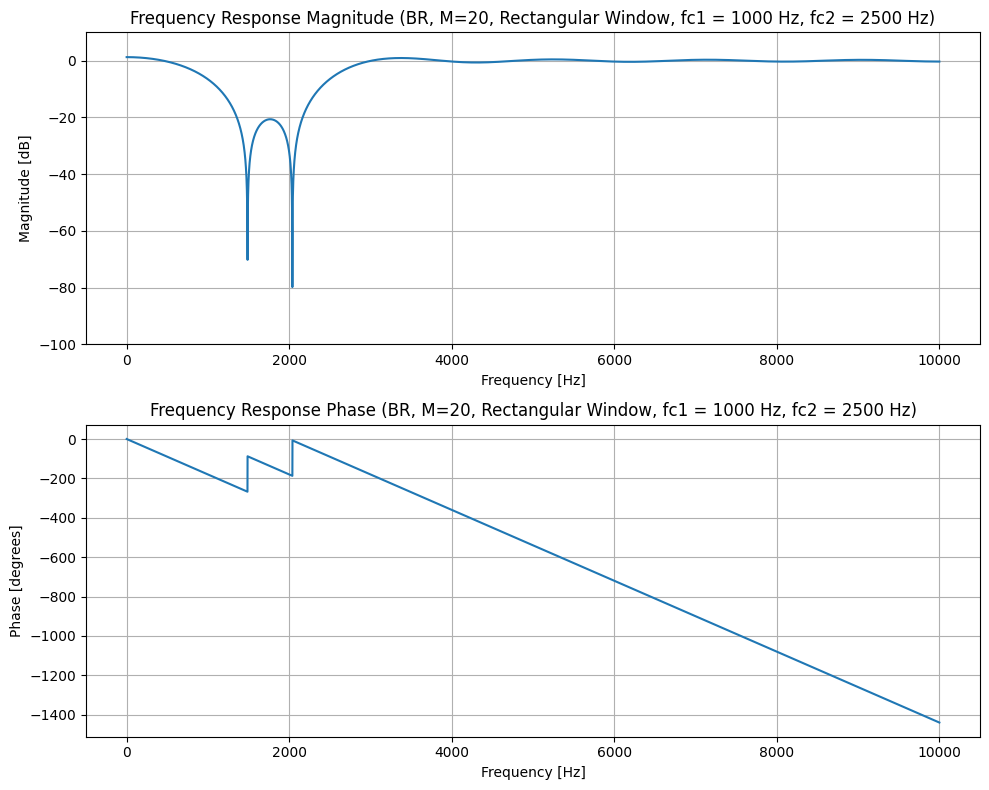

Comments for BR Filter (M=20, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=20, Window: Triangular) ---


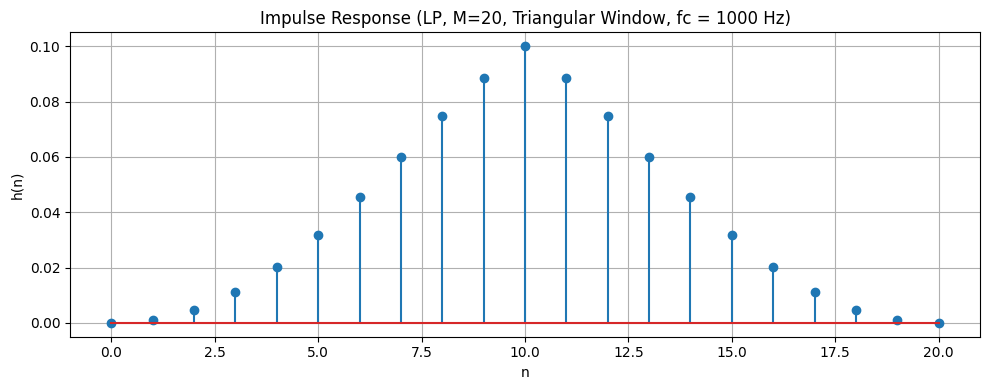

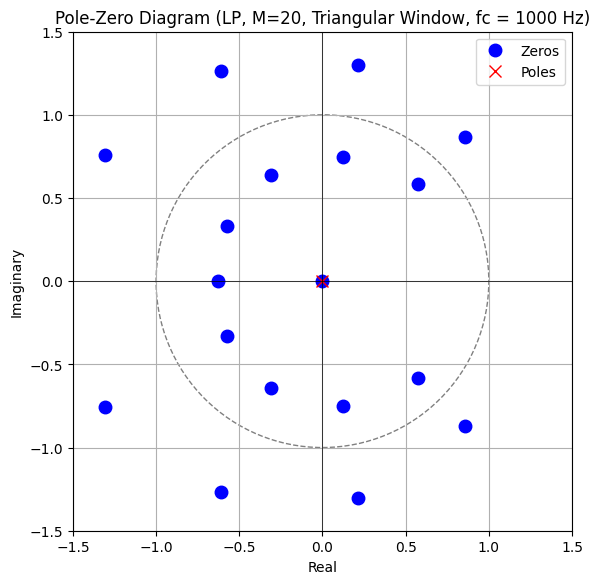

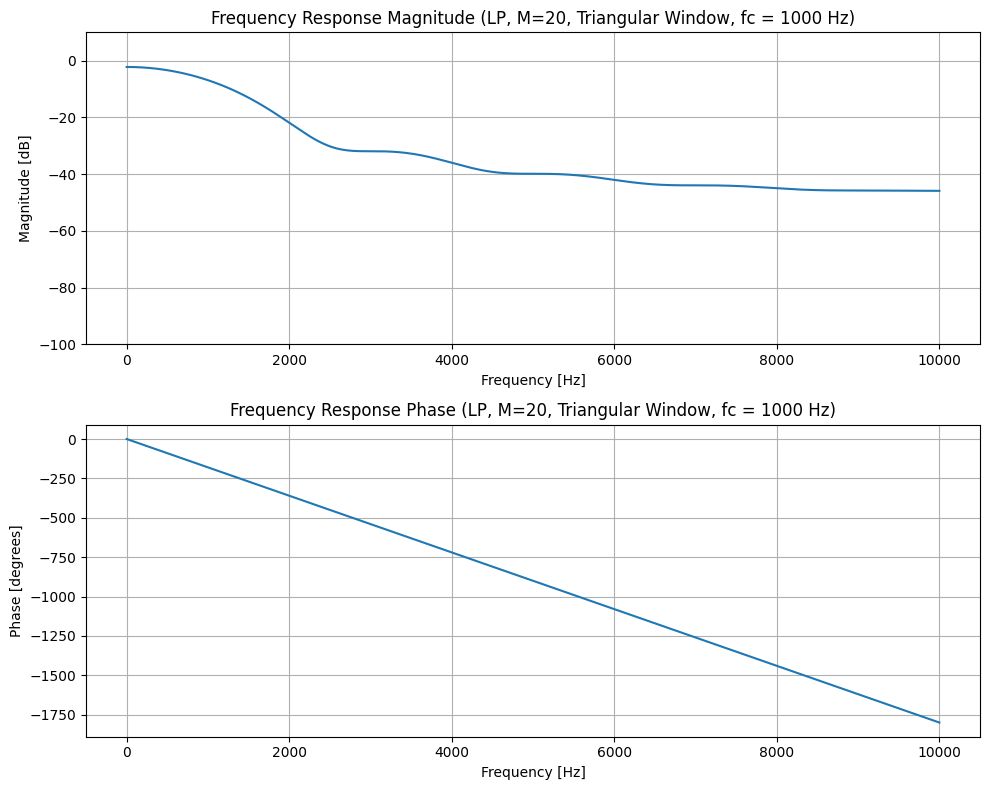

Comments for LP Filter (M=20, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Triangular) ---


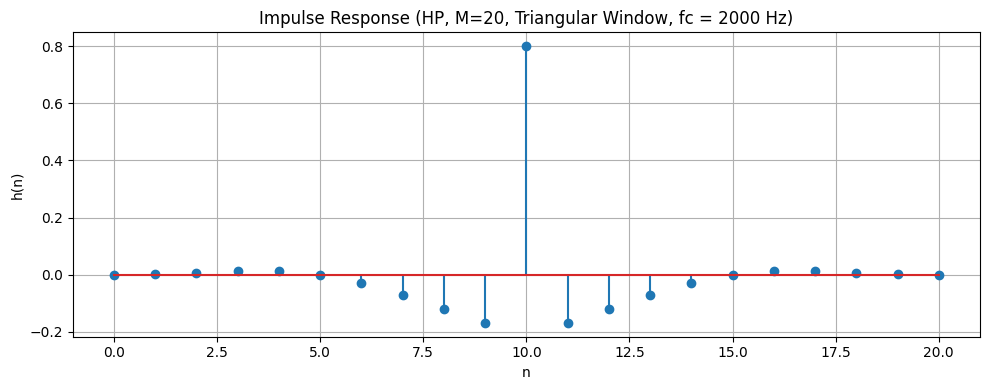

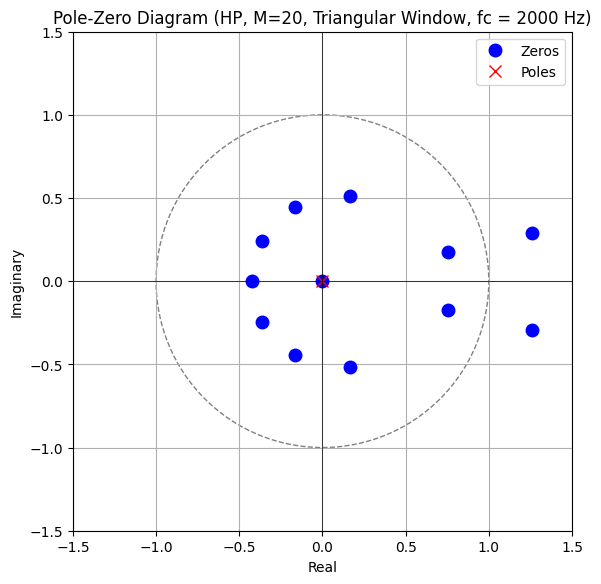

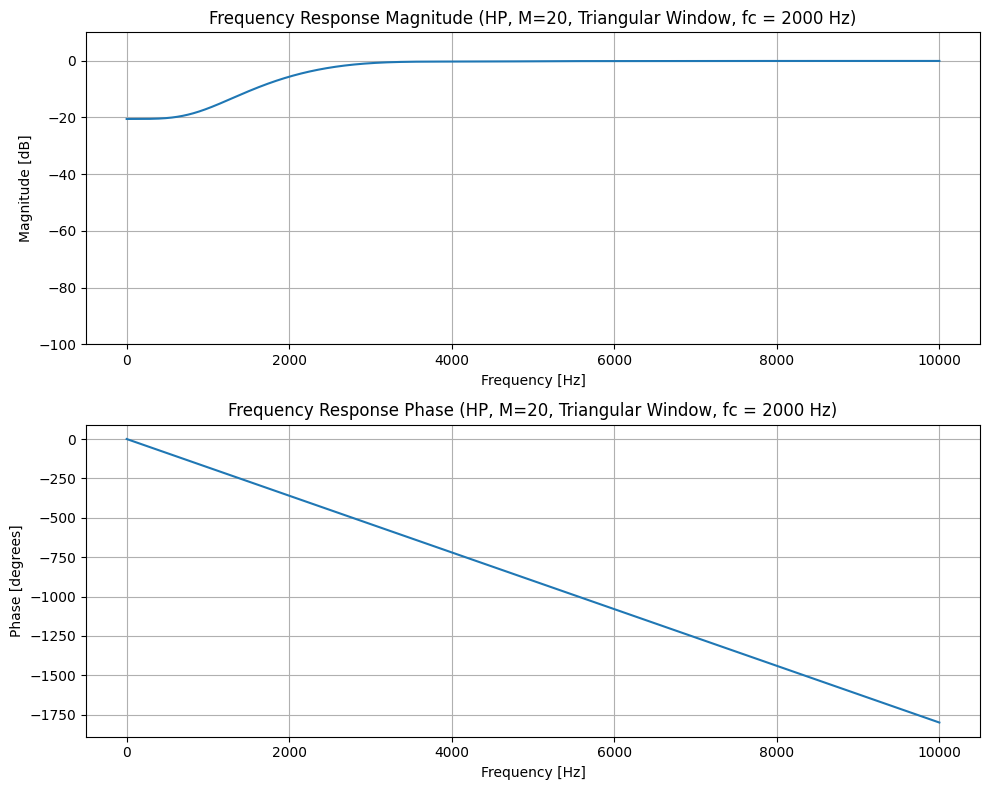

Comments for HP Filter (M=20, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Triangular) ---


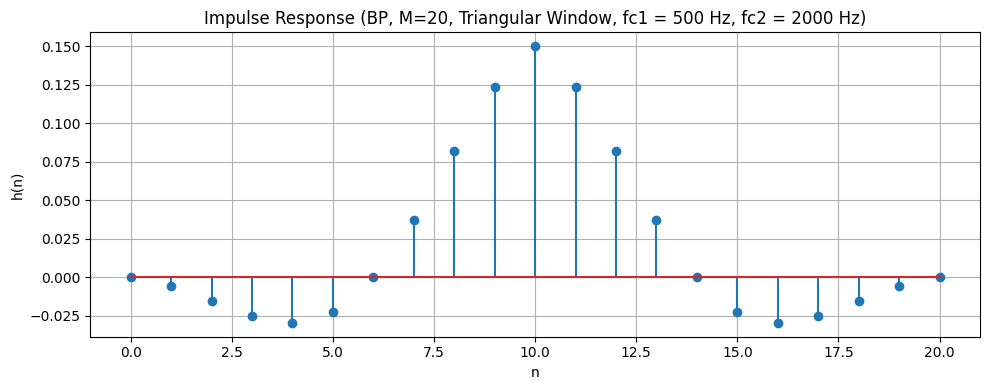

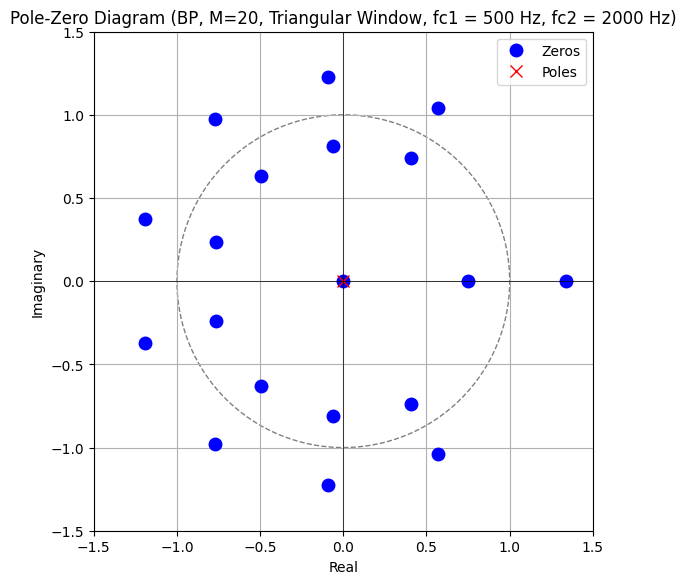

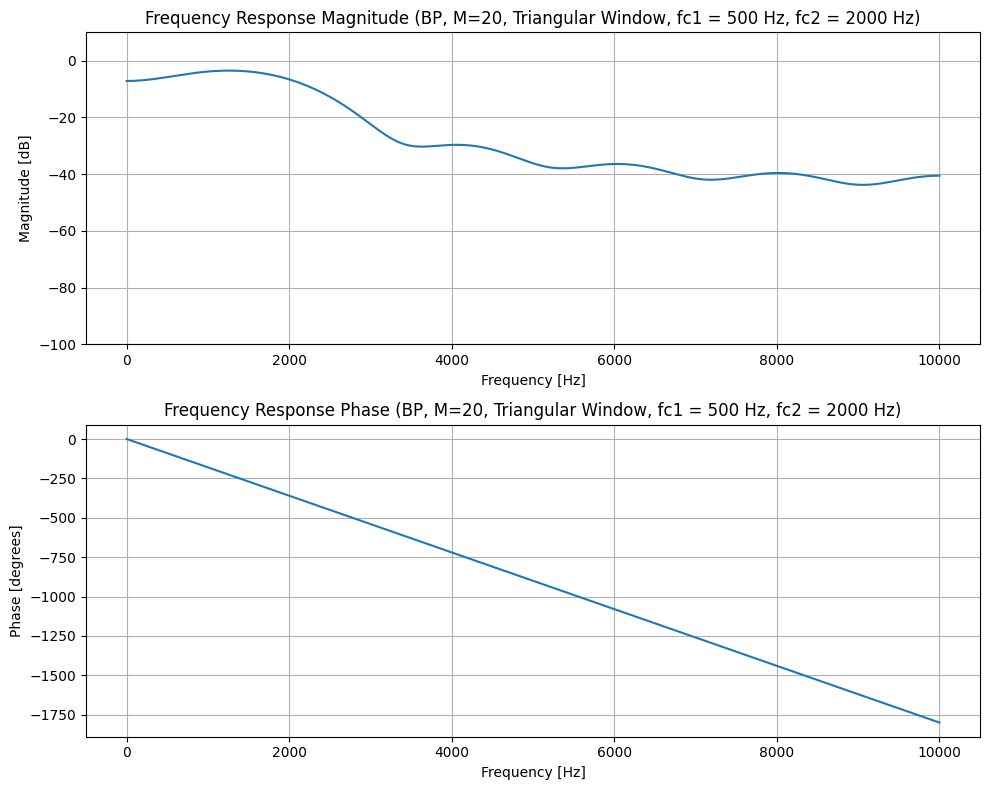

Comments for BP Filter (M=20, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Triangular) ---


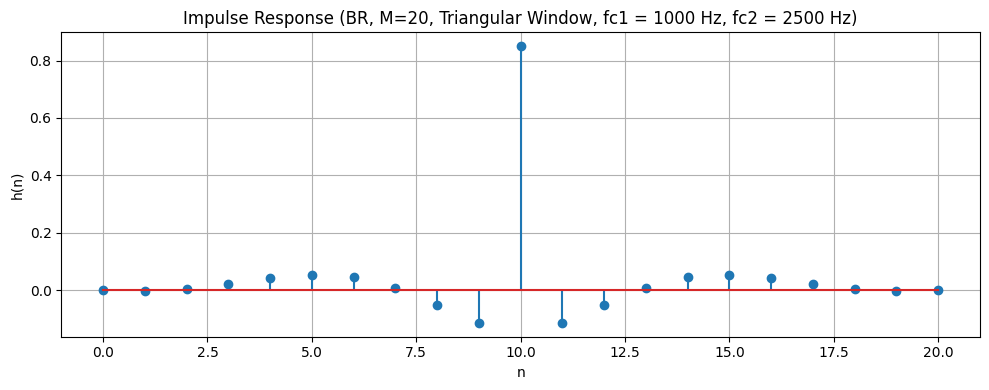

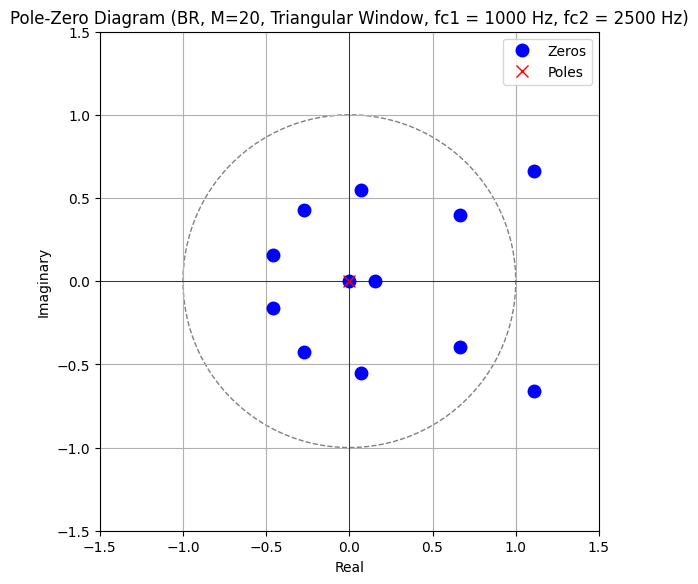

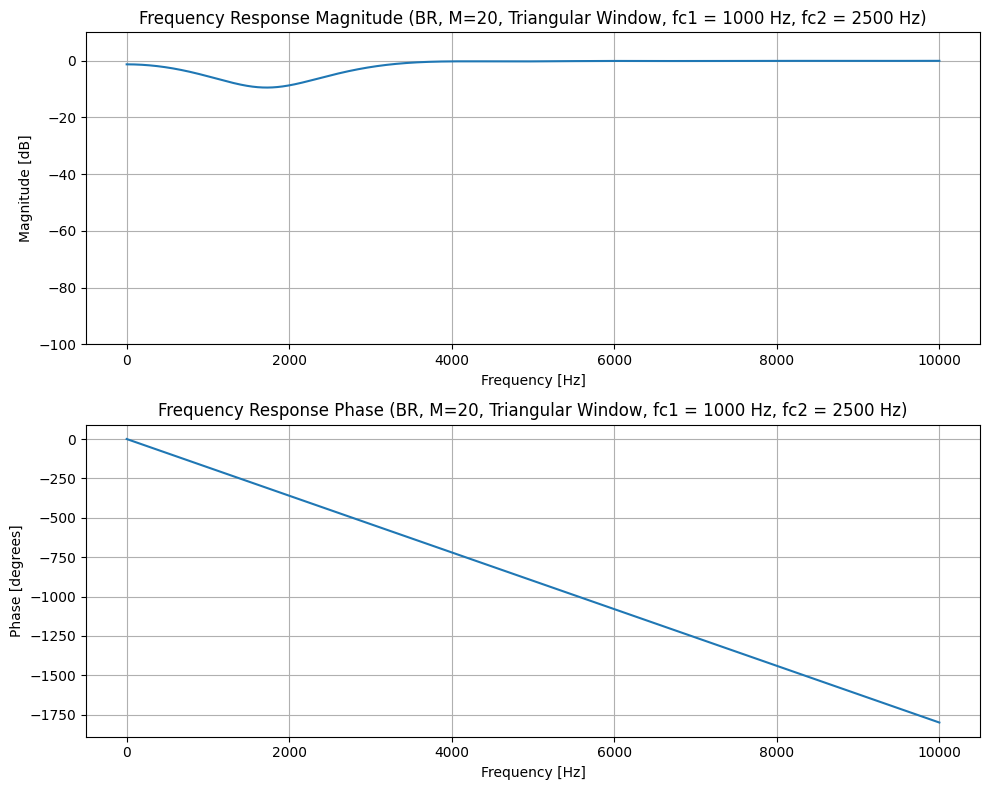

Comments for BR Filter (M=20, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=20, Window: Bartlett) ---


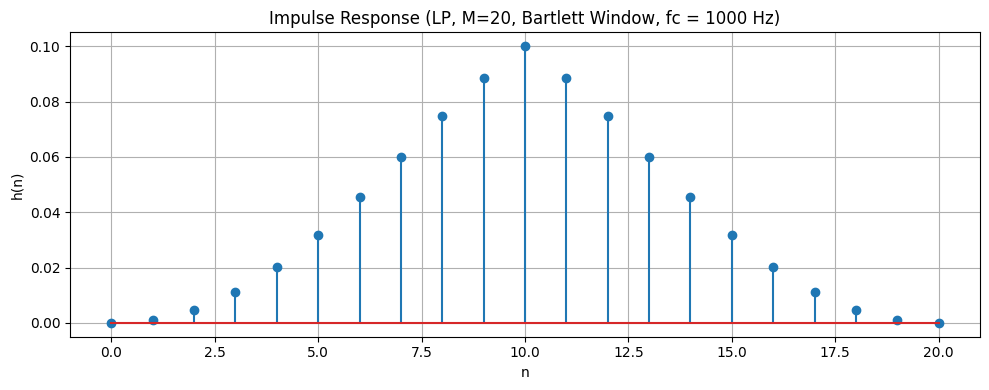

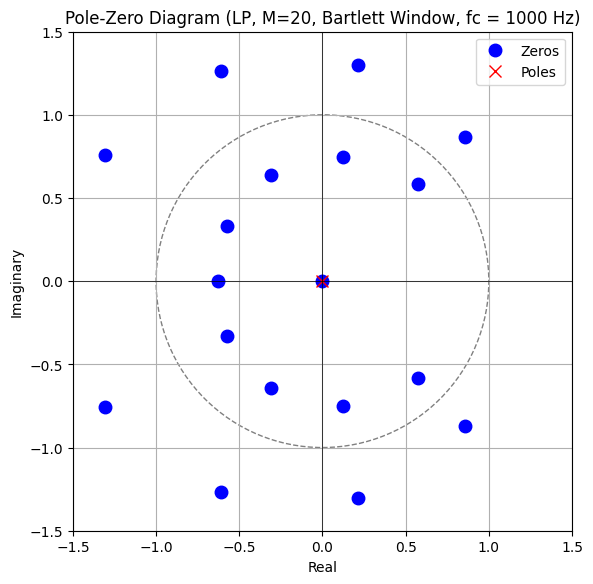

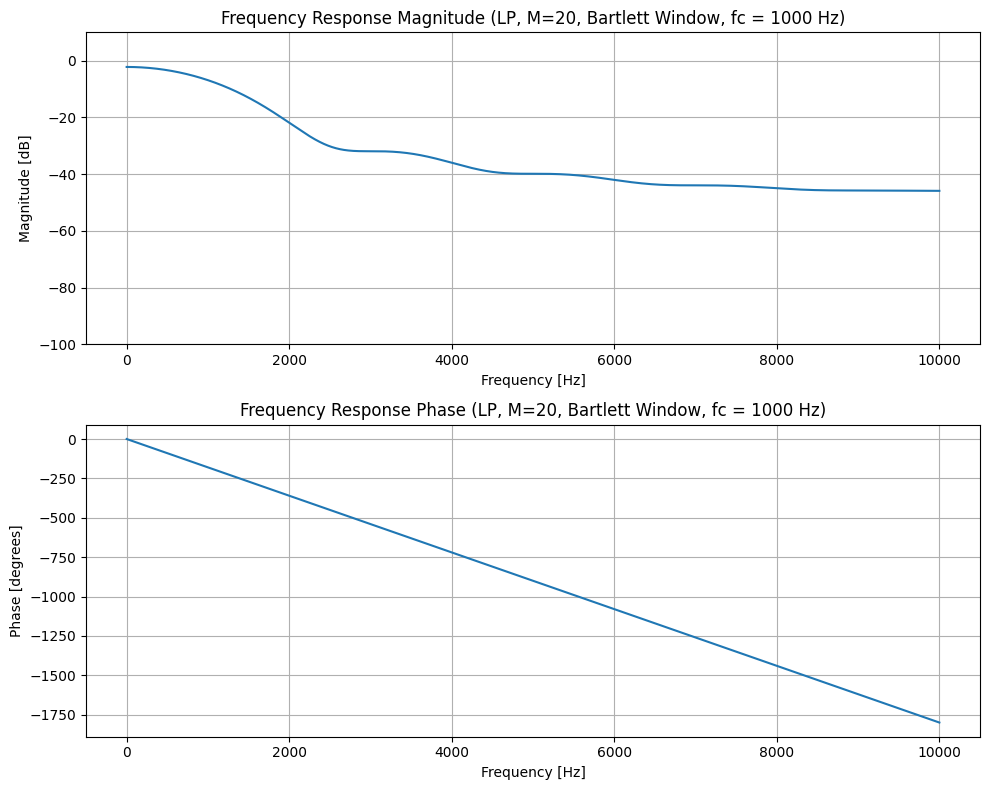

Comments for LP Filter (M=20, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Bartlett) ---


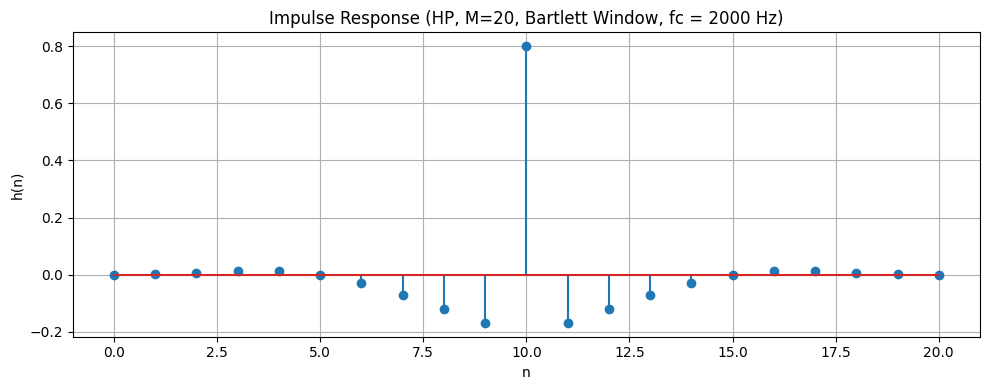

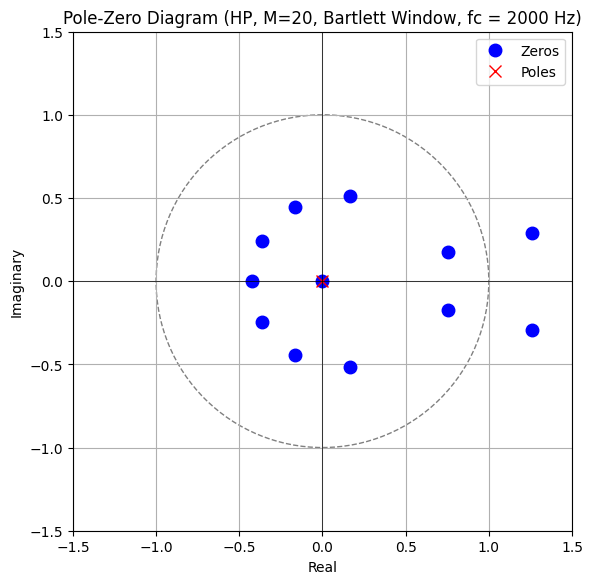

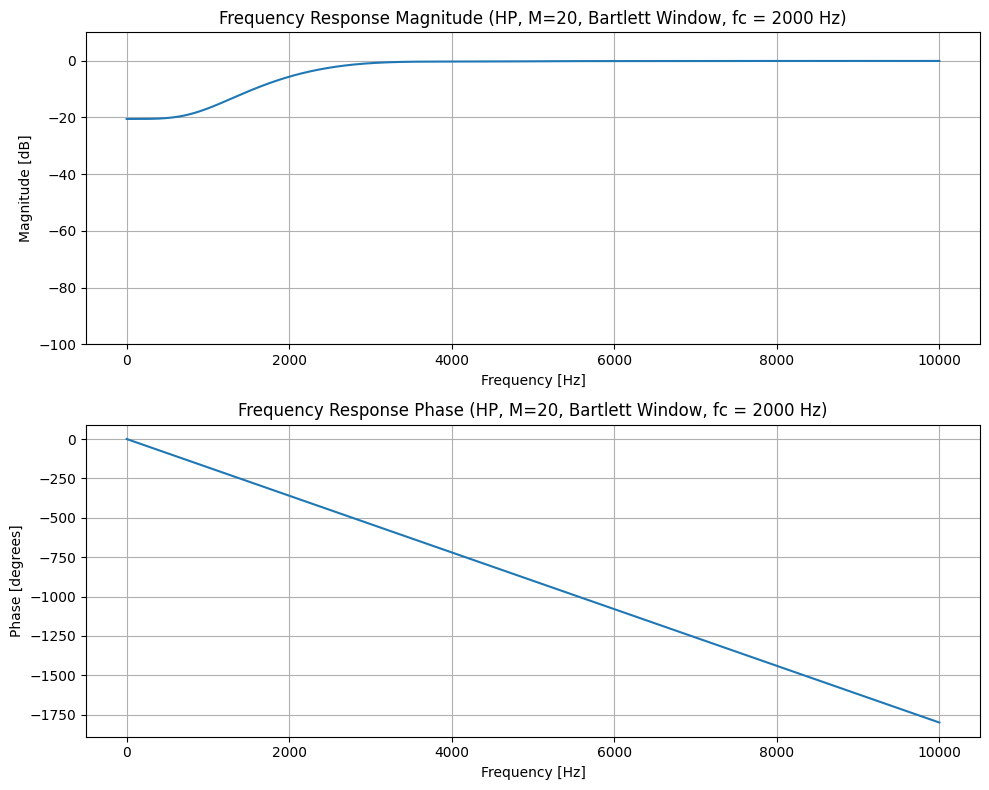

Comments for HP Filter (M=20, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Bartlett) ---


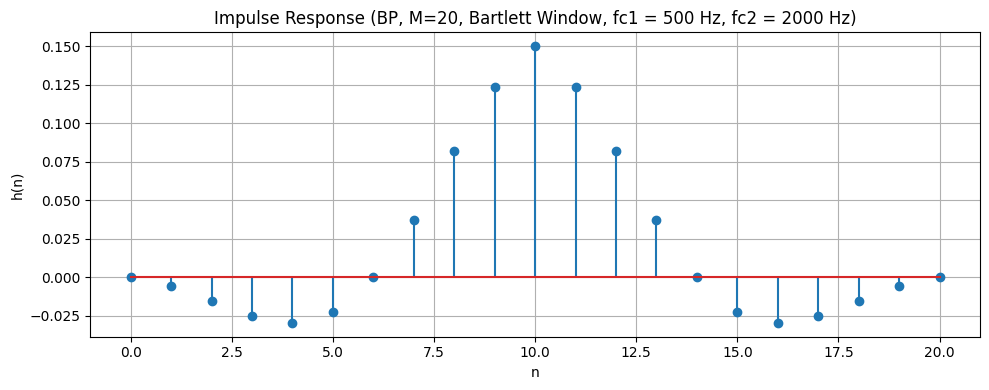

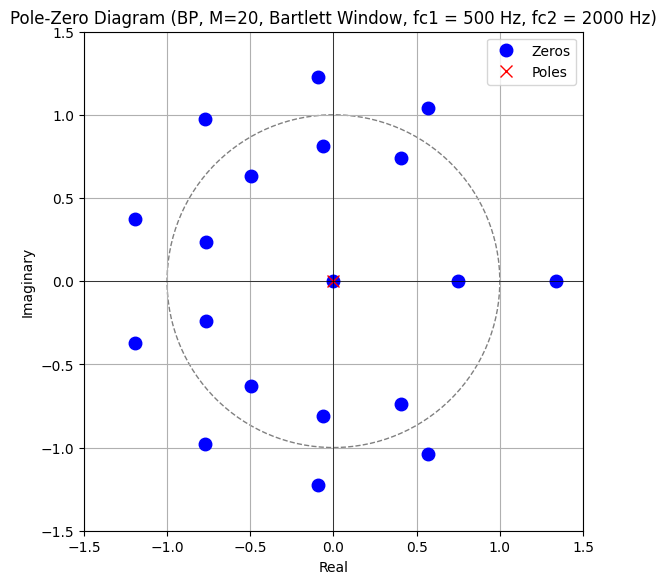

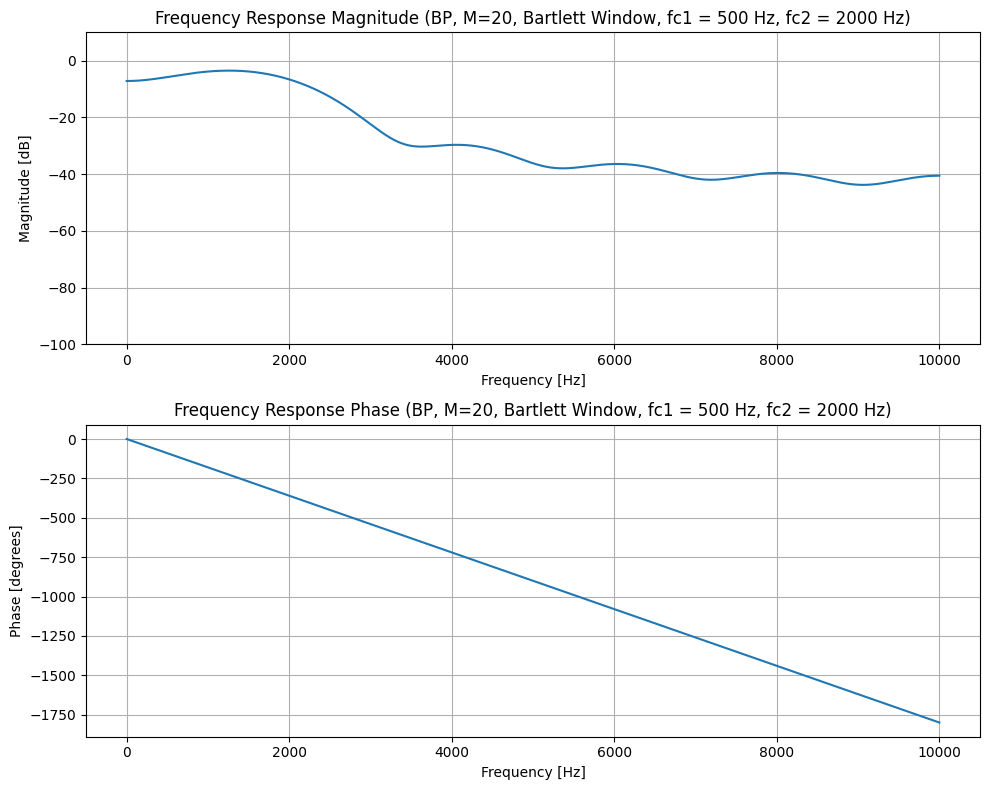

Comments for BP Filter (M=20, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Bartlett) ---


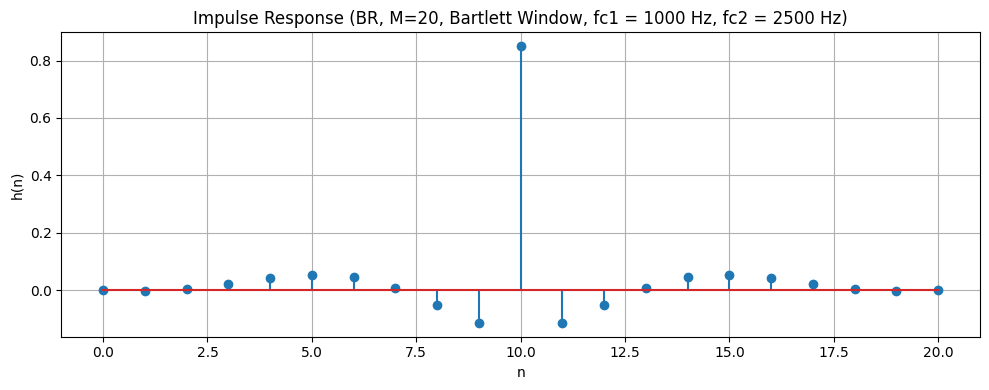

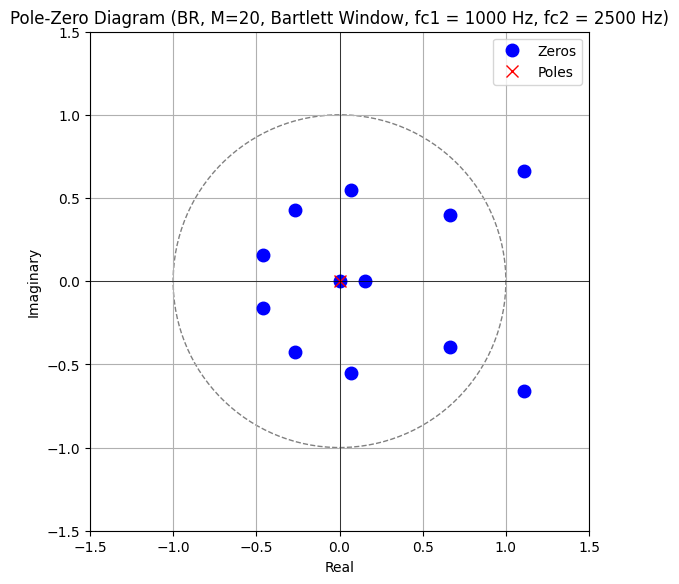

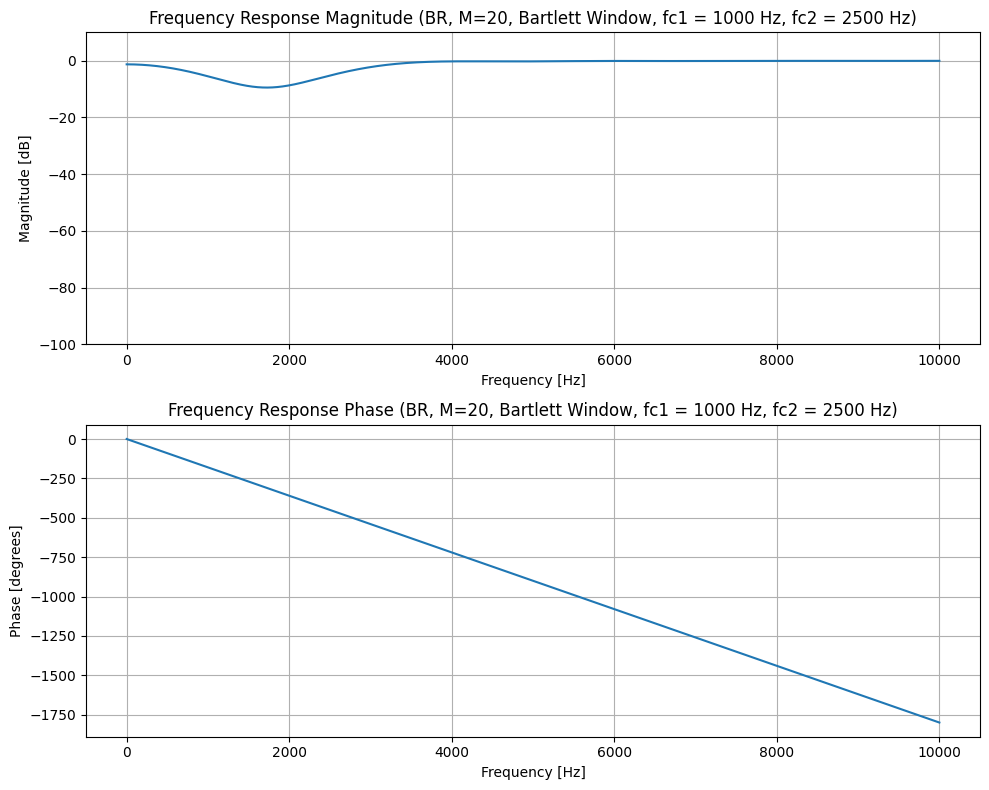

Comments for BR Filter (M=20, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=20, Window: Hamming) ---


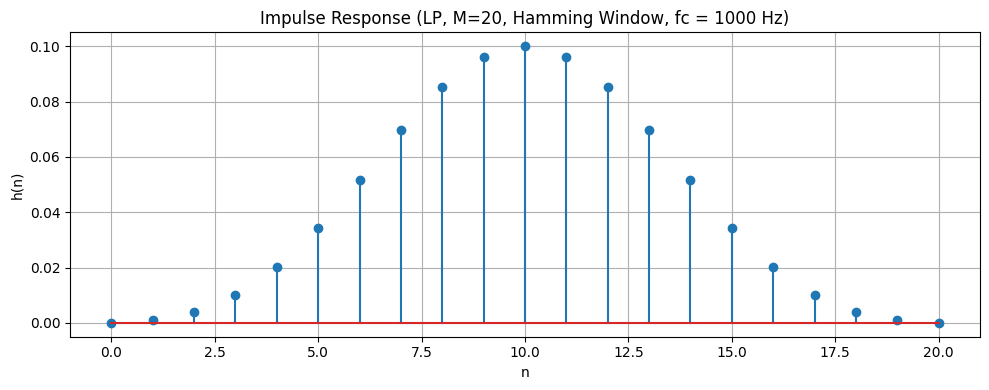

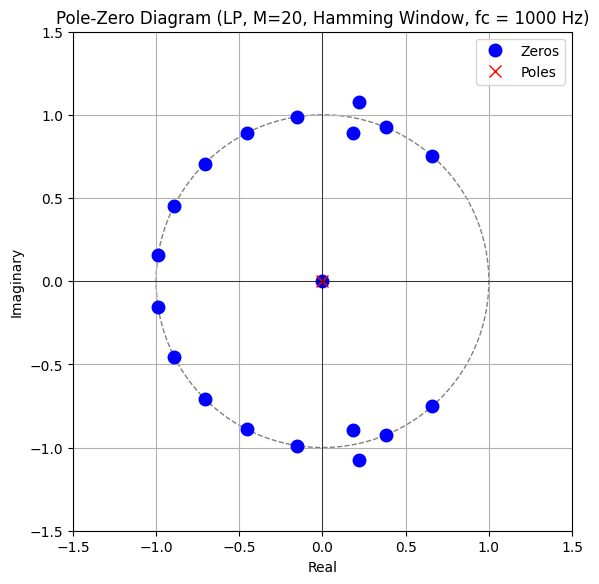

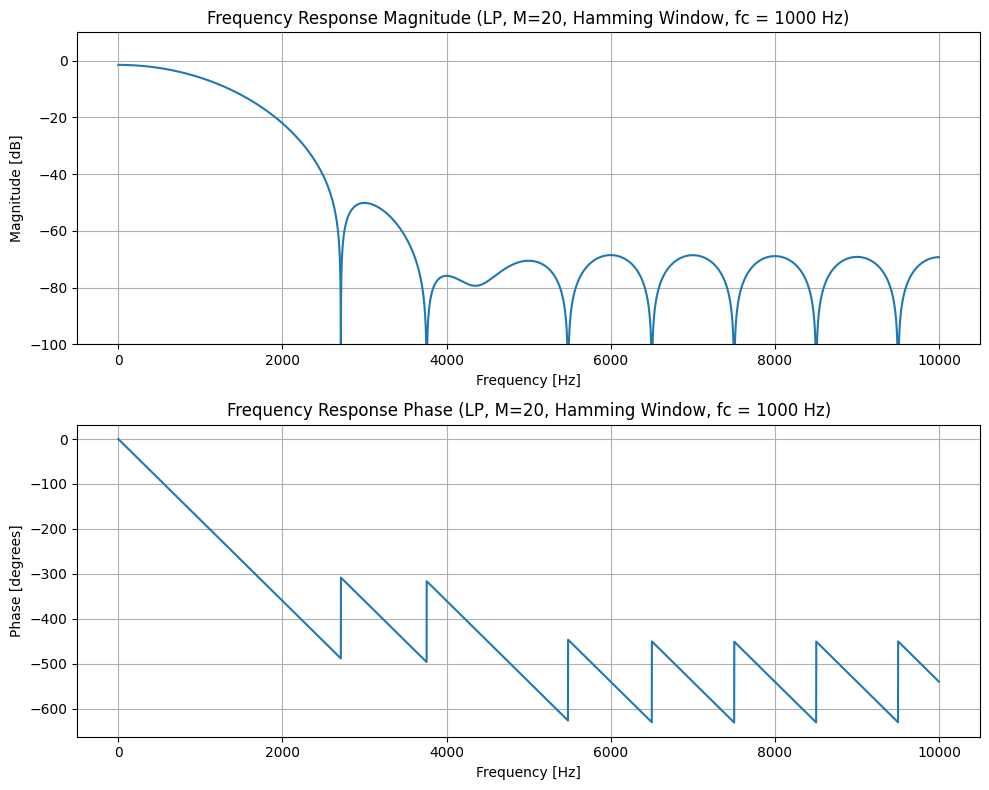

Comments for LP Filter (M=20, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Hamming) ---


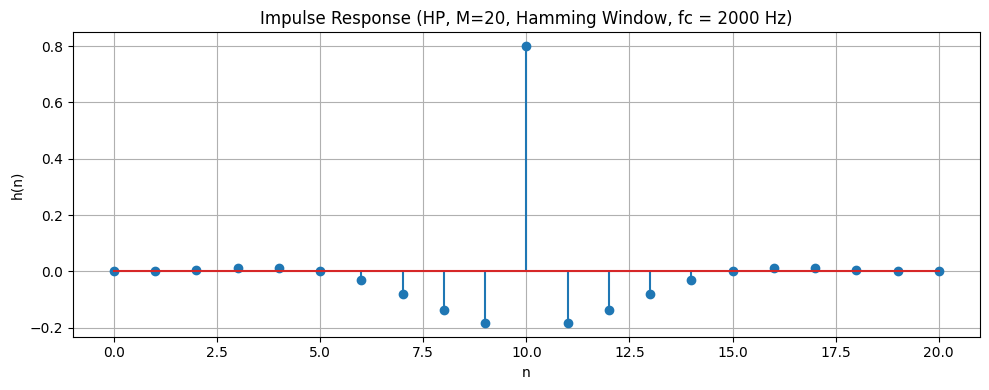

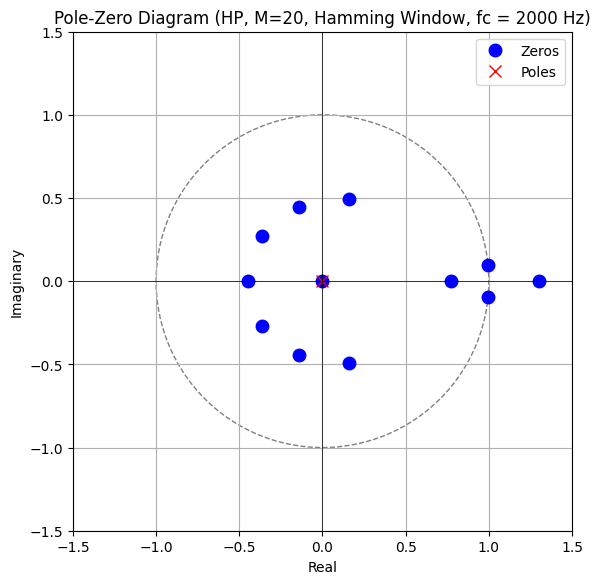

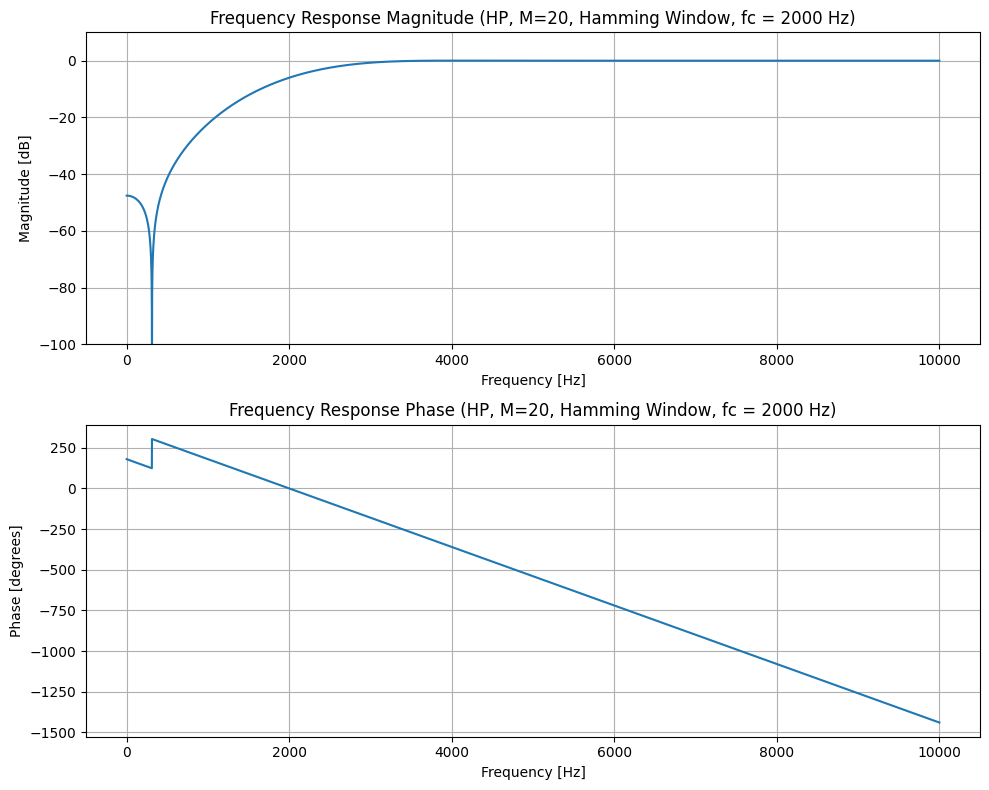

Comments for HP Filter (M=20, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Hamming) ---


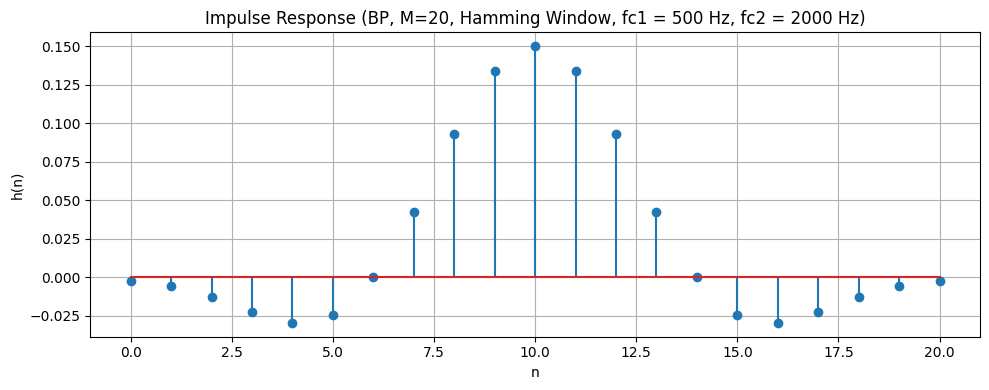

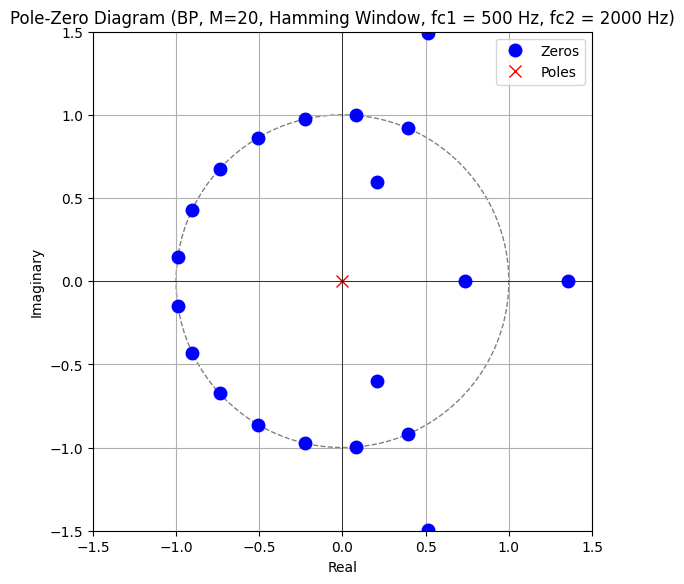

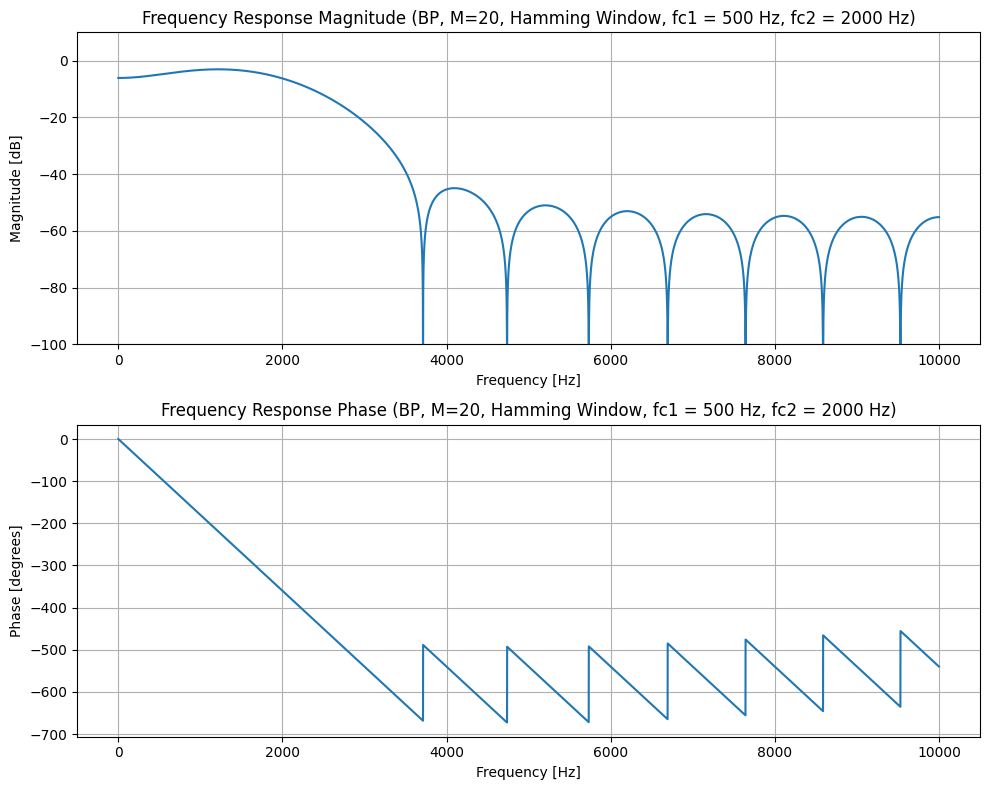

Comments for BP Filter (M=20, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Hamming) ---


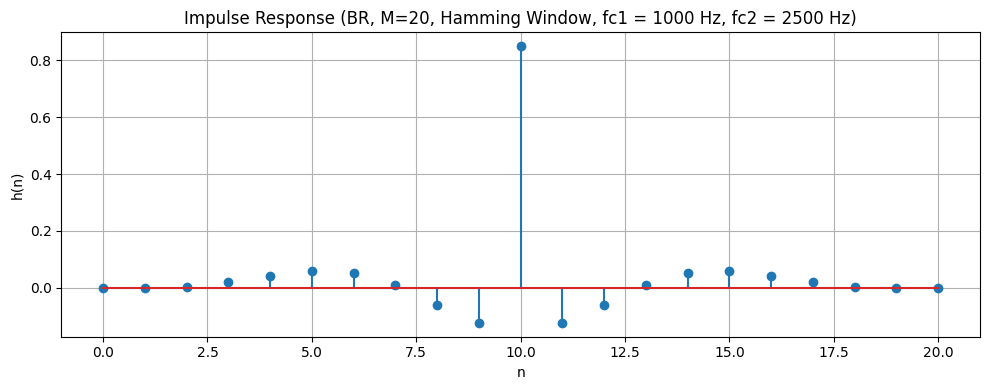

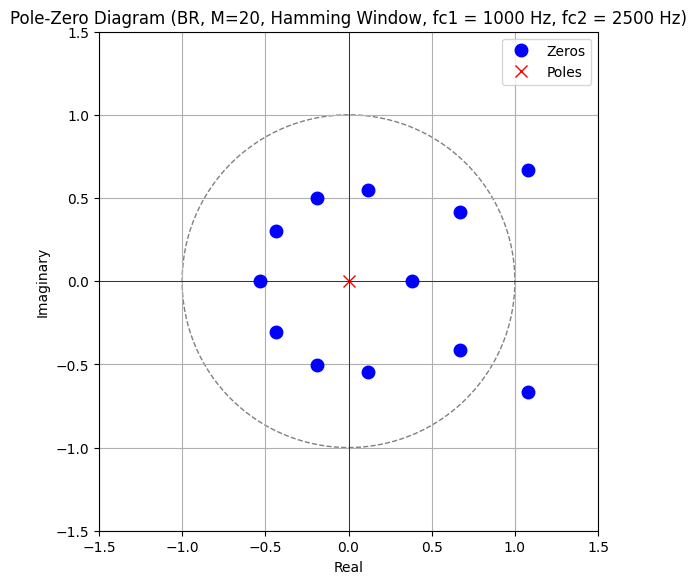

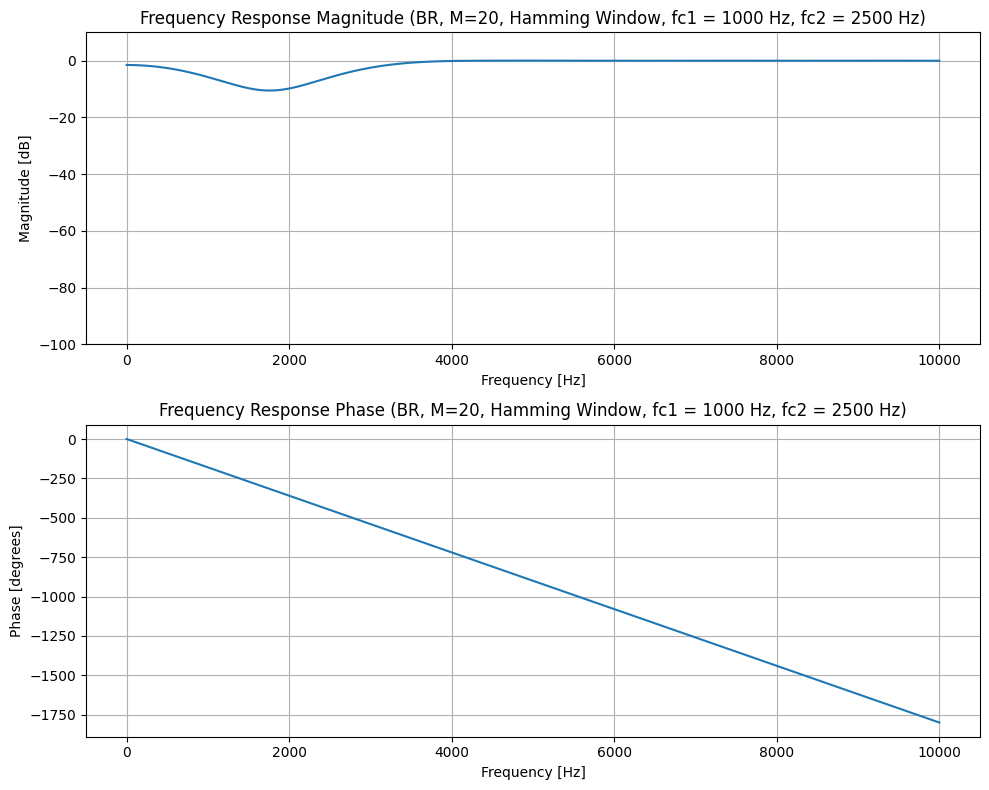

Comments for BR Filter (M=20, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=20, Window: Hann) ---


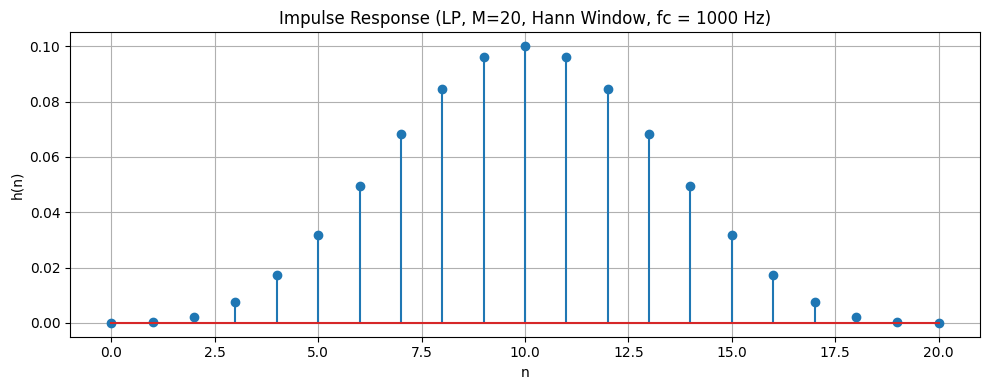

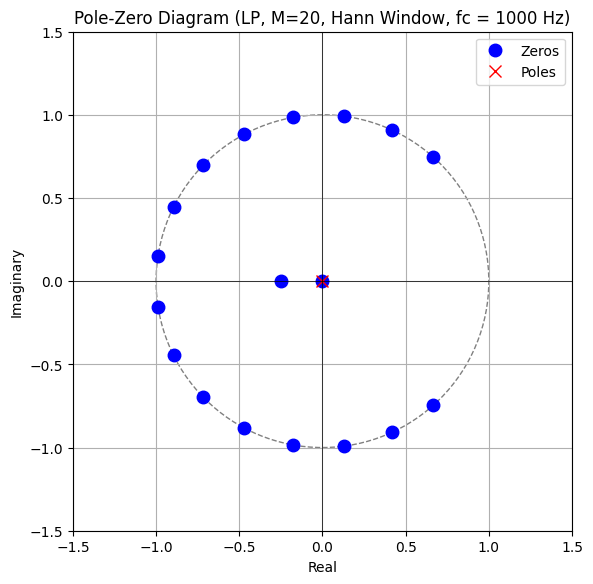

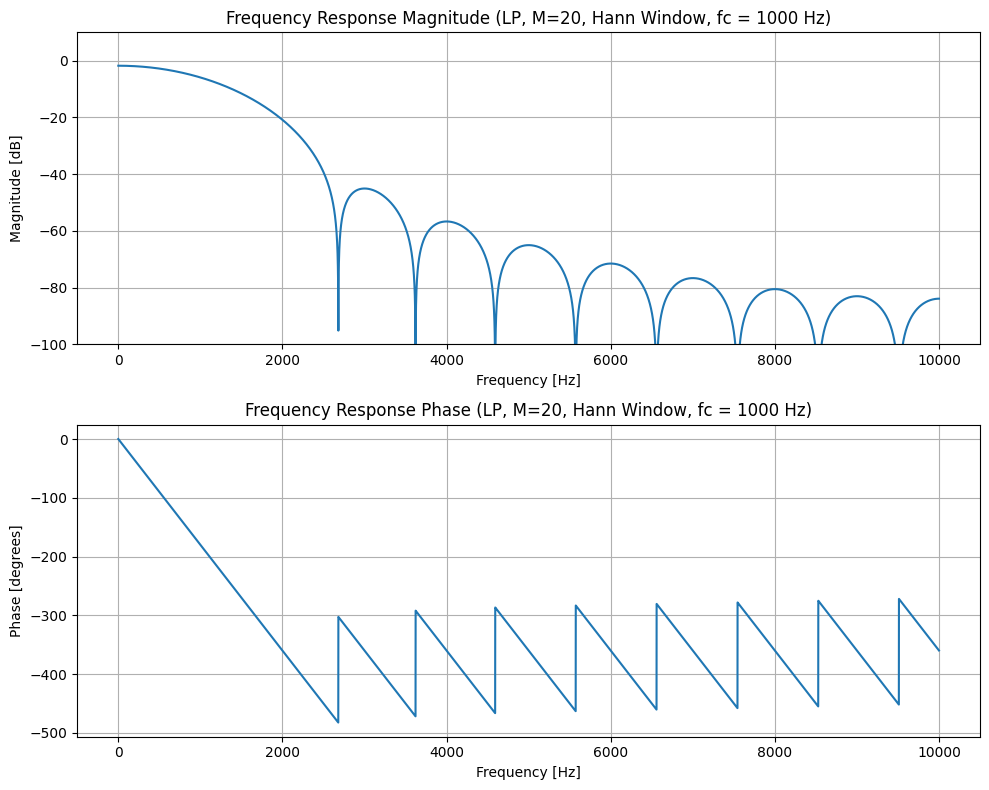

Comments for LP Filter (M=20, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Hann) ---


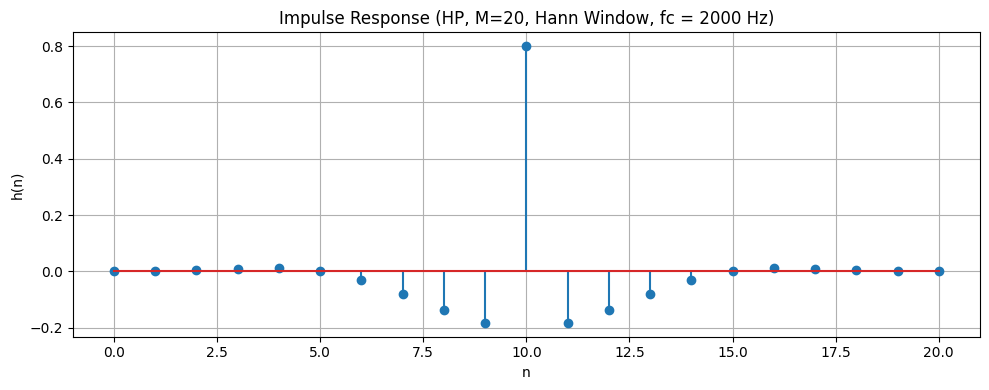

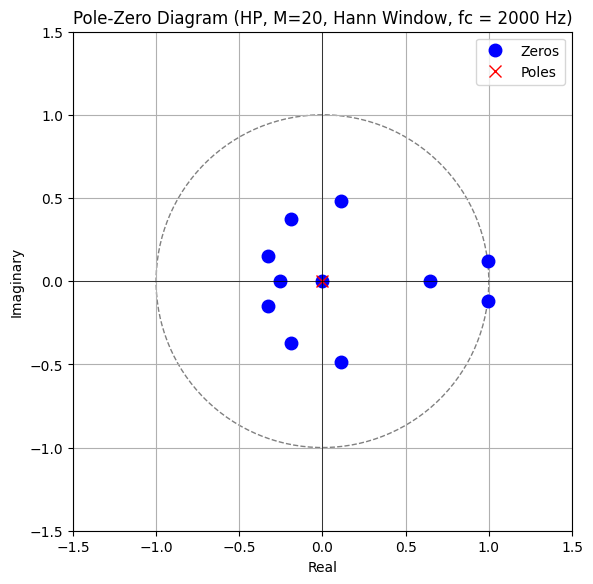

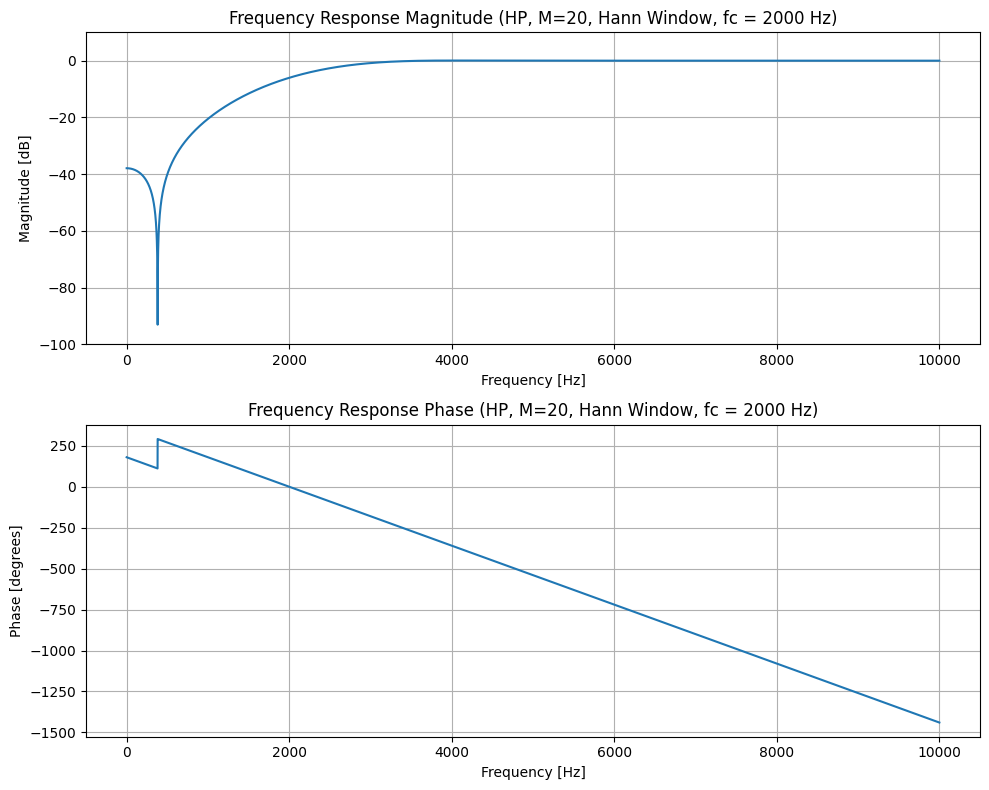

Comments for HP Filter (M=20, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Hann) ---


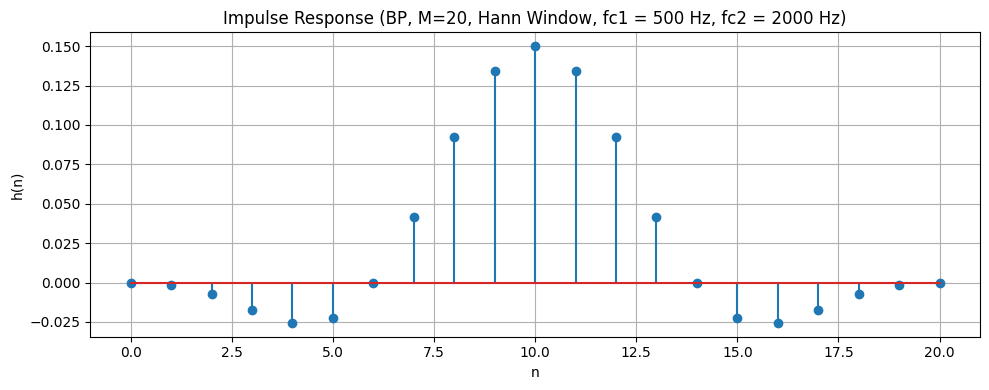

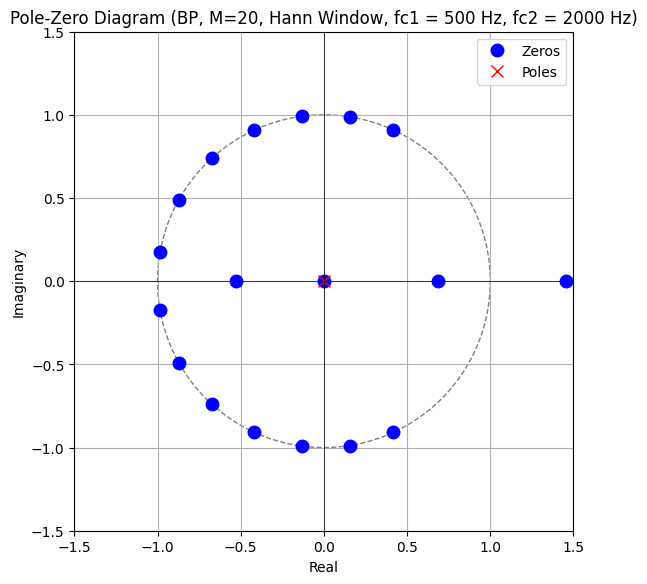

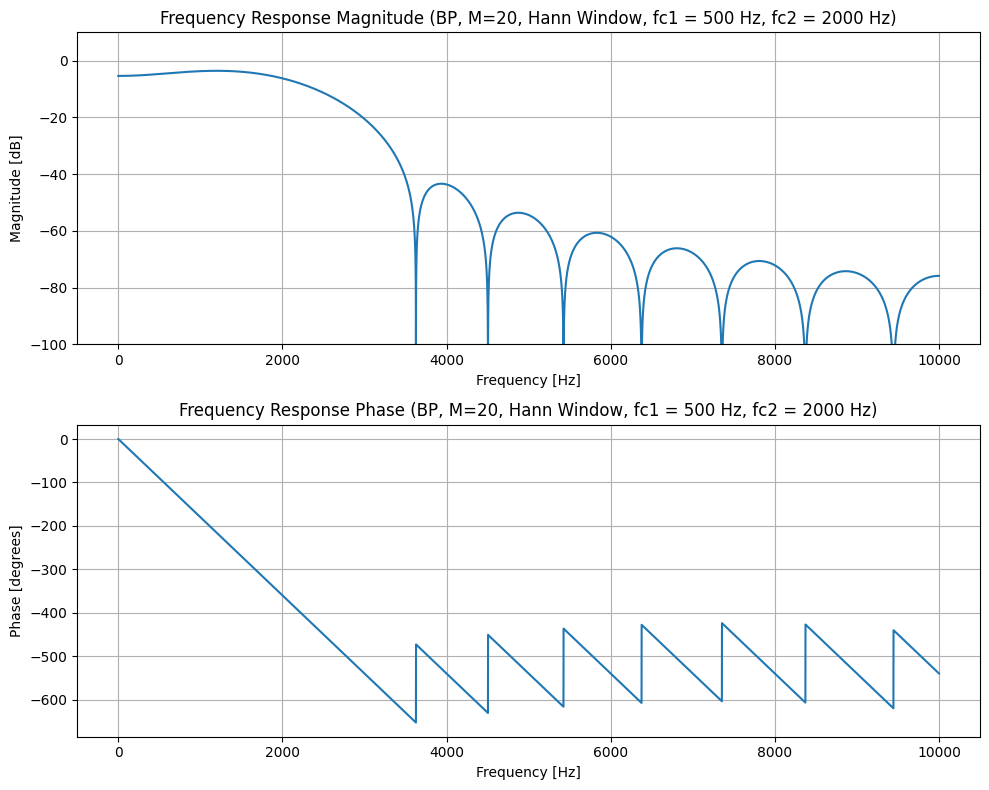

Comments for BP Filter (M=20, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Hann) ---


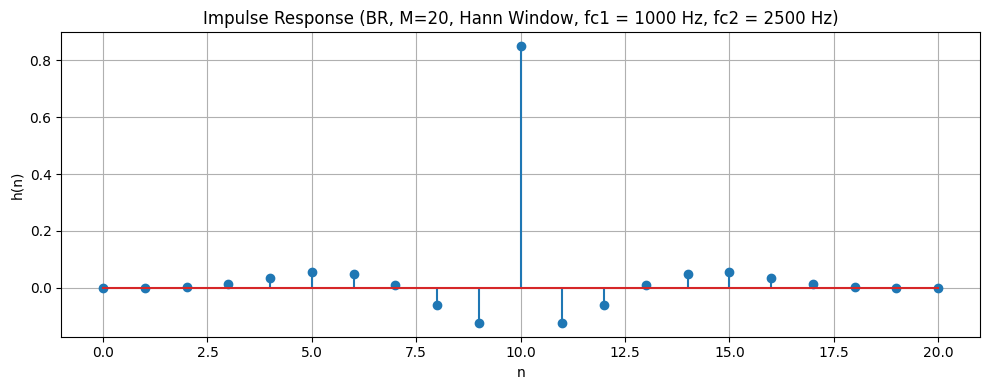

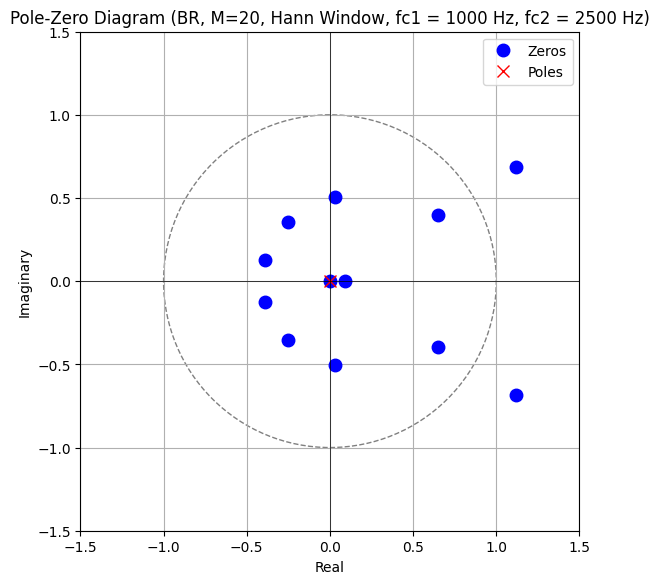

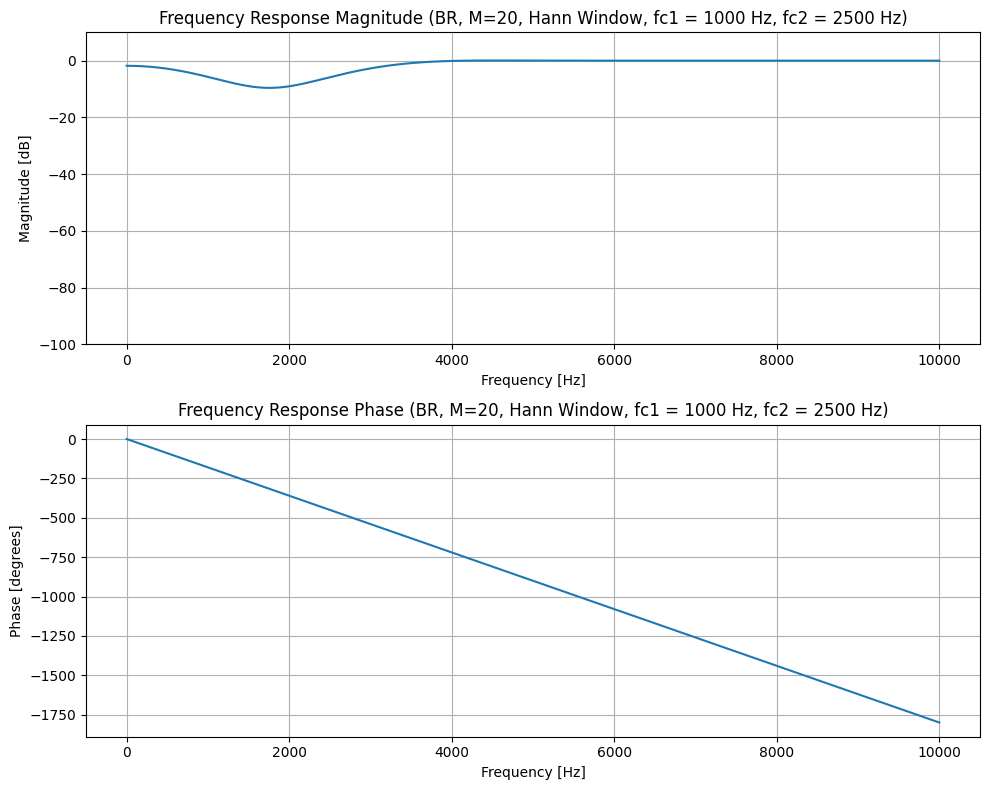

Comments for BR Filter (M=20, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=20, Window: Blackman) ---


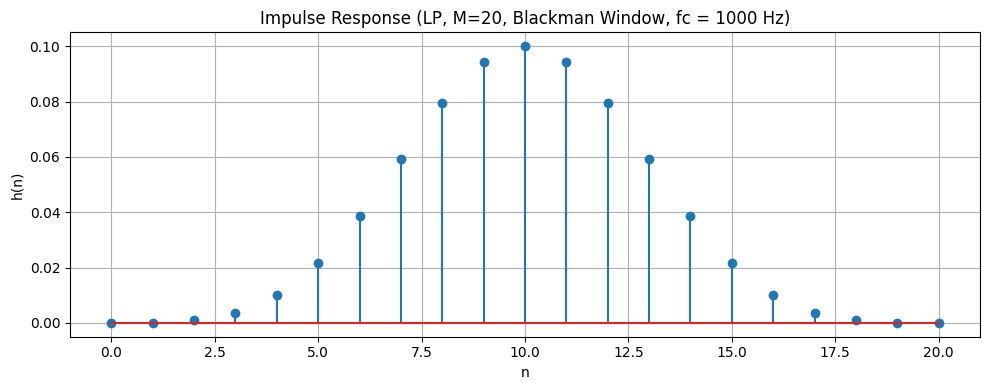

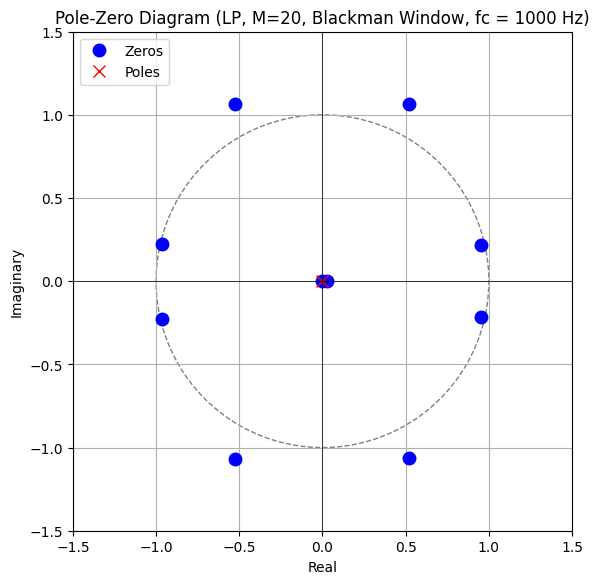

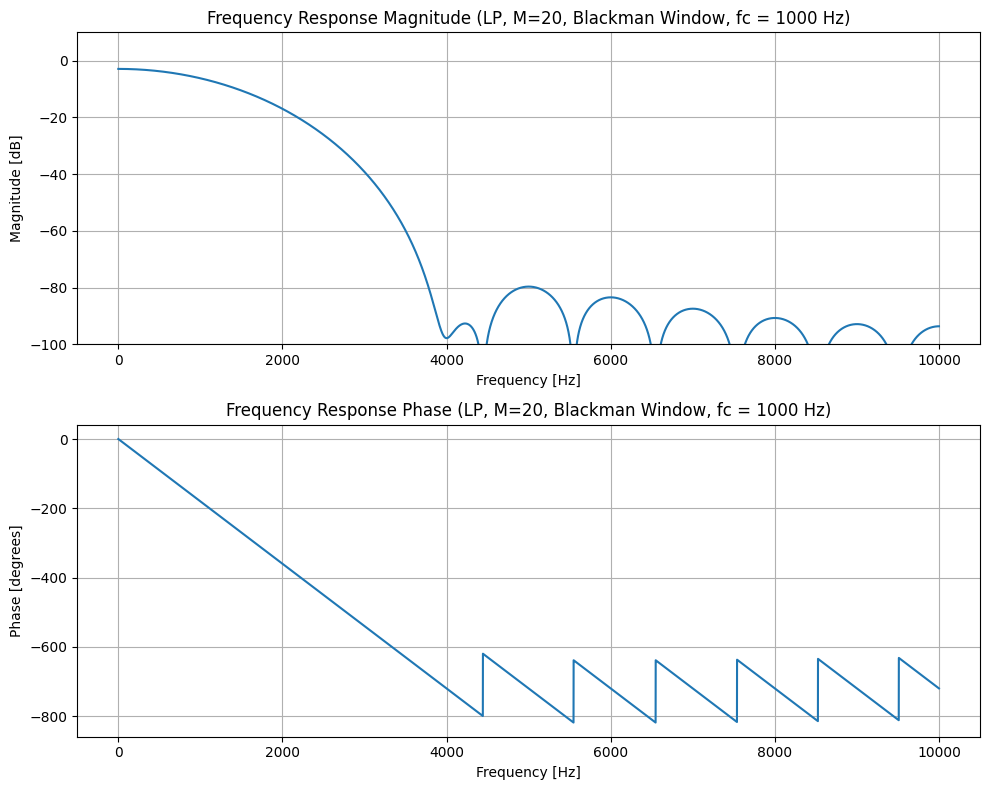

Comments for LP Filter (M=20, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing HP Filter (M=20, Window: Blackman) ---


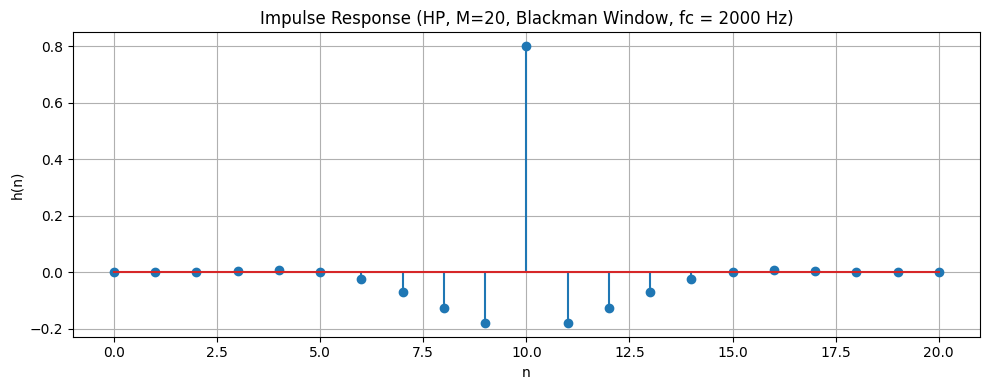

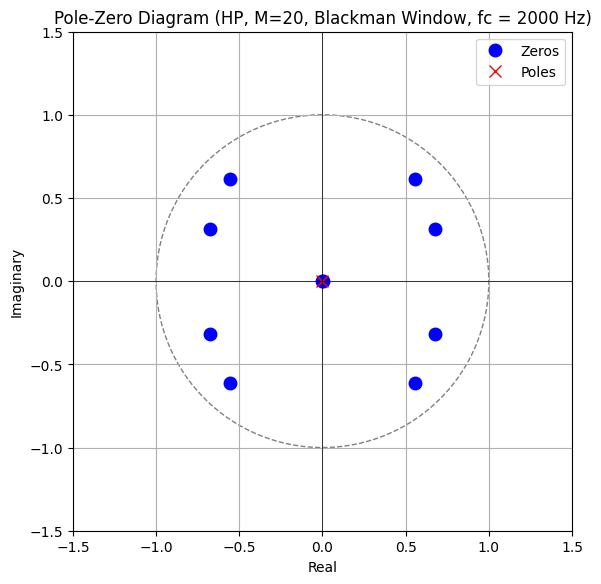

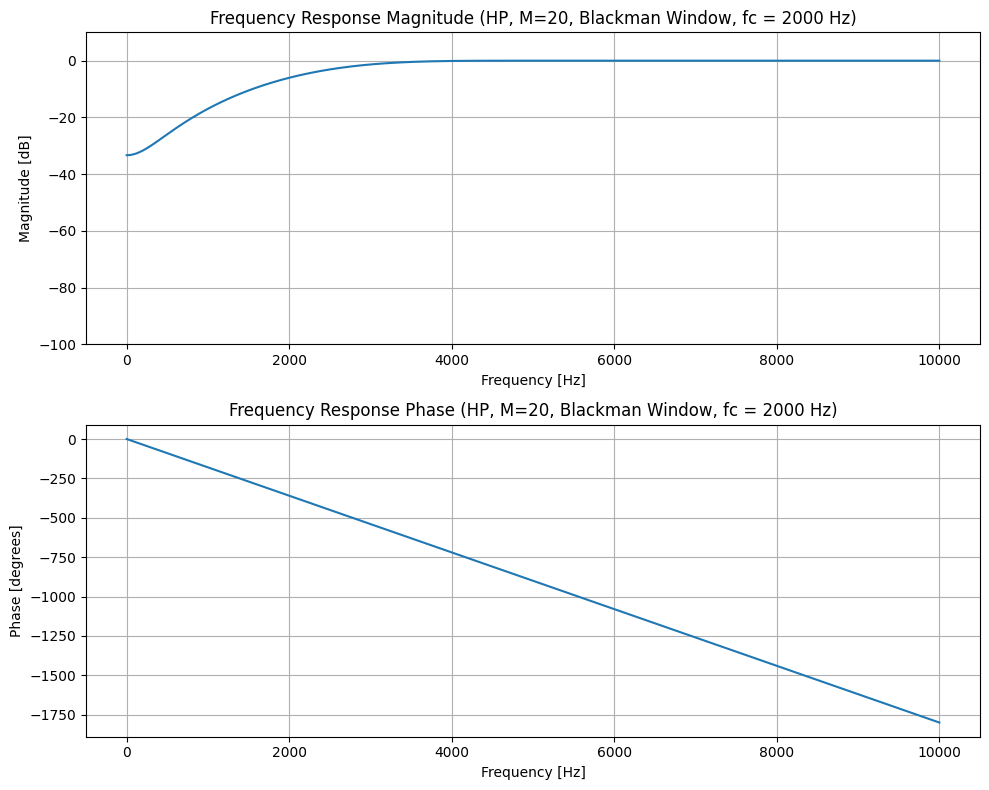

Comments for HP Filter (M=20, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BP Filter (M=20, Window: Blackman) ---


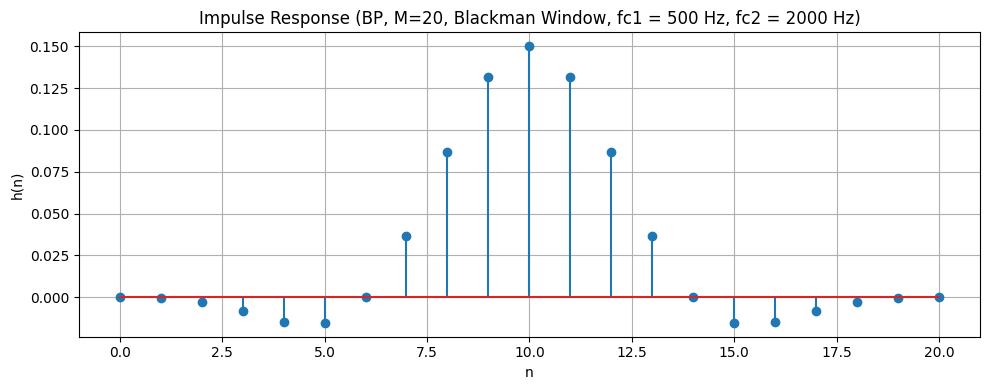

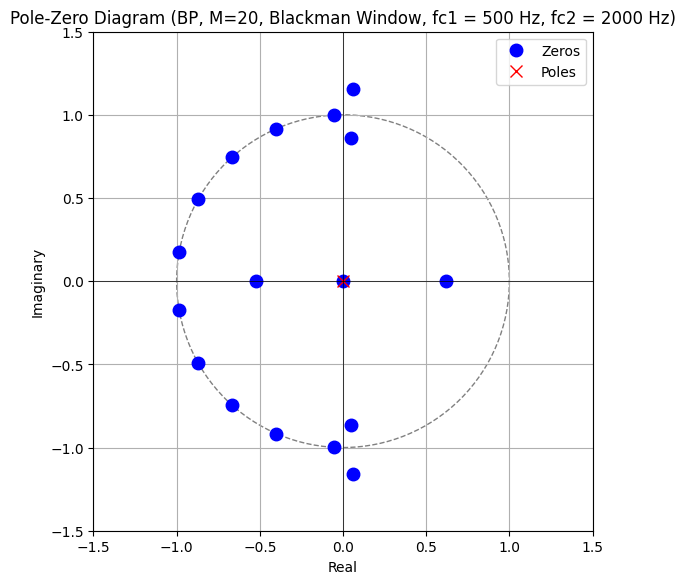

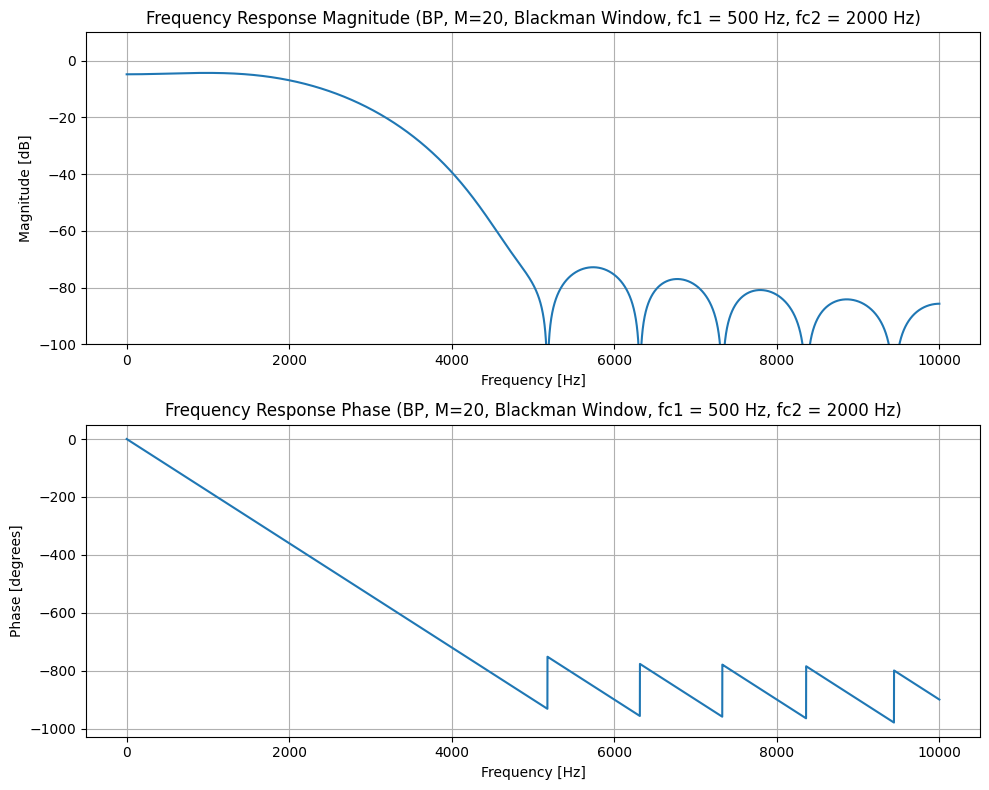

Comments for BP Filter (M=20, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing BR Filter (M=20, Window: Blackman) ---


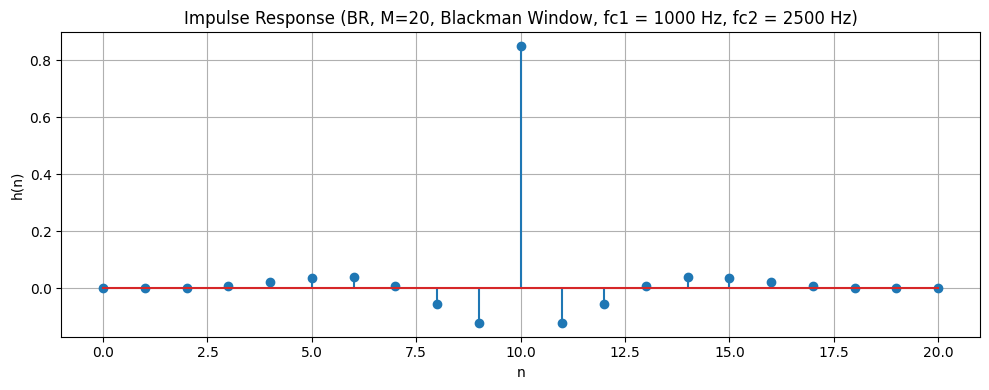

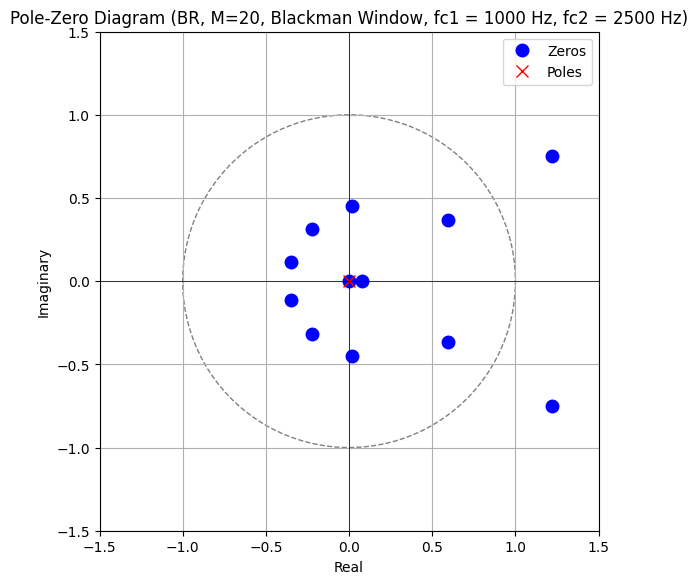

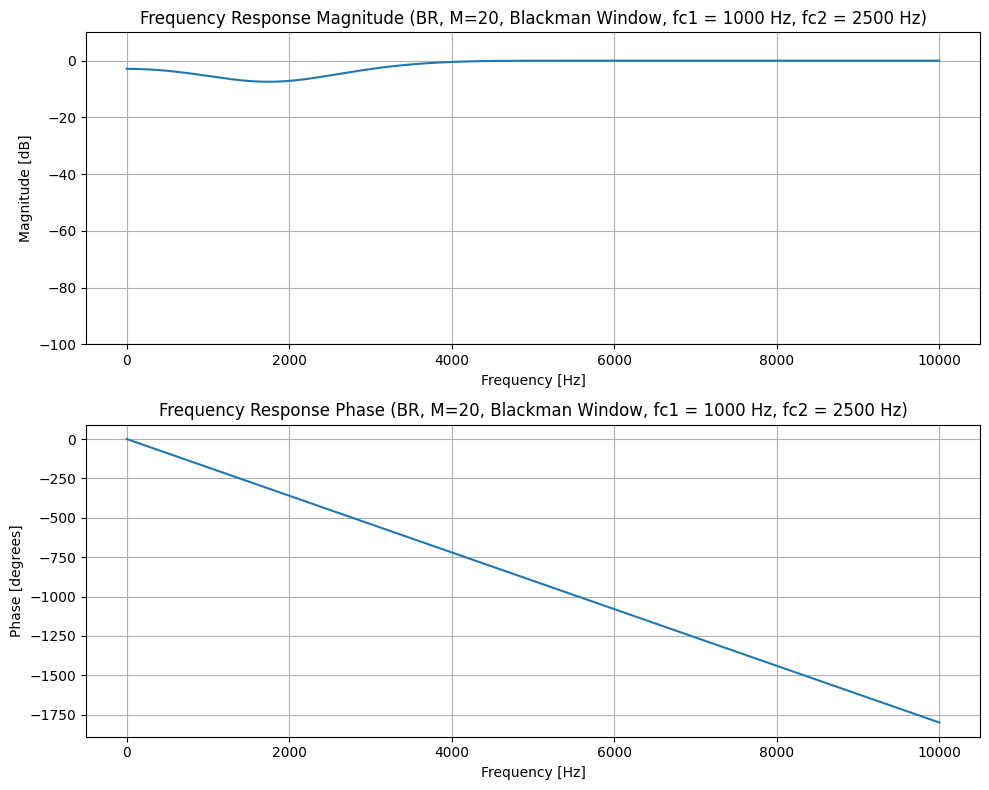

Comments for BR Filter (M=20, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=20: Lower order filters generally have wider transition bands and less stopband attenuation. They are computationally less expensive.

--- Designing LP Filter (M=50, Window: Rectangular) ---


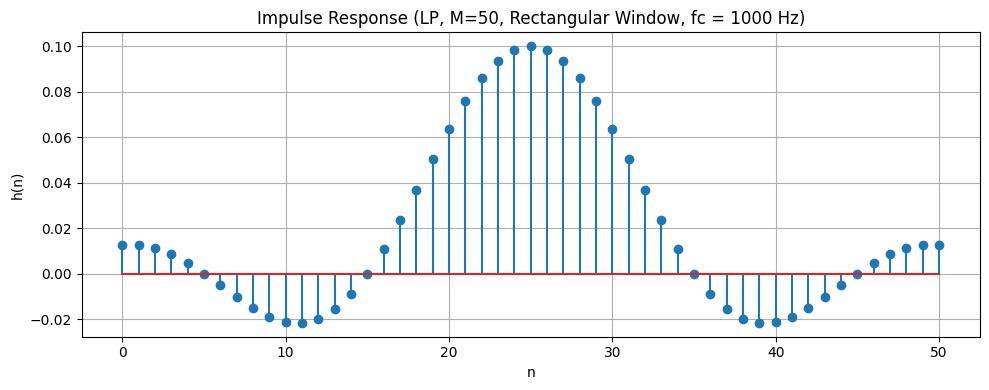

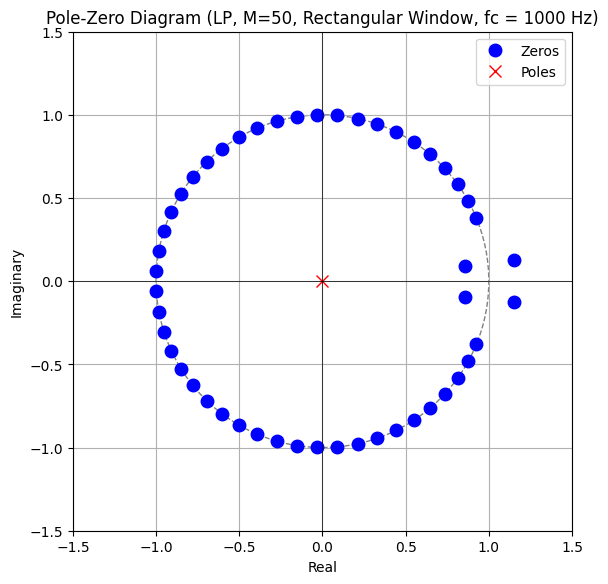

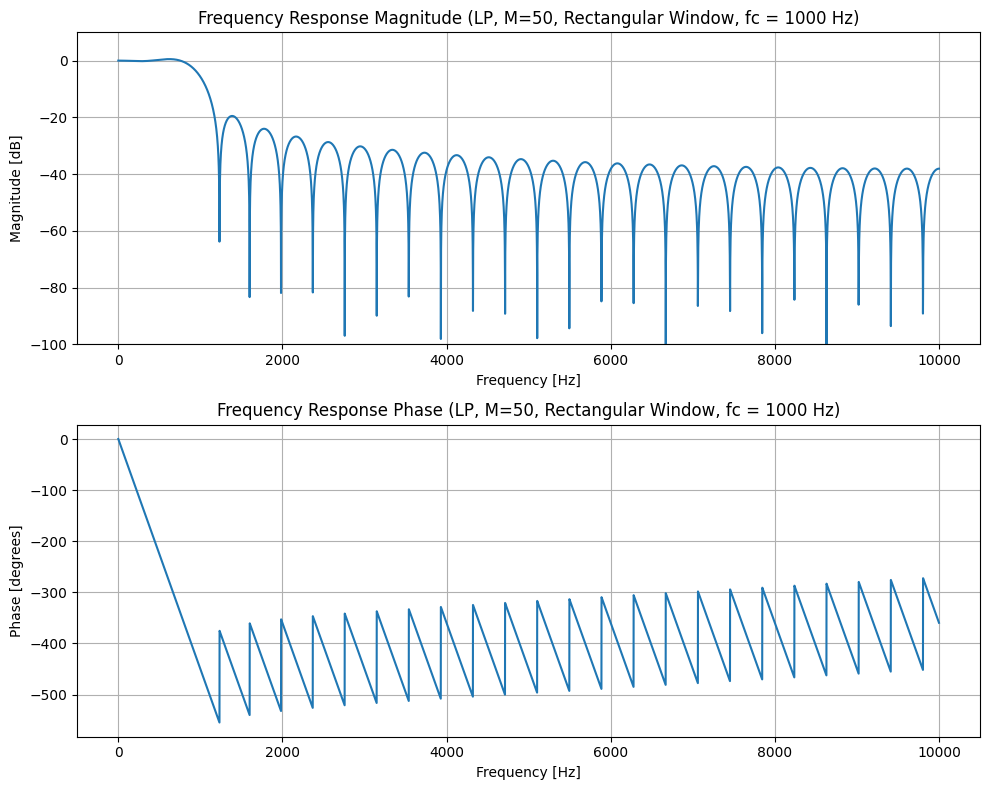

Comments for LP Filter (M=50, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Rectangular) ---


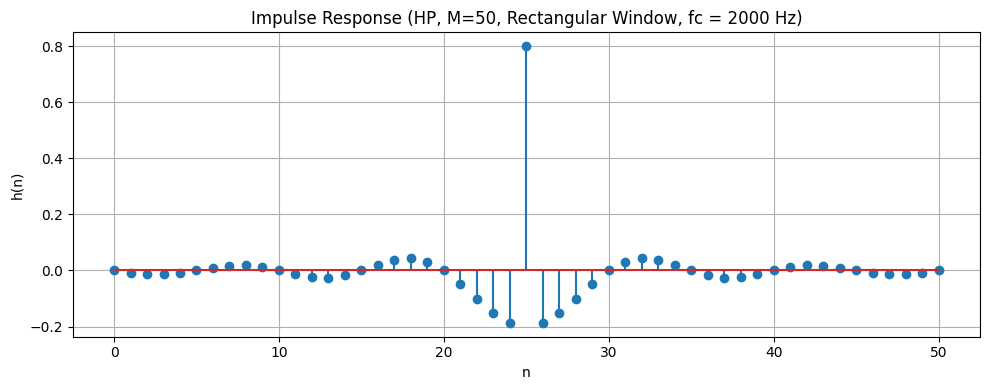

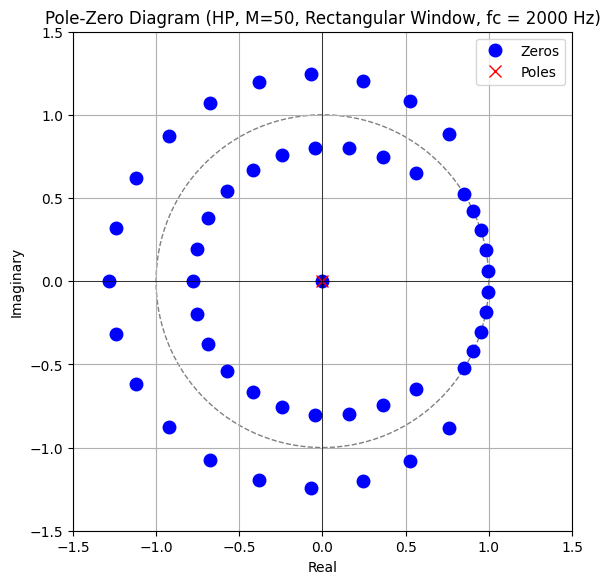

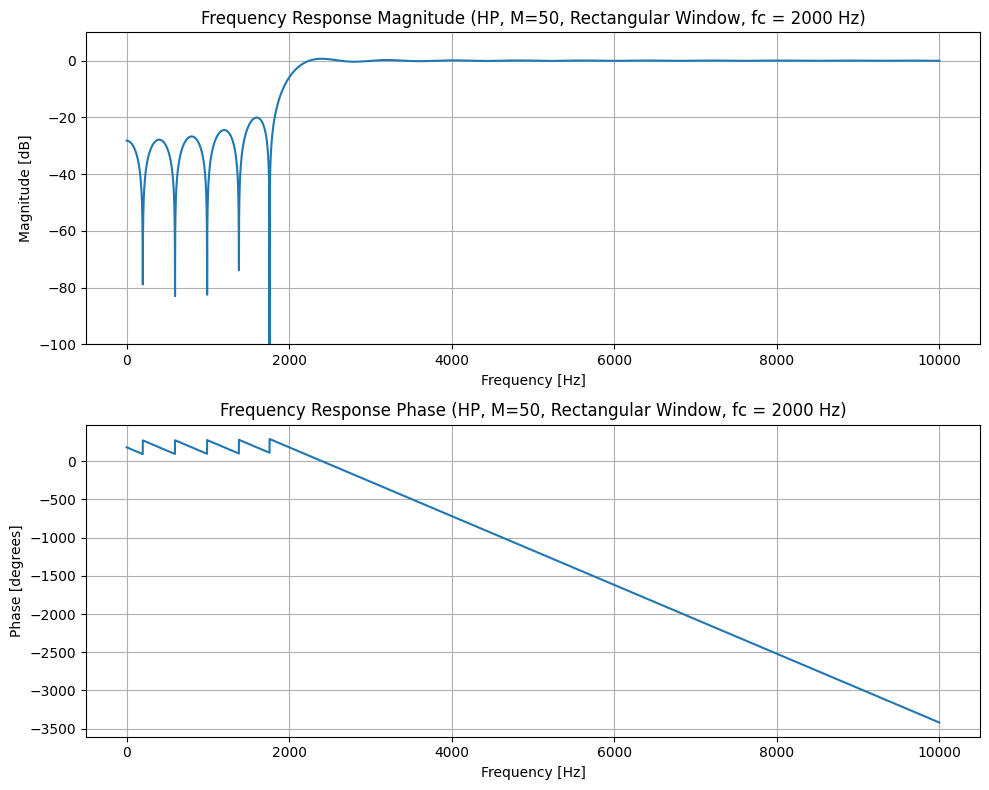

Comments for HP Filter (M=50, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Rectangular) ---


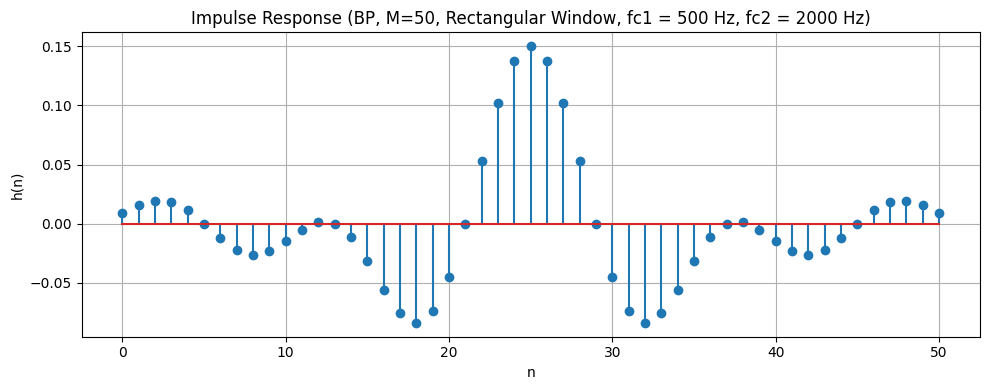

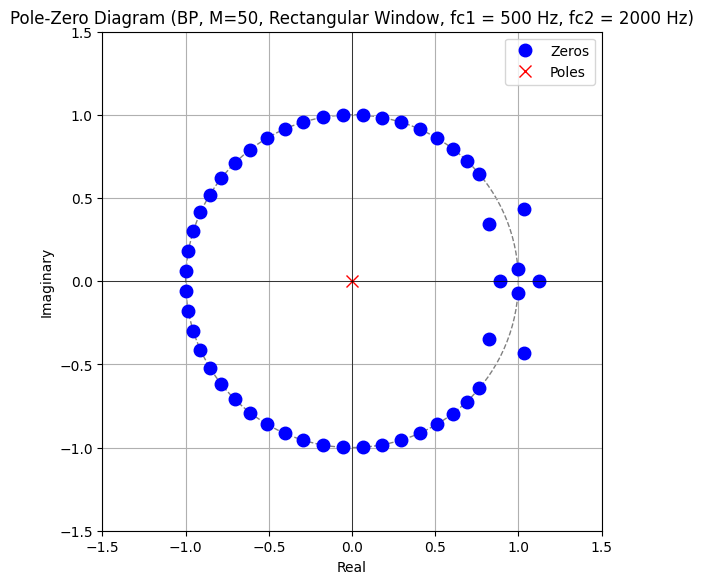

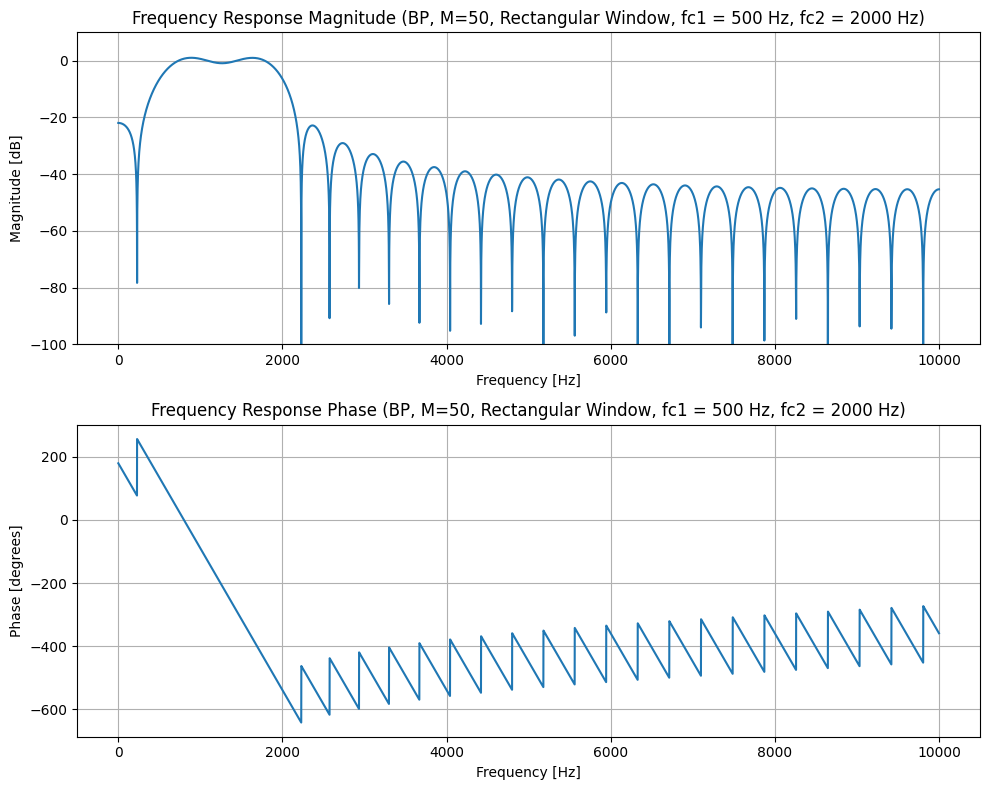

Comments for BP Filter (M=50, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Rectangular) ---


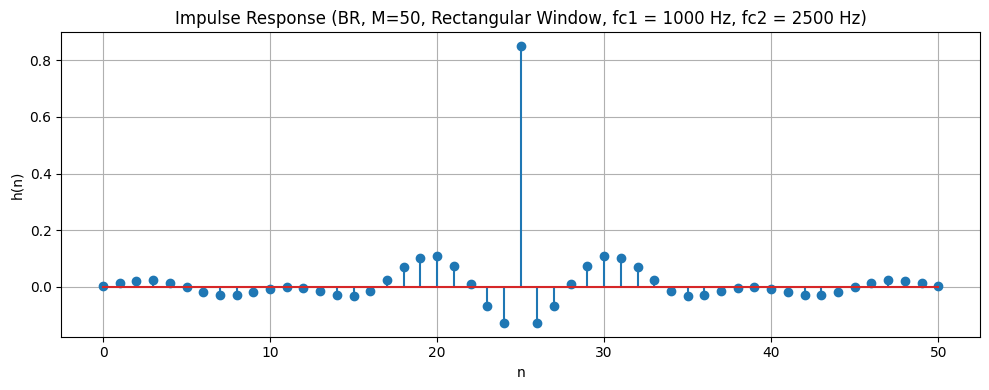

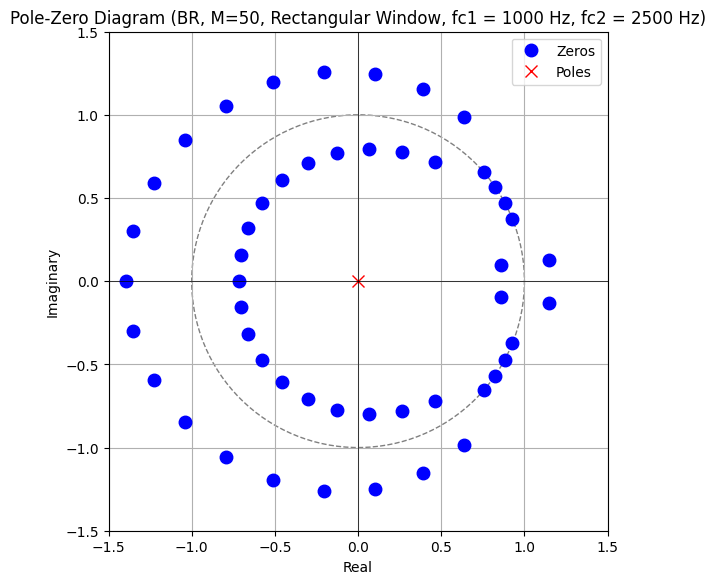

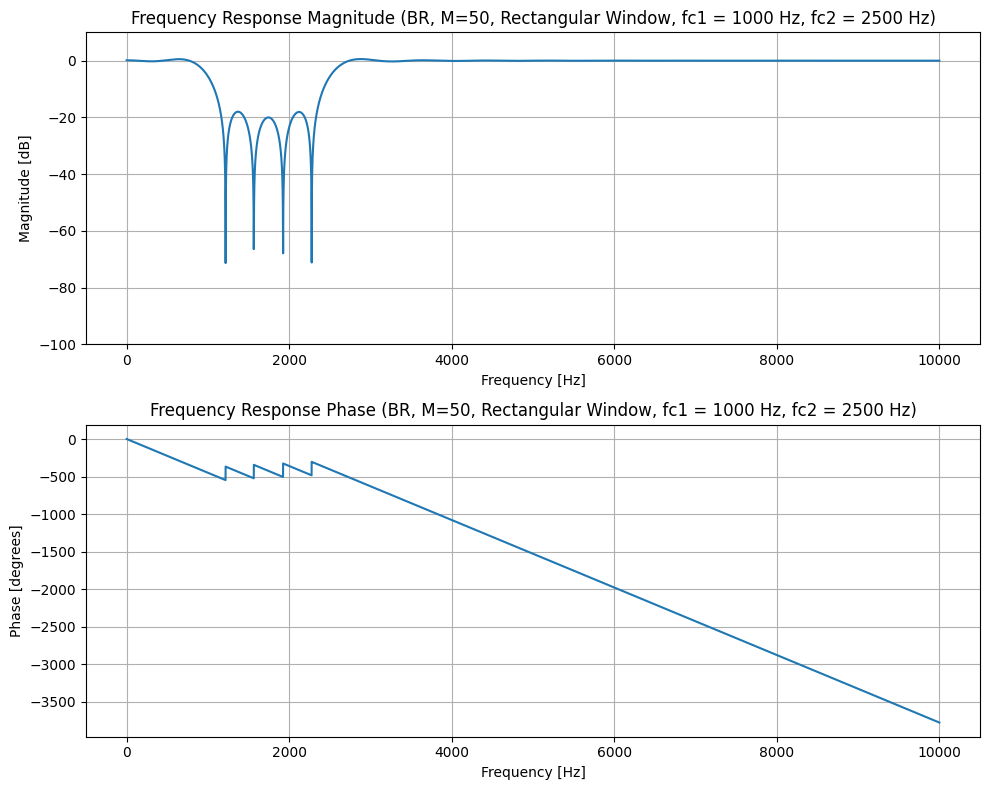

Comments for BR Filter (M=50, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=50, Window: Triangular) ---


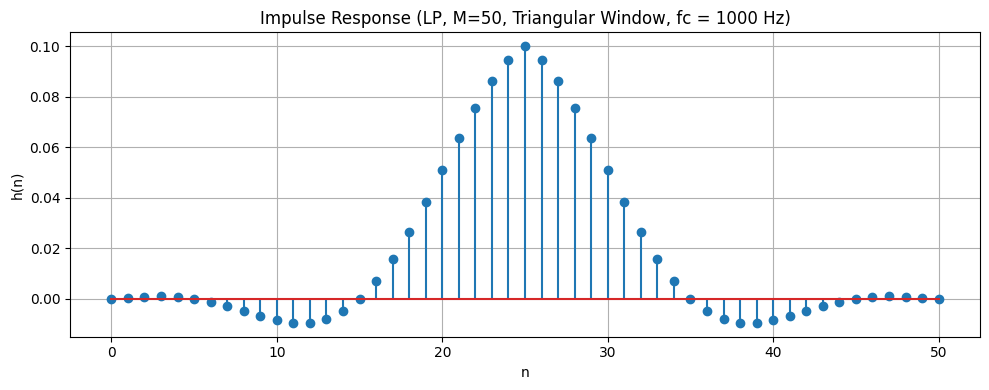

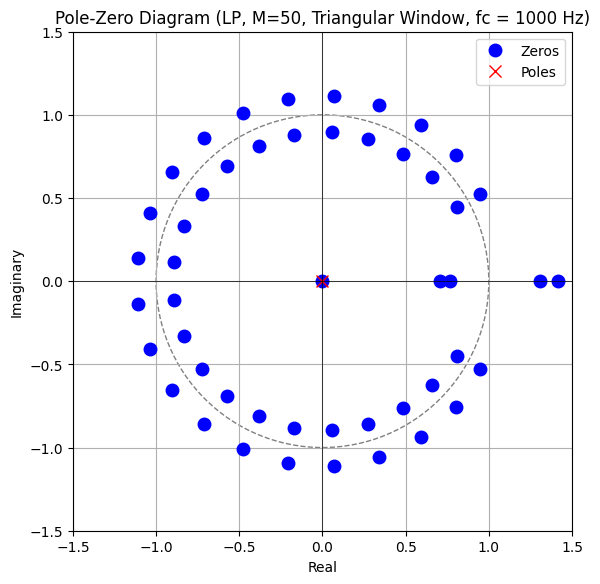

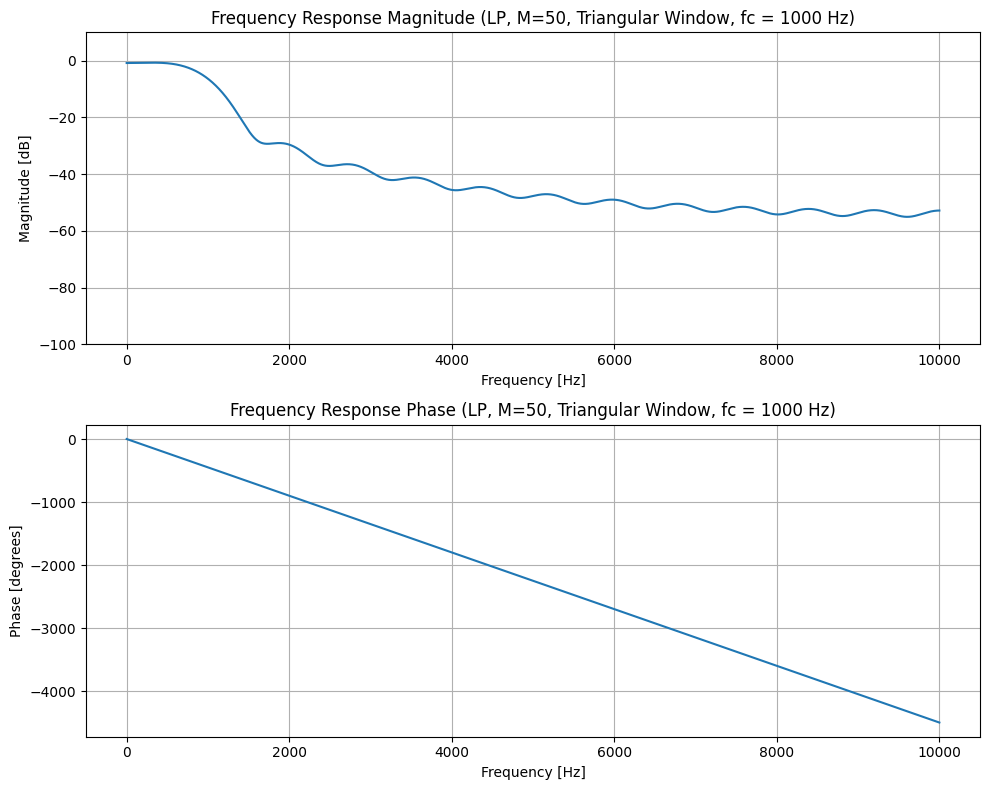

Comments for LP Filter (M=50, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Triangular) ---


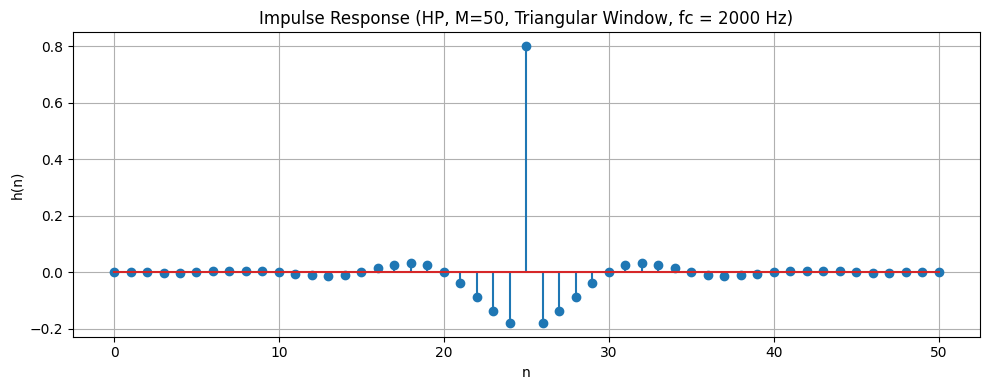

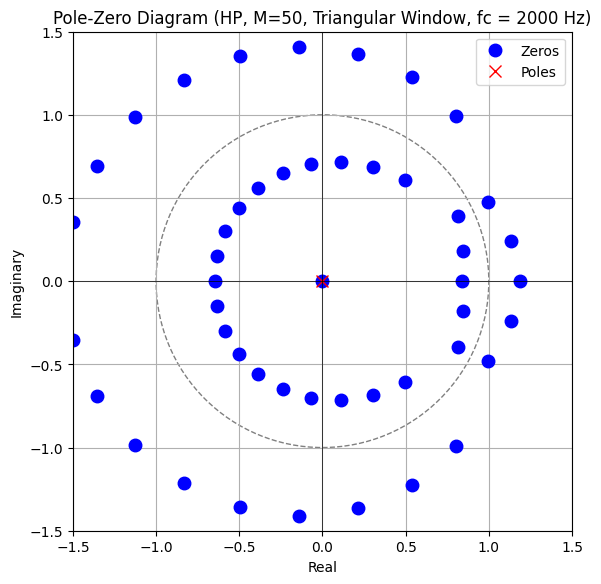

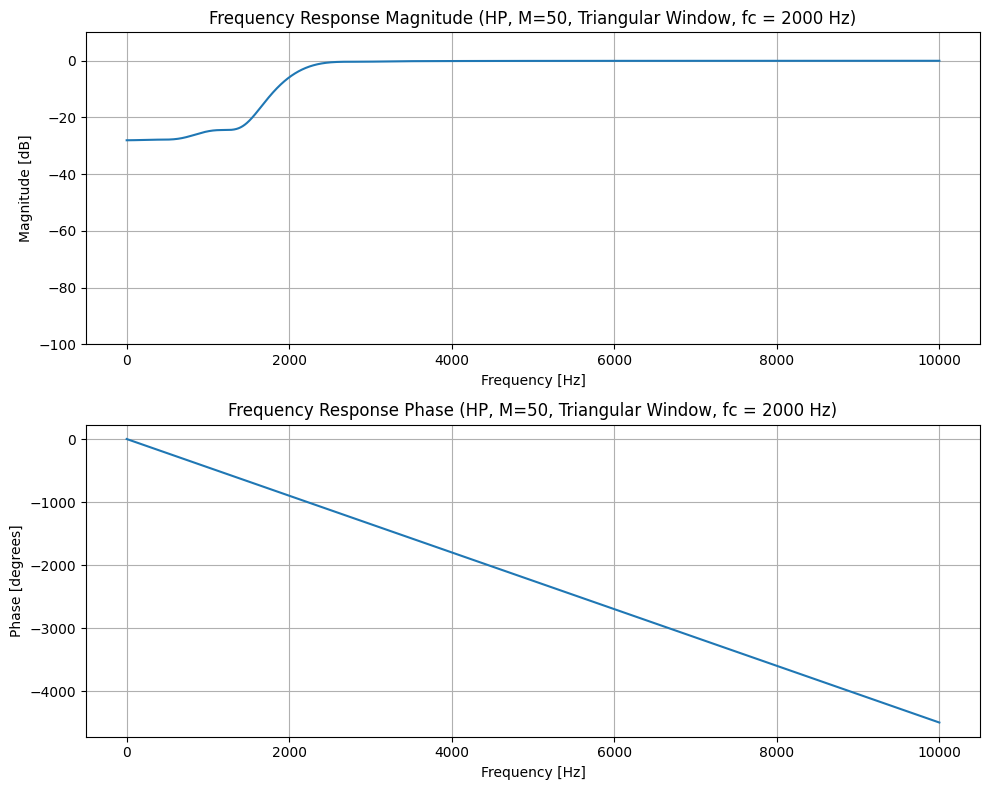

Comments for HP Filter (M=50, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Triangular) ---


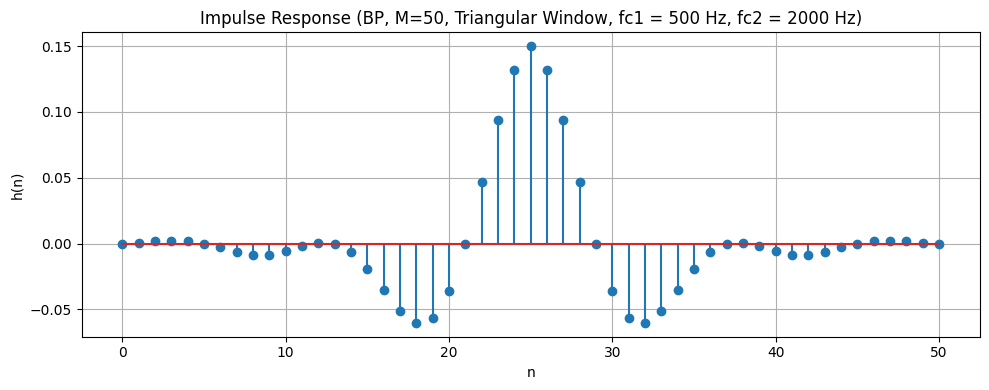

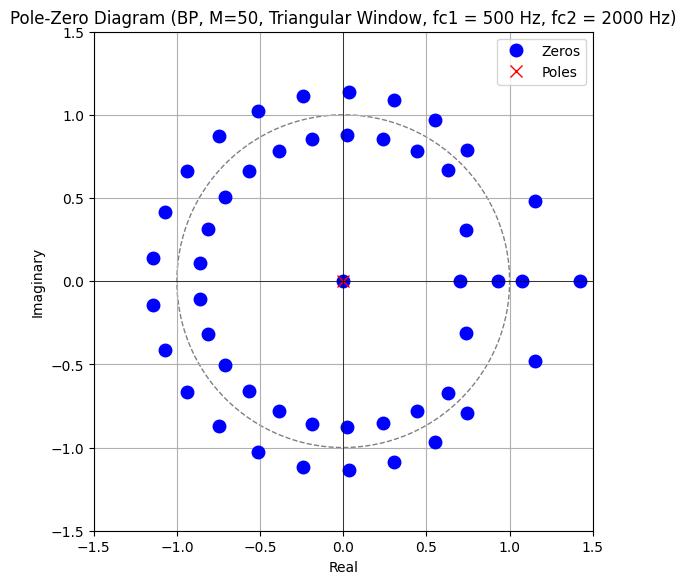

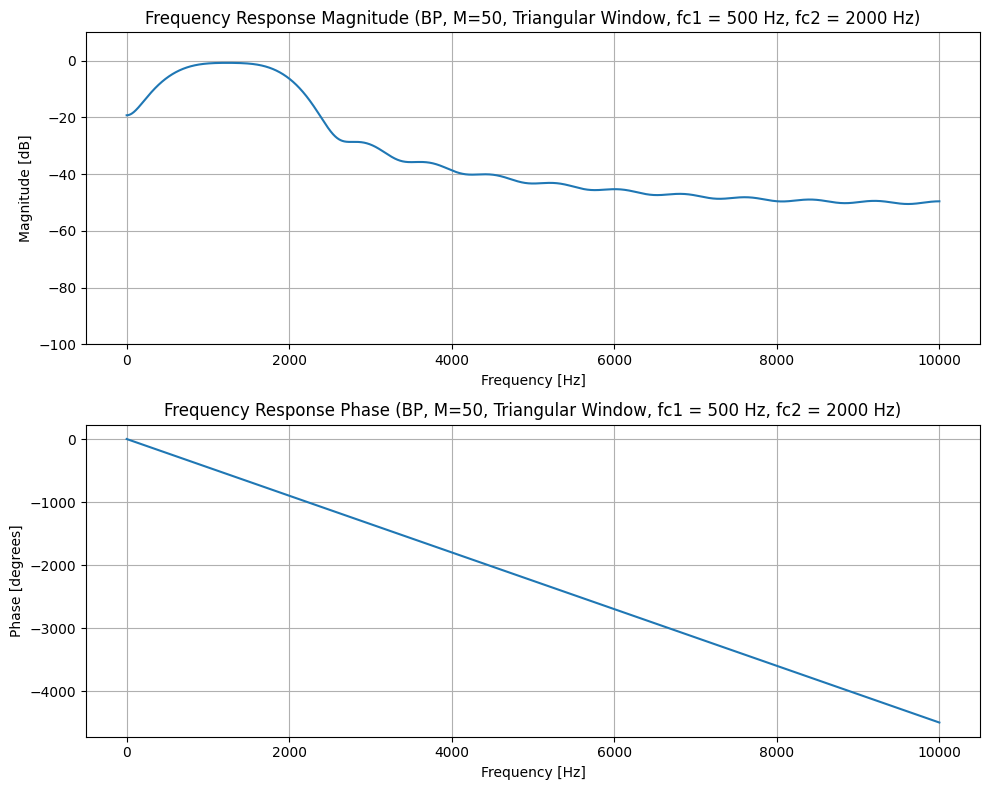

Comments for BP Filter (M=50, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Triangular) ---


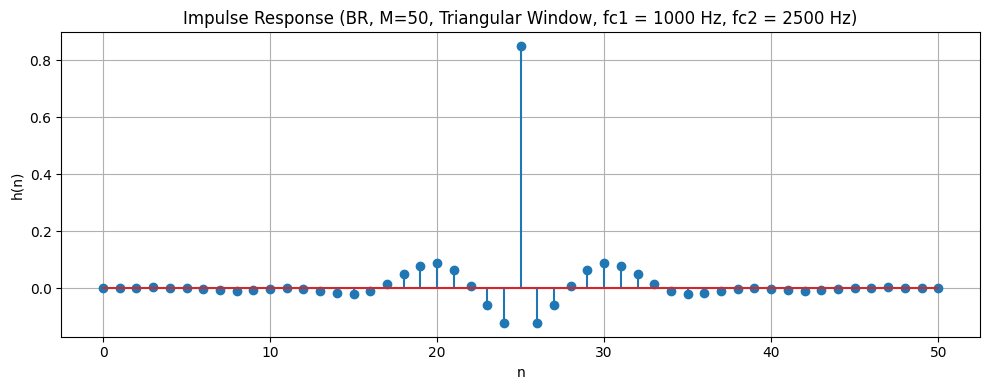

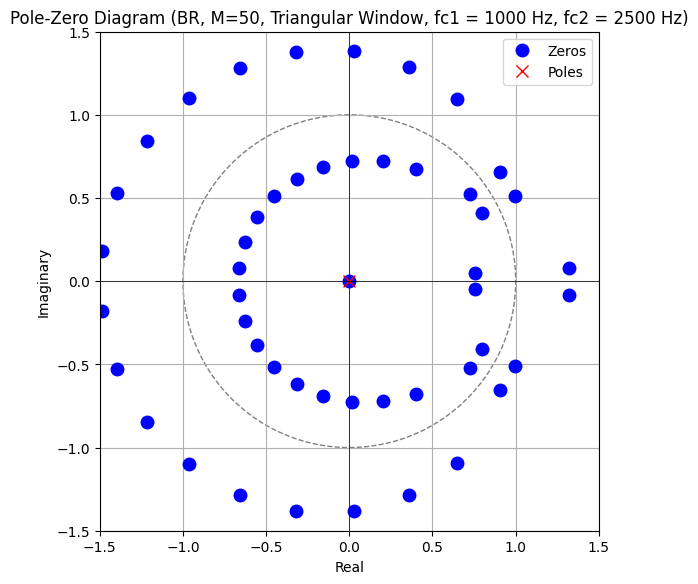

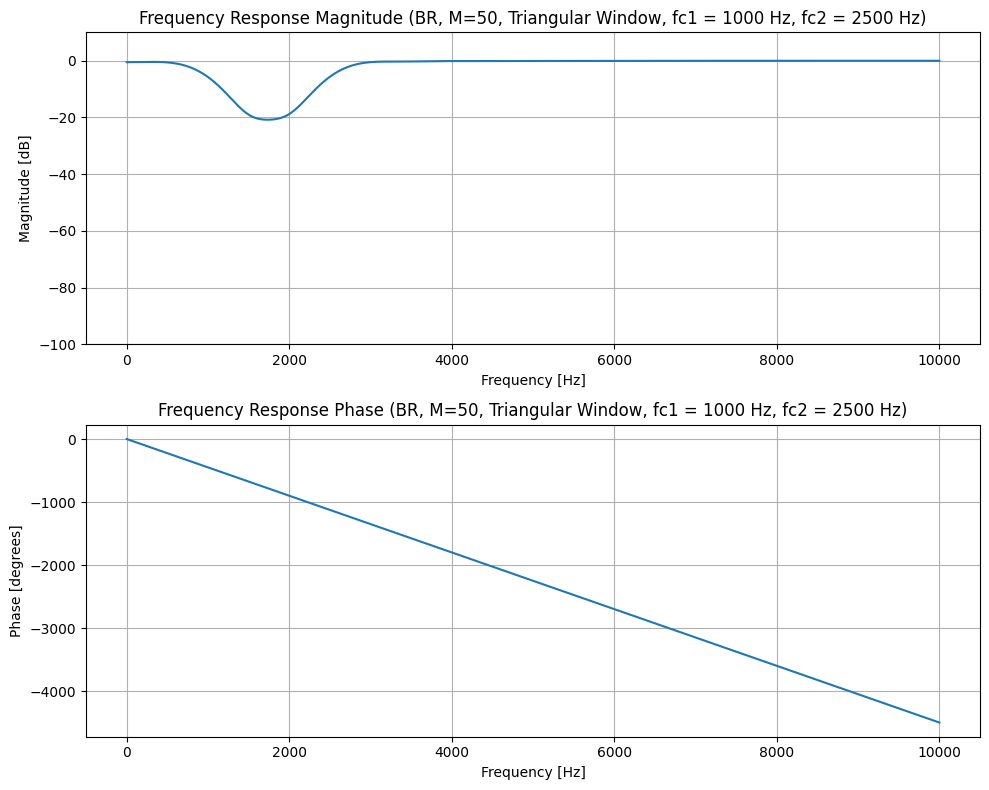

Comments for BR Filter (M=50, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=50, Window: Bartlett) ---


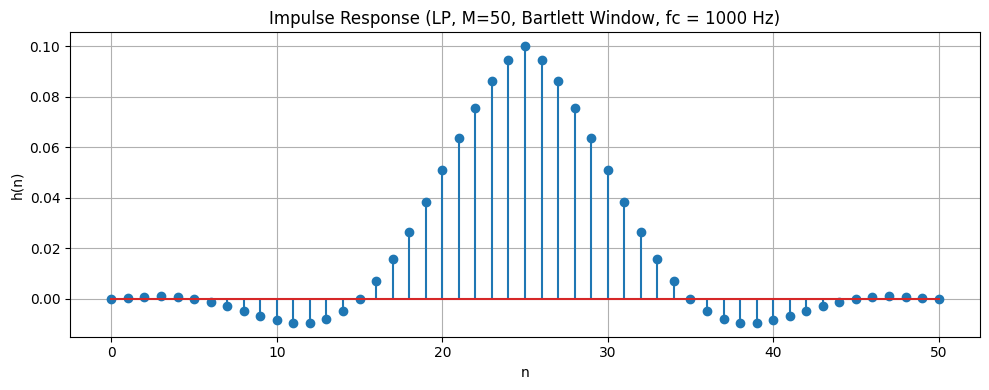

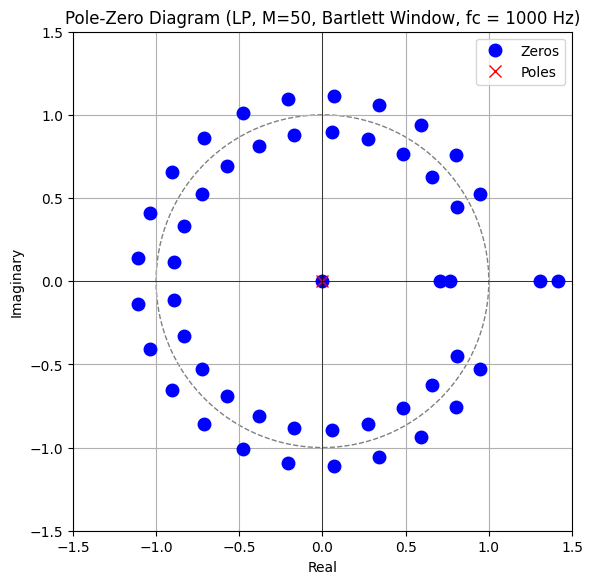

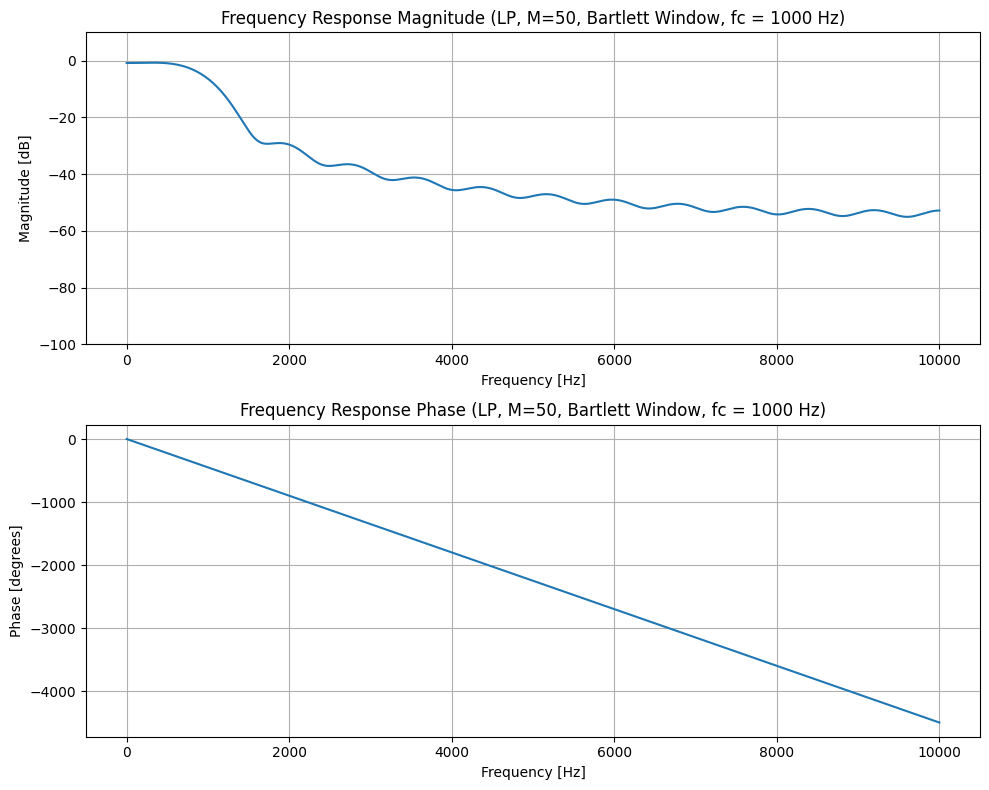

Comments for LP Filter (M=50, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Bartlett) ---


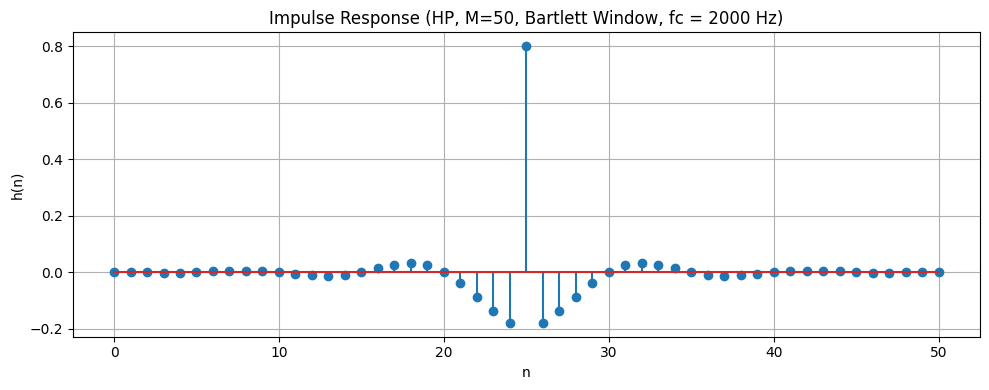

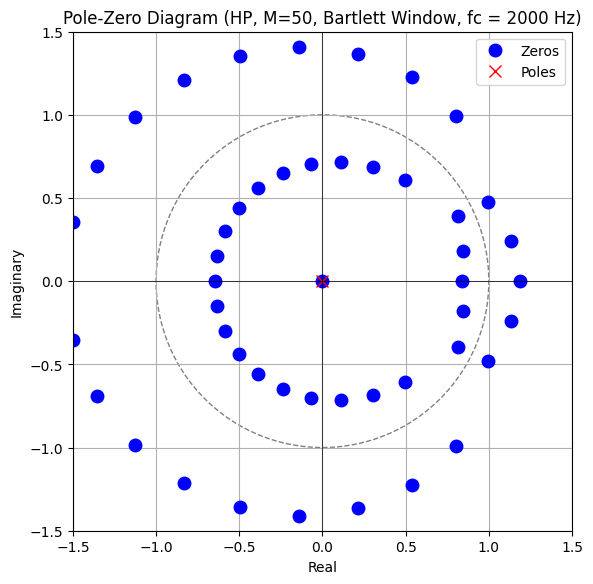

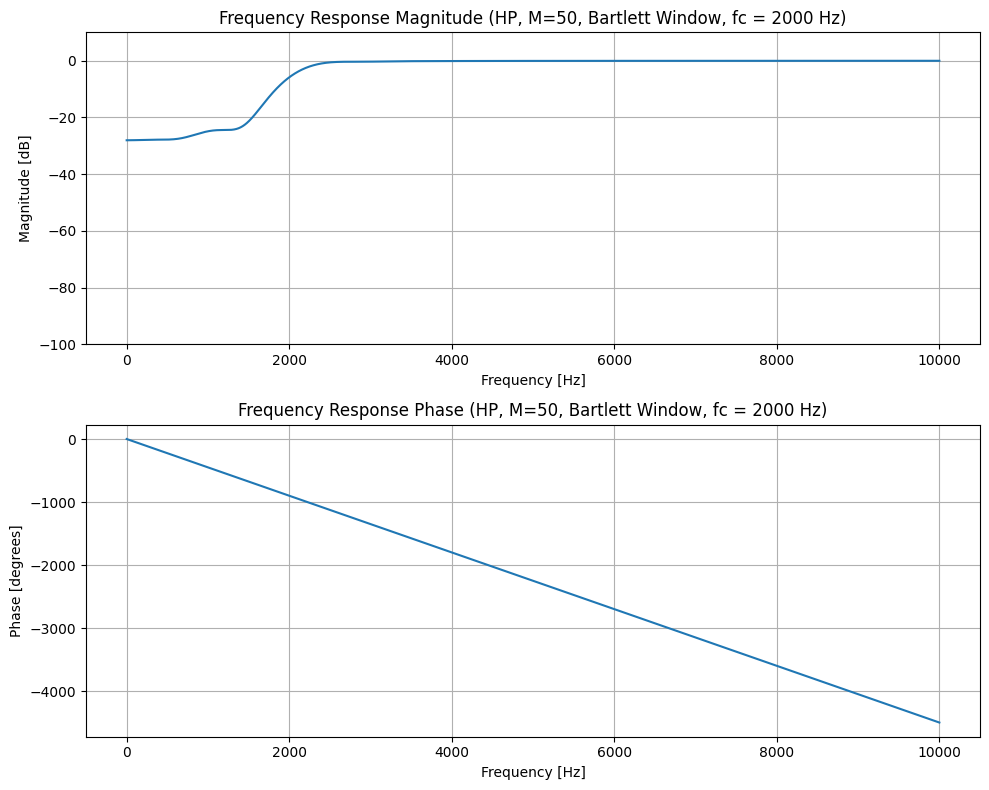

Comments for HP Filter (M=50, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Bartlett) ---


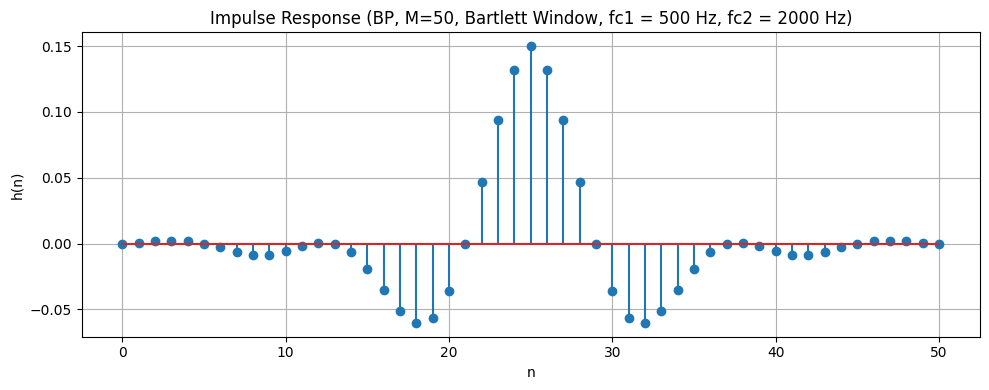

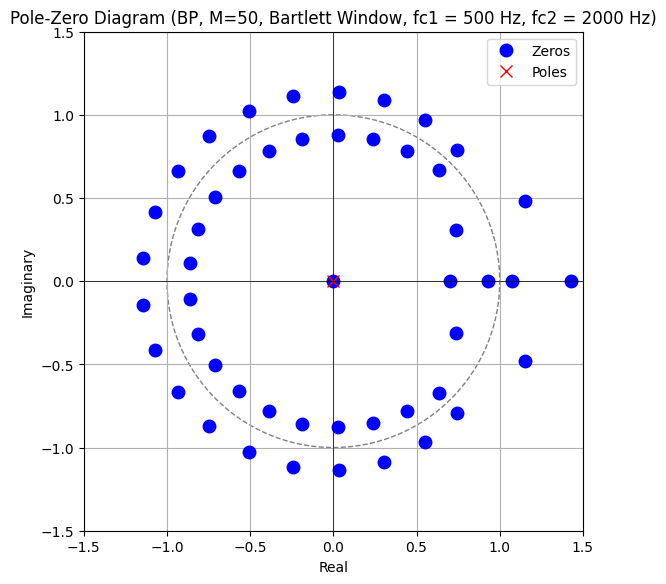

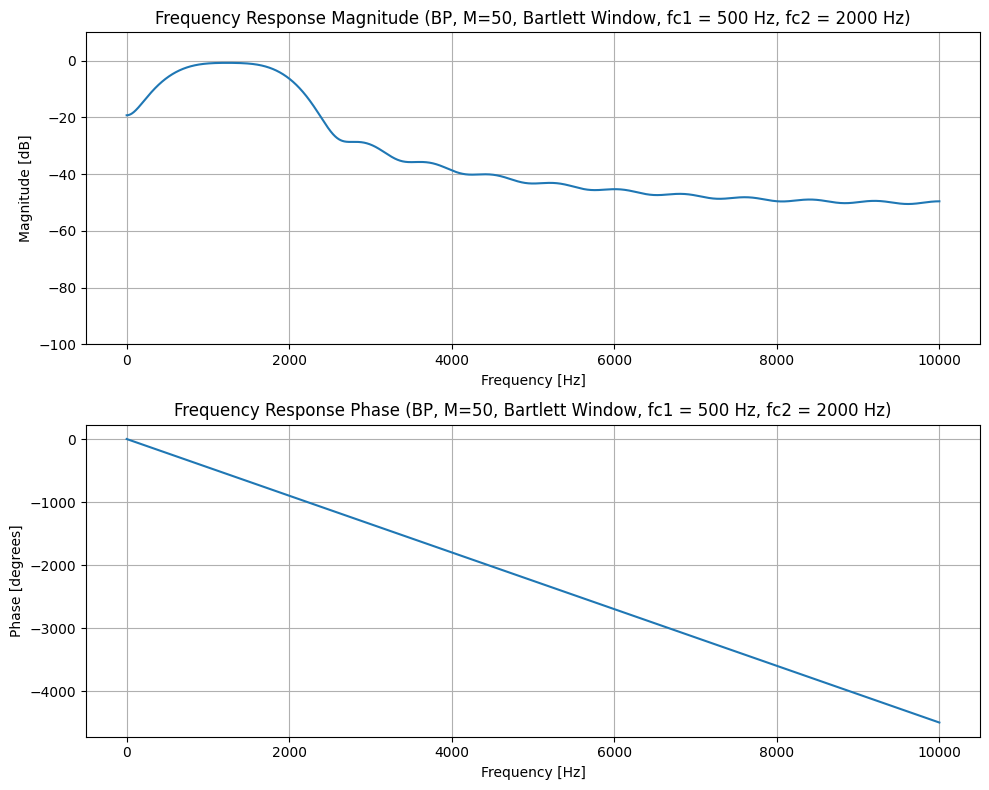

Comments for BP Filter (M=50, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Bartlett) ---


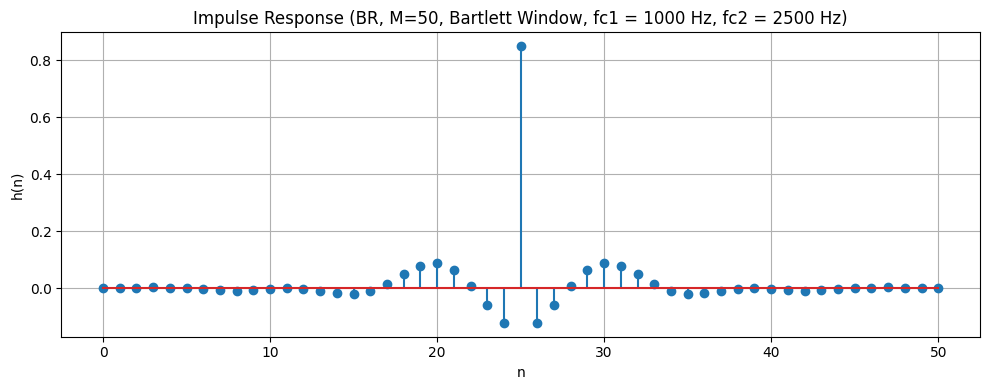

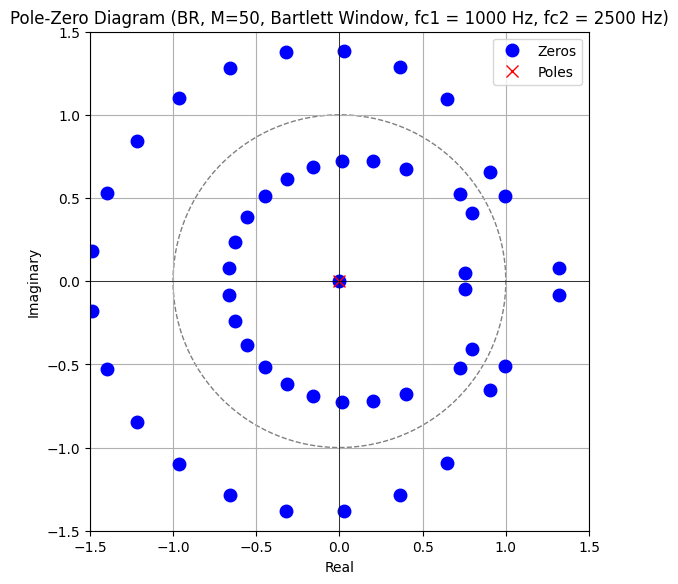

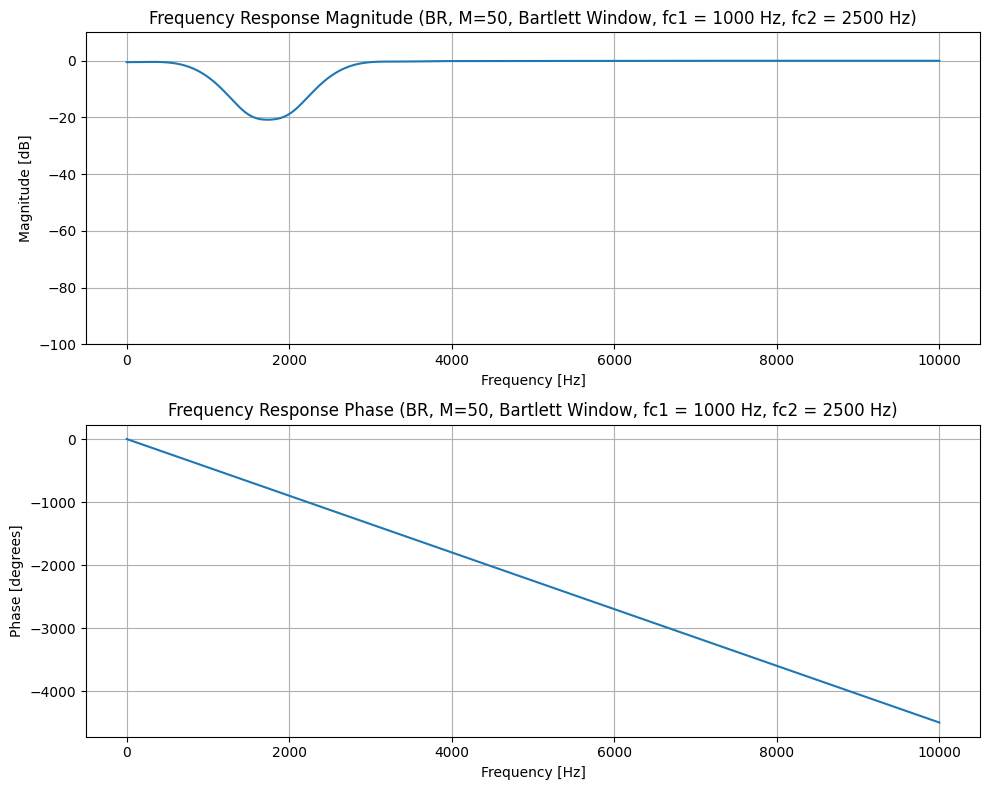

Comments for BR Filter (M=50, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=50, Window: Hamming) ---


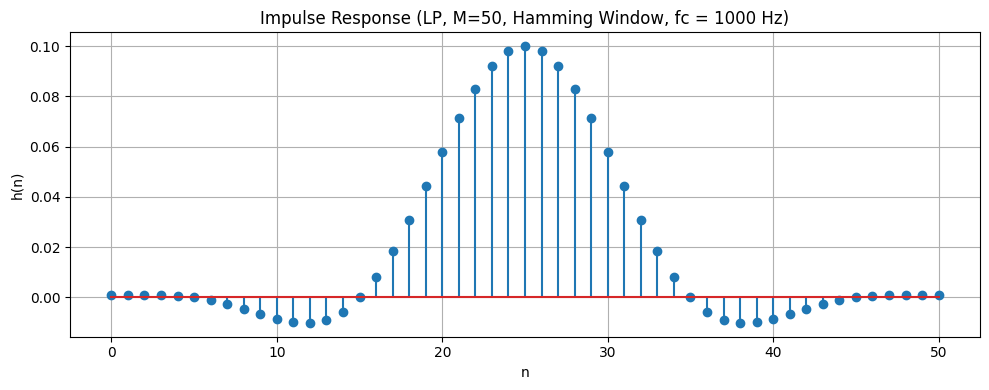

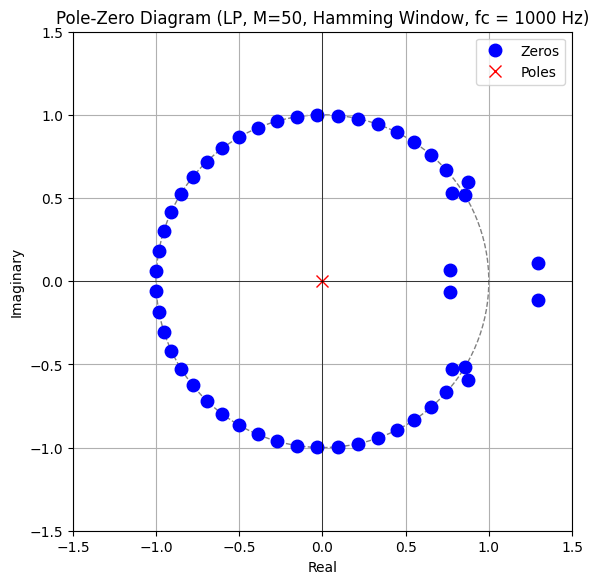

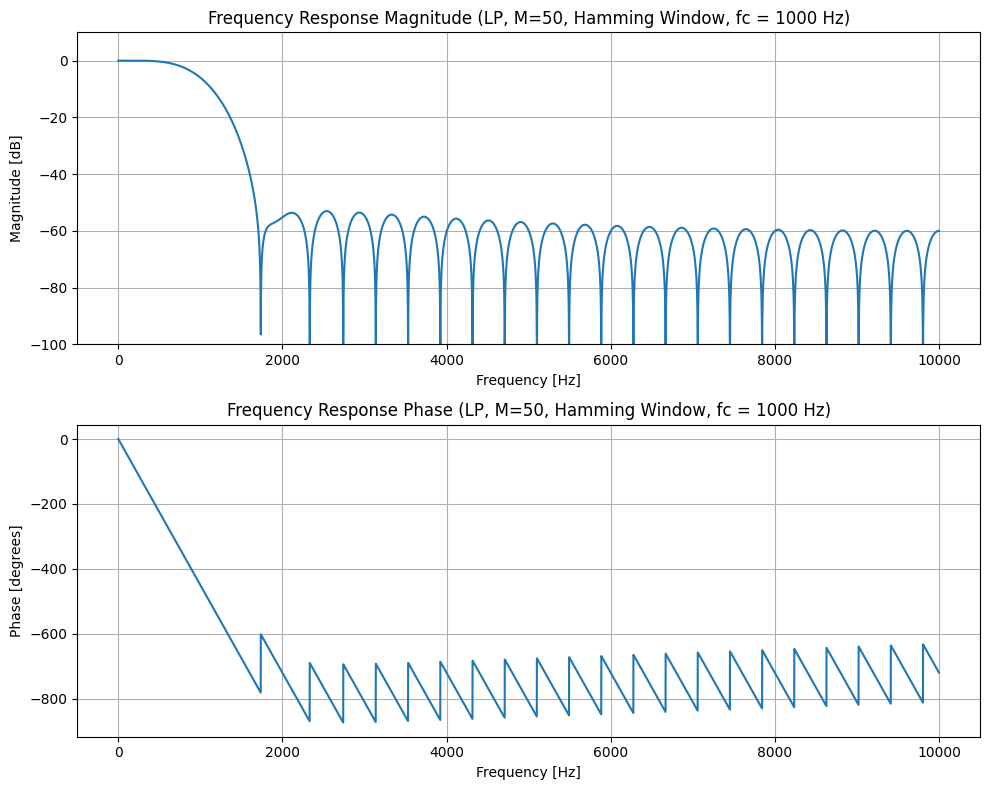

Comments for LP Filter (M=50, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Hamming) ---


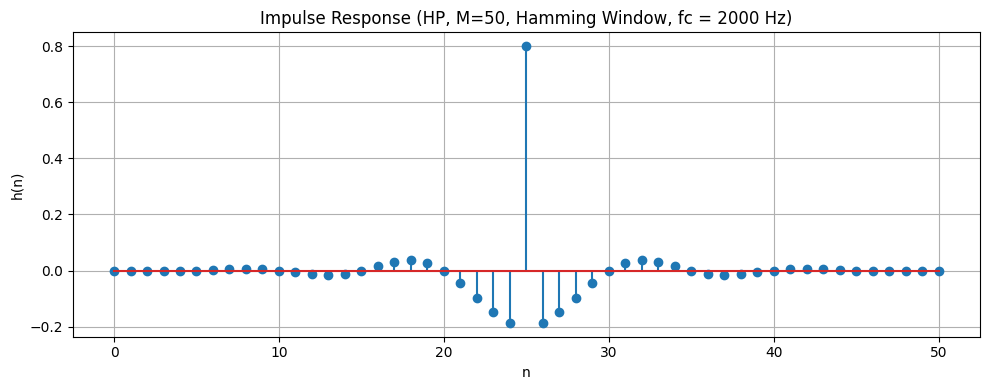

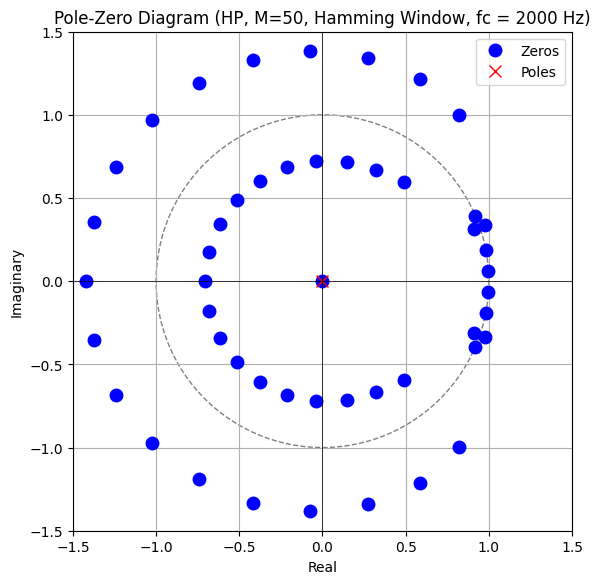

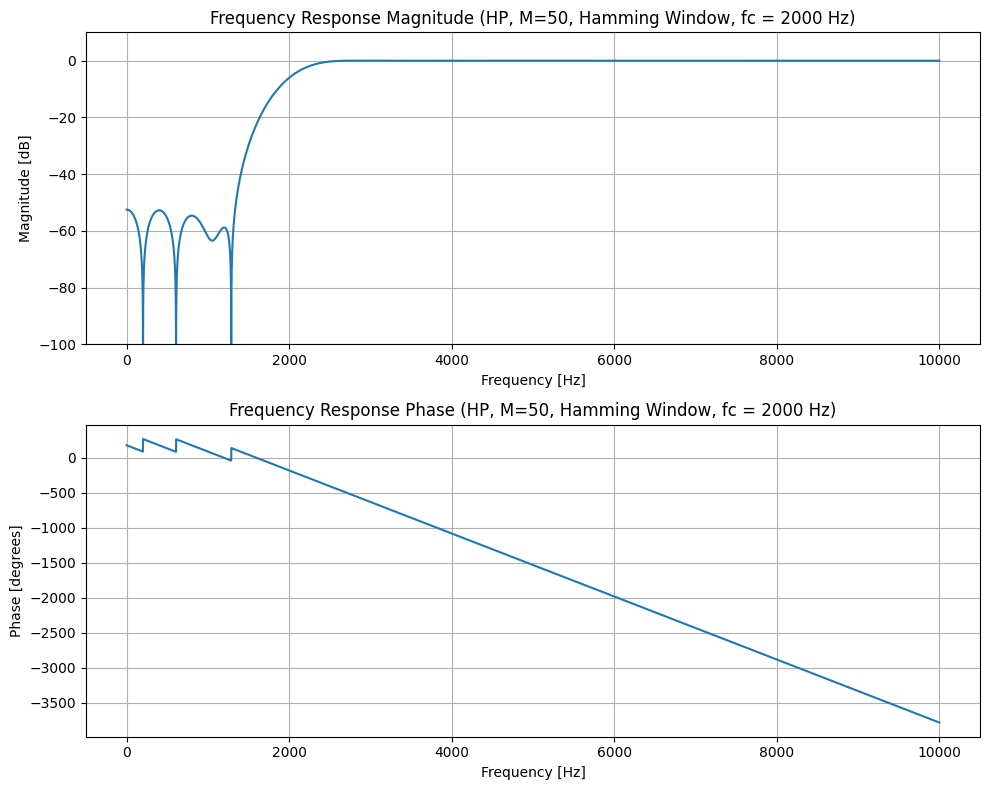

Comments for HP Filter (M=50, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Hamming) ---


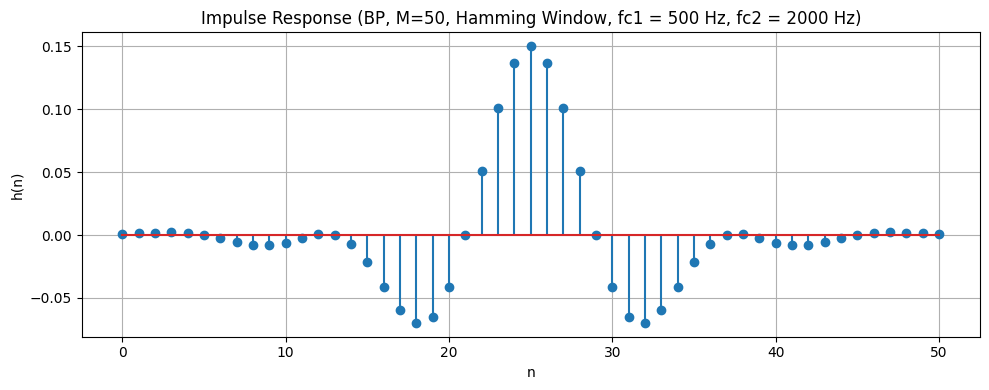

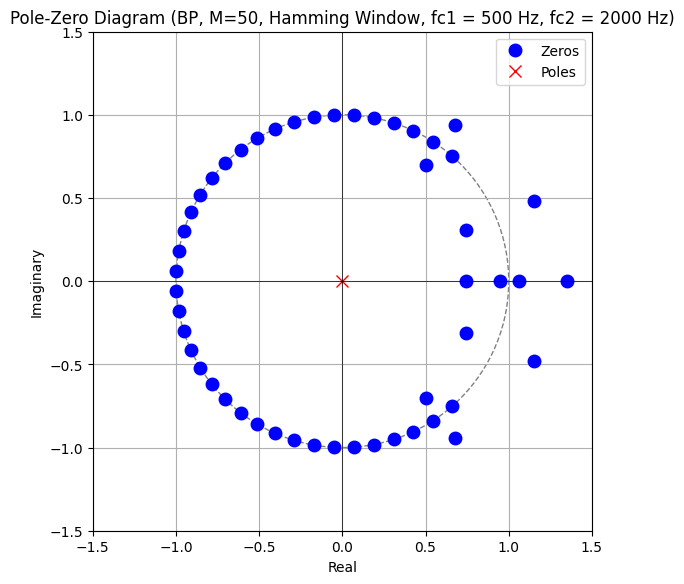

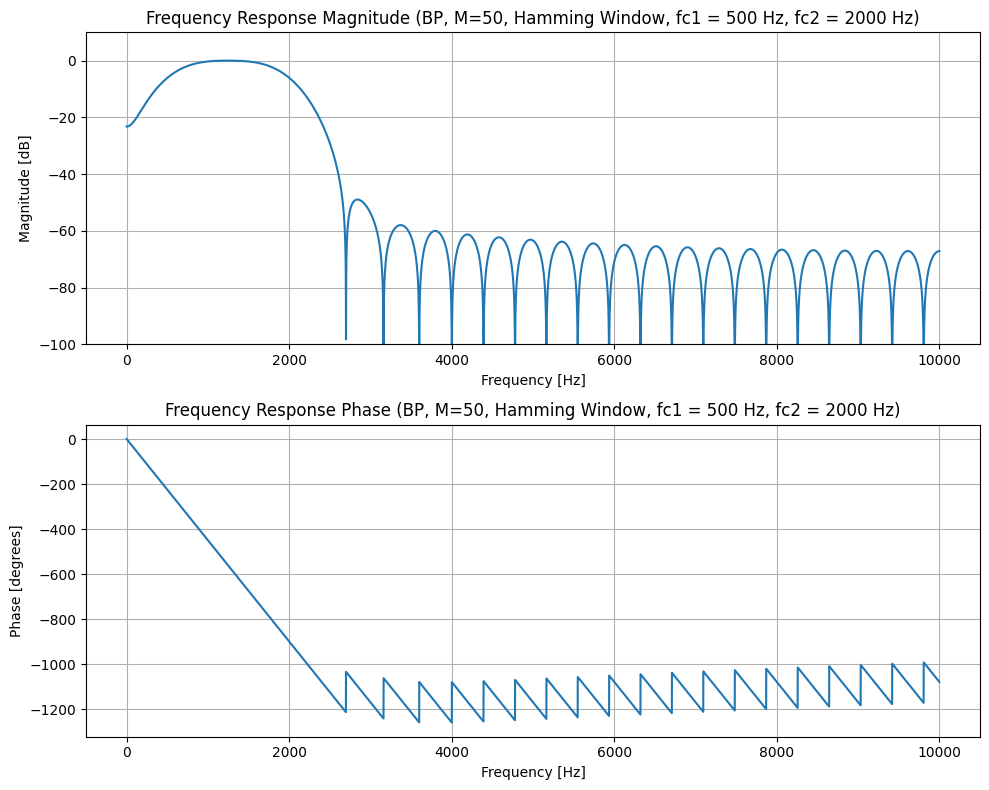

Comments for BP Filter (M=50, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Hamming) ---


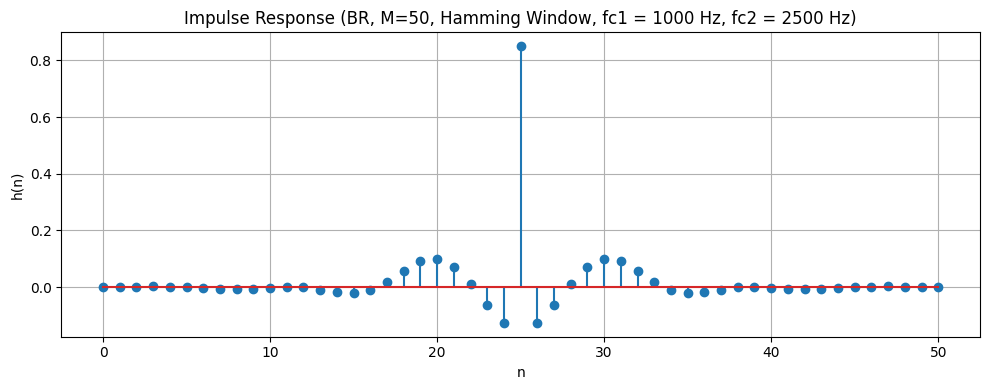

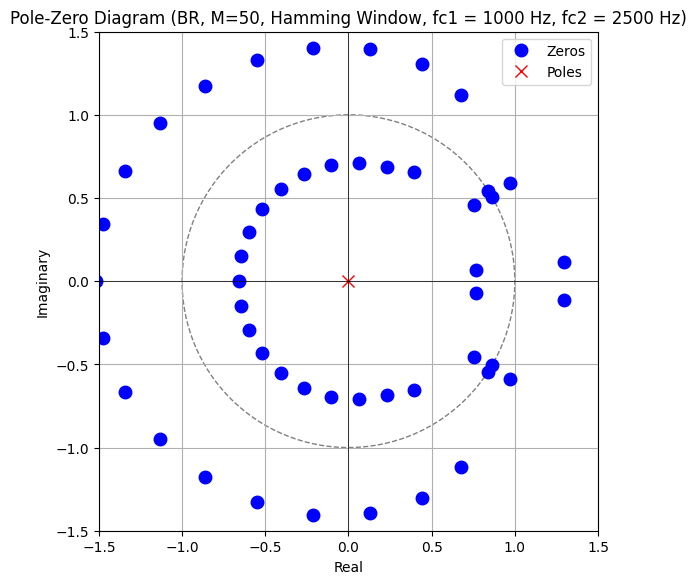

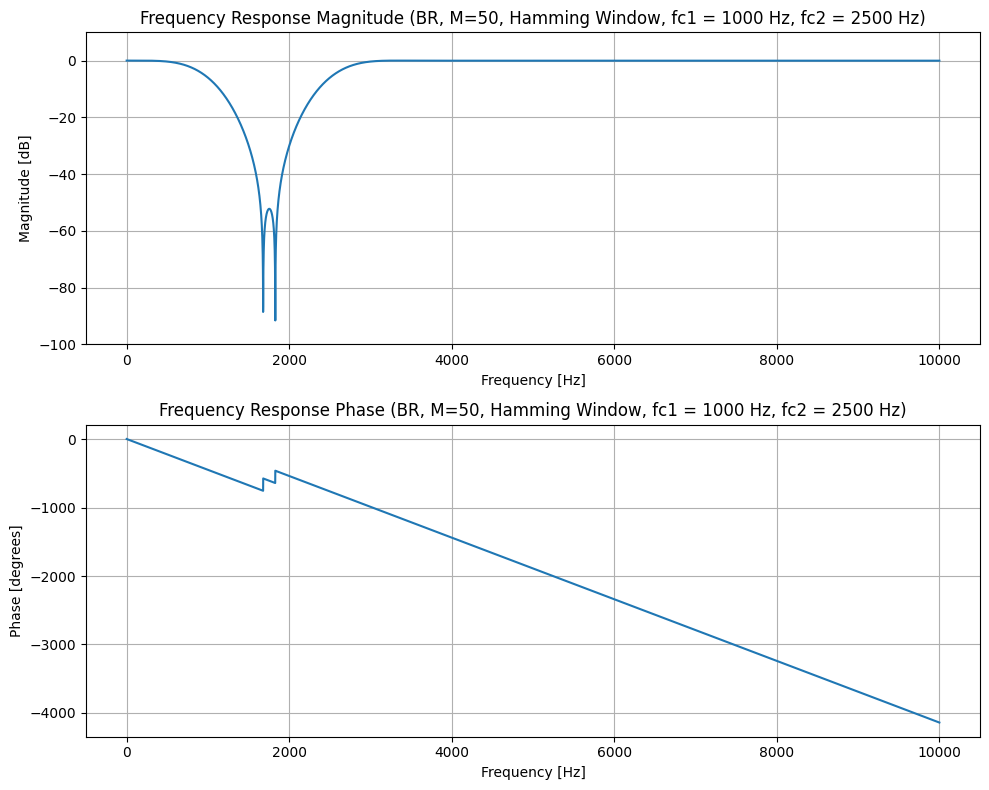

Comments for BR Filter (M=50, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=50, Window: Hann) ---


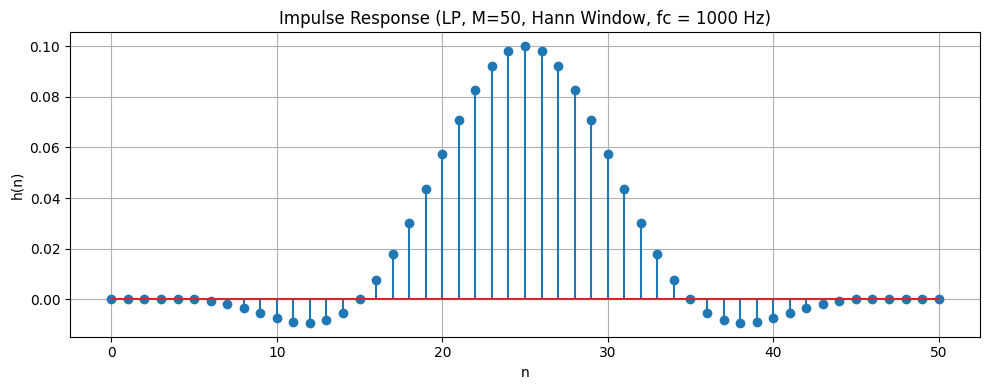

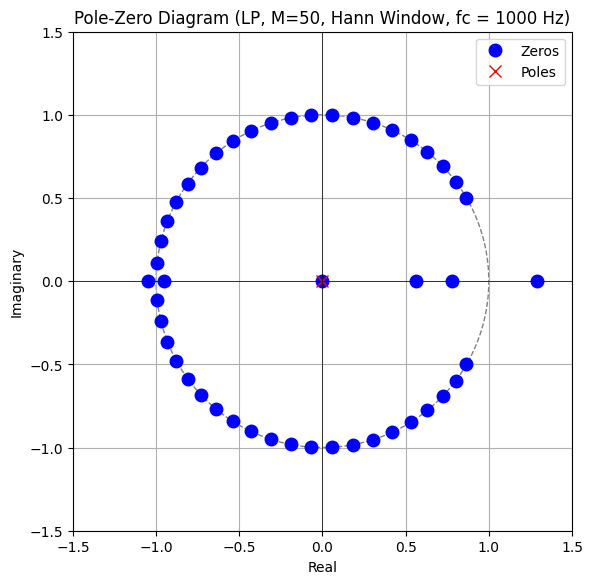

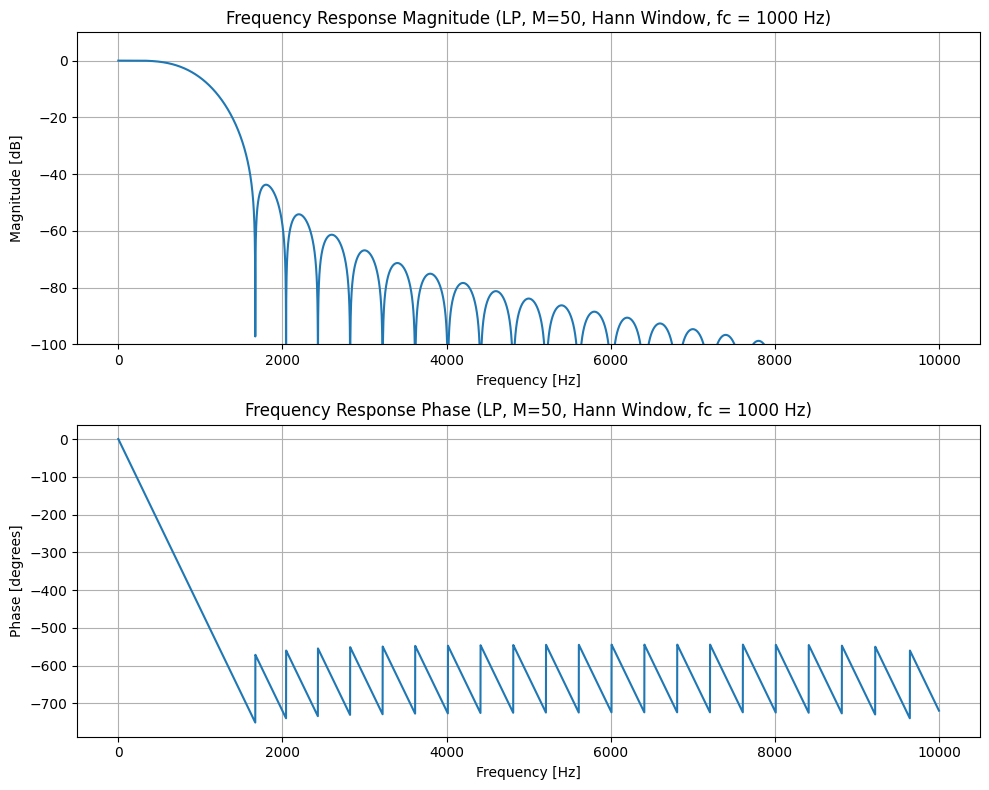

Comments for LP Filter (M=50, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Hann) ---


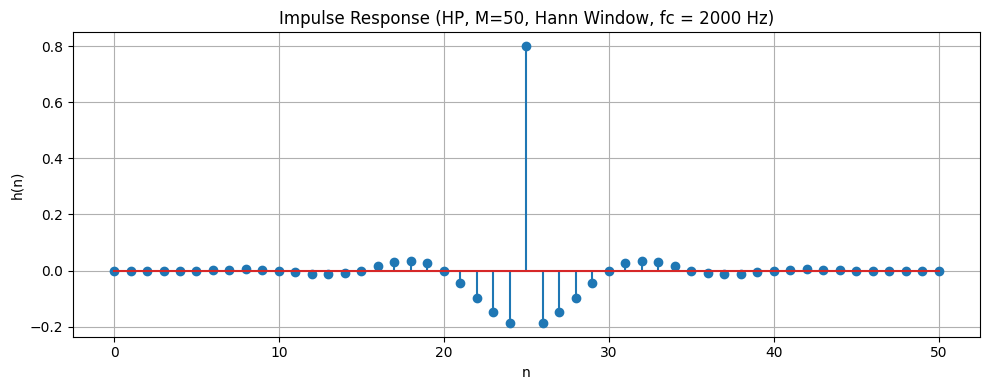

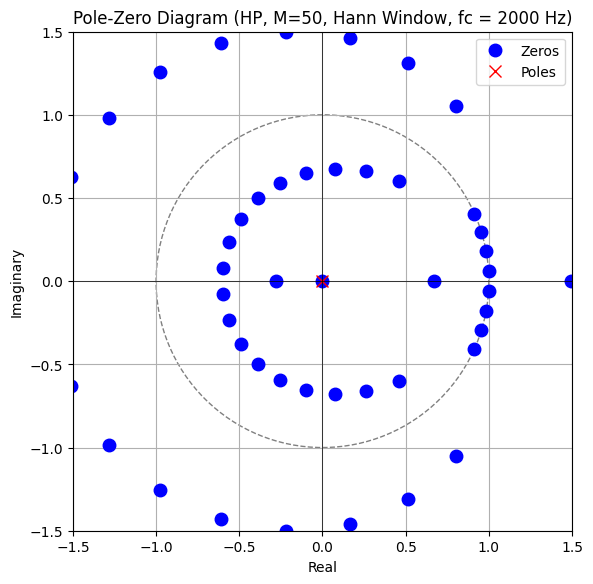

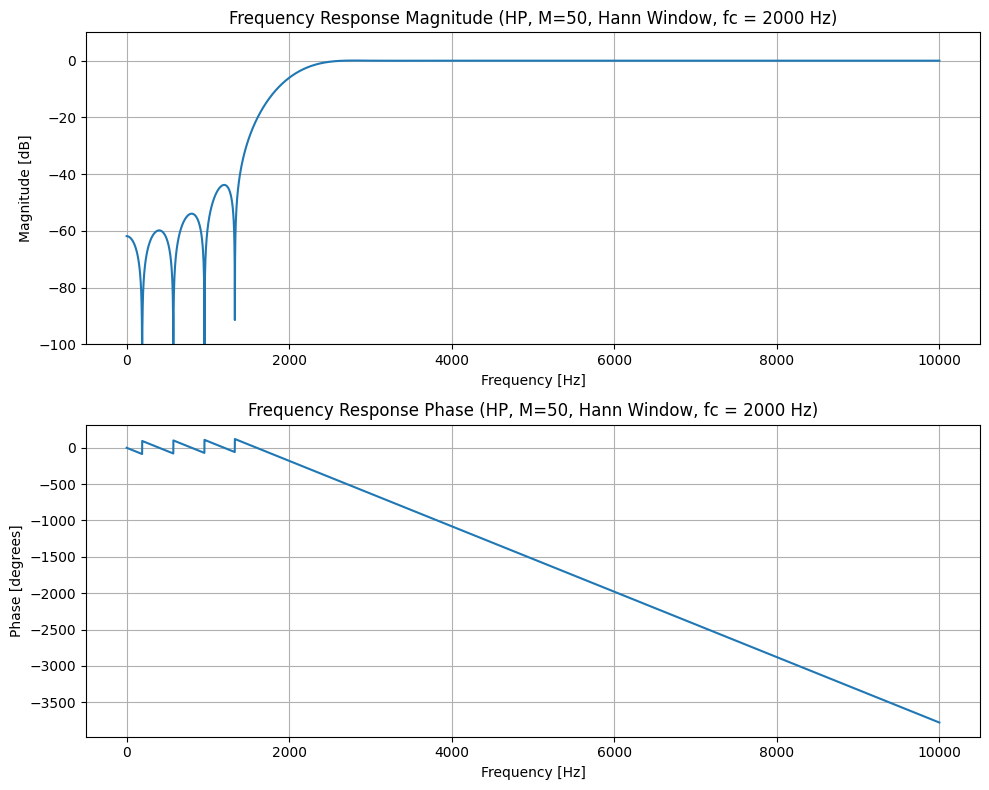

Comments for HP Filter (M=50, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Hann) ---


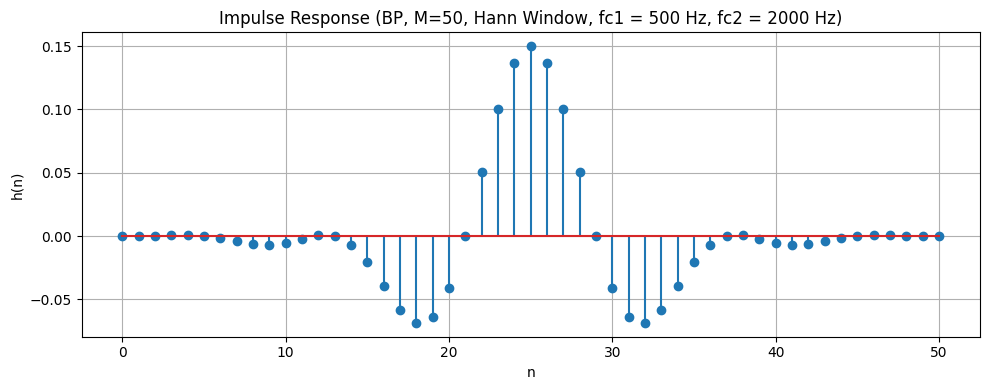

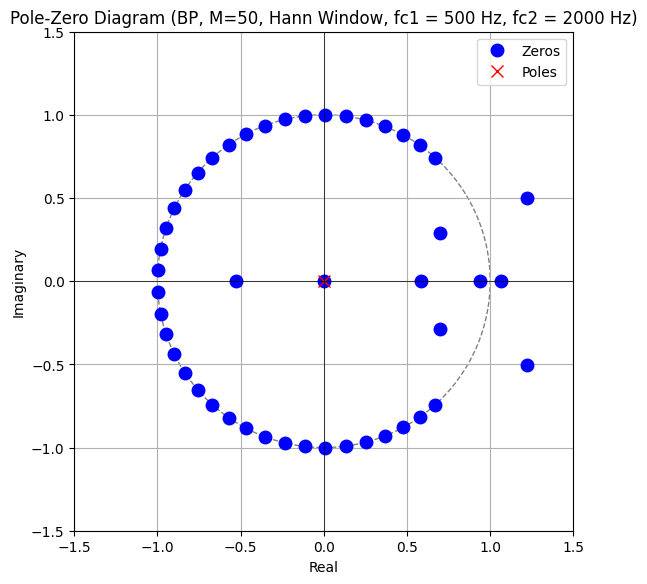

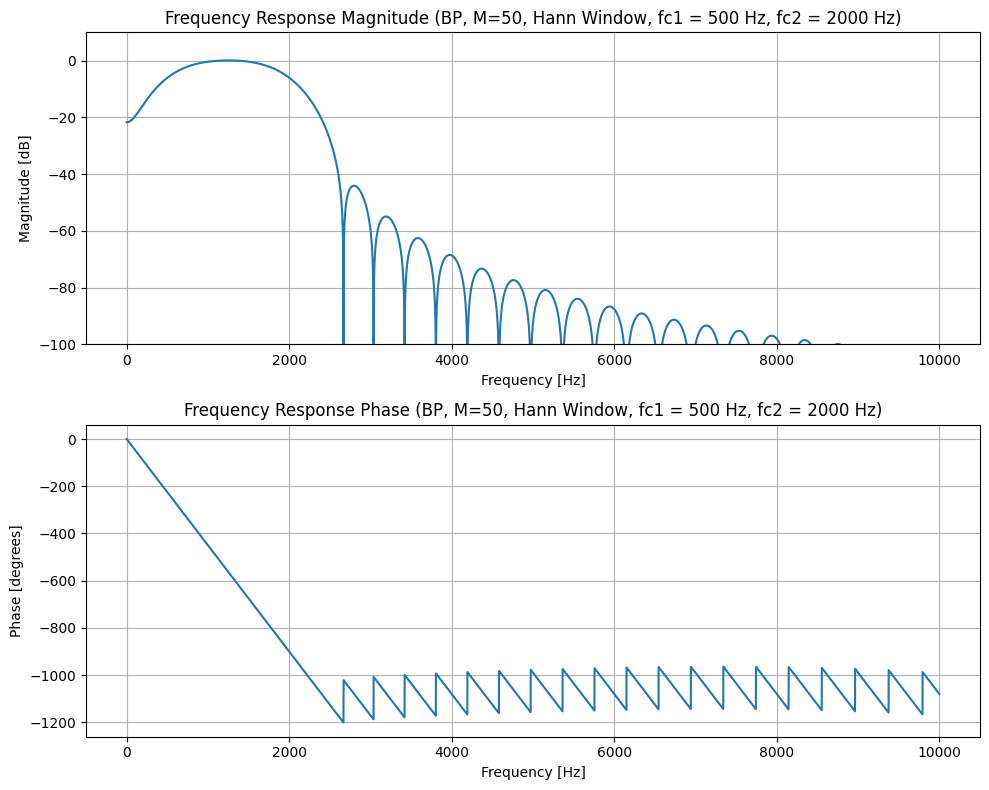

Comments for BP Filter (M=50, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Hann) ---


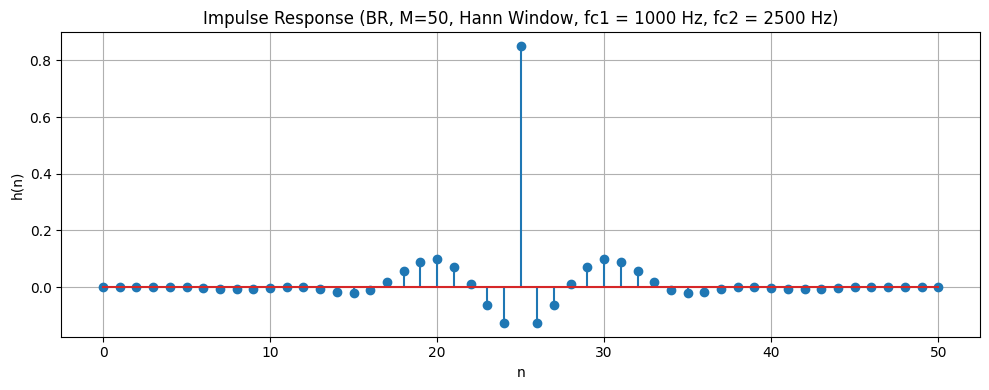

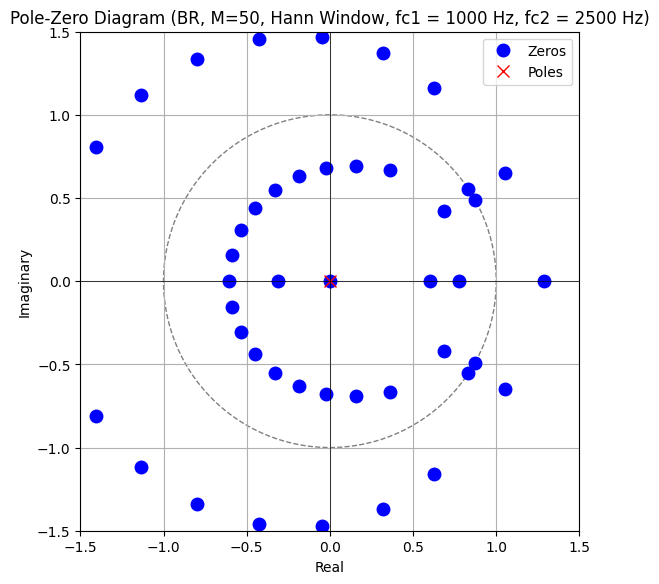

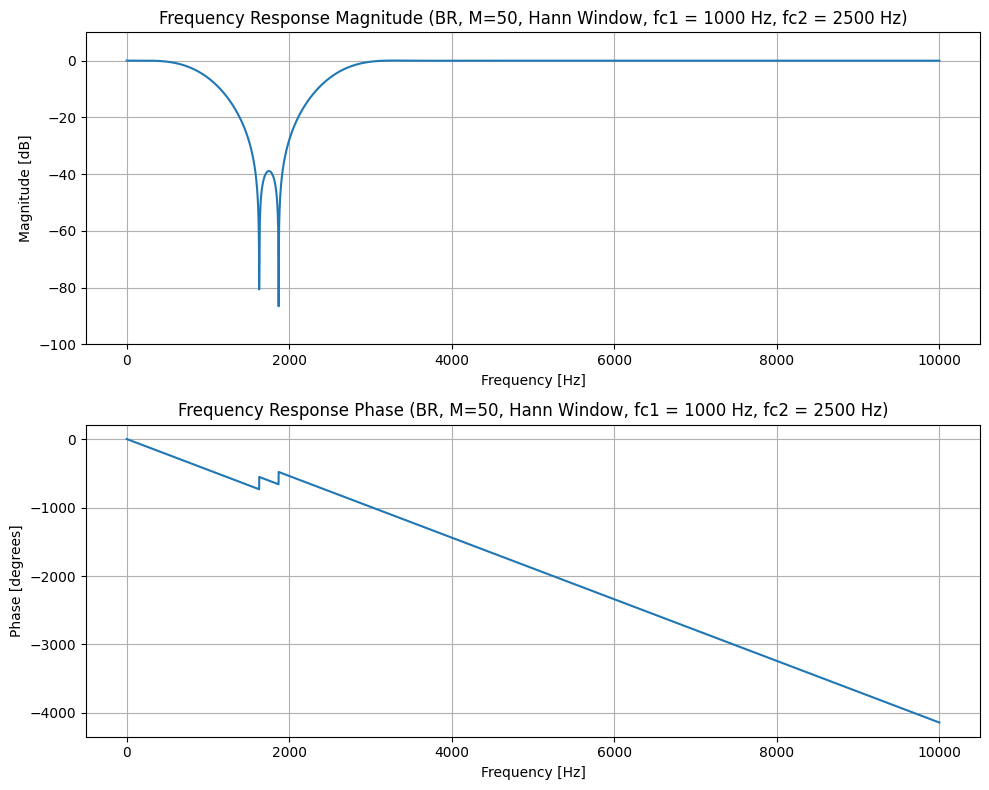

Comments for BR Filter (M=50, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=50, Window: Blackman) ---


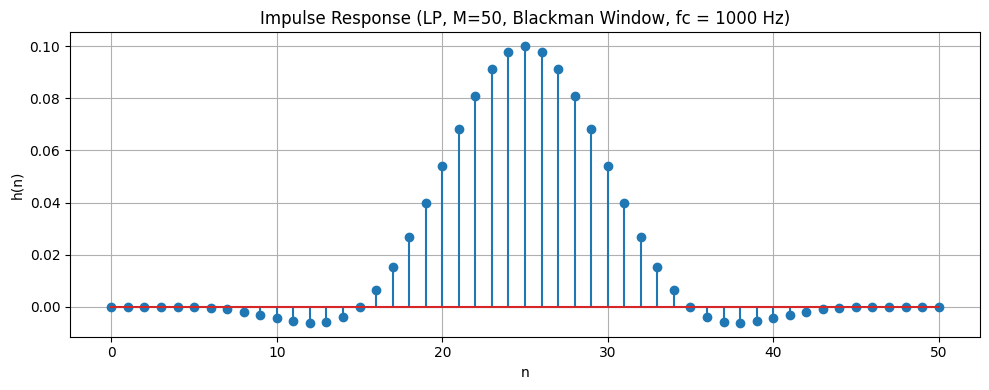

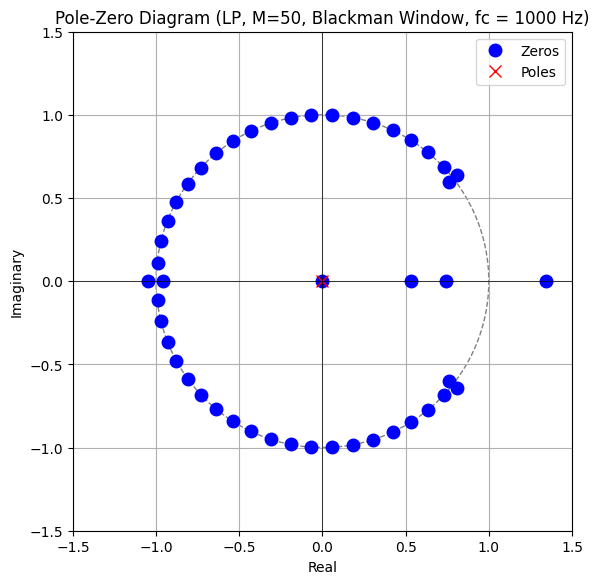

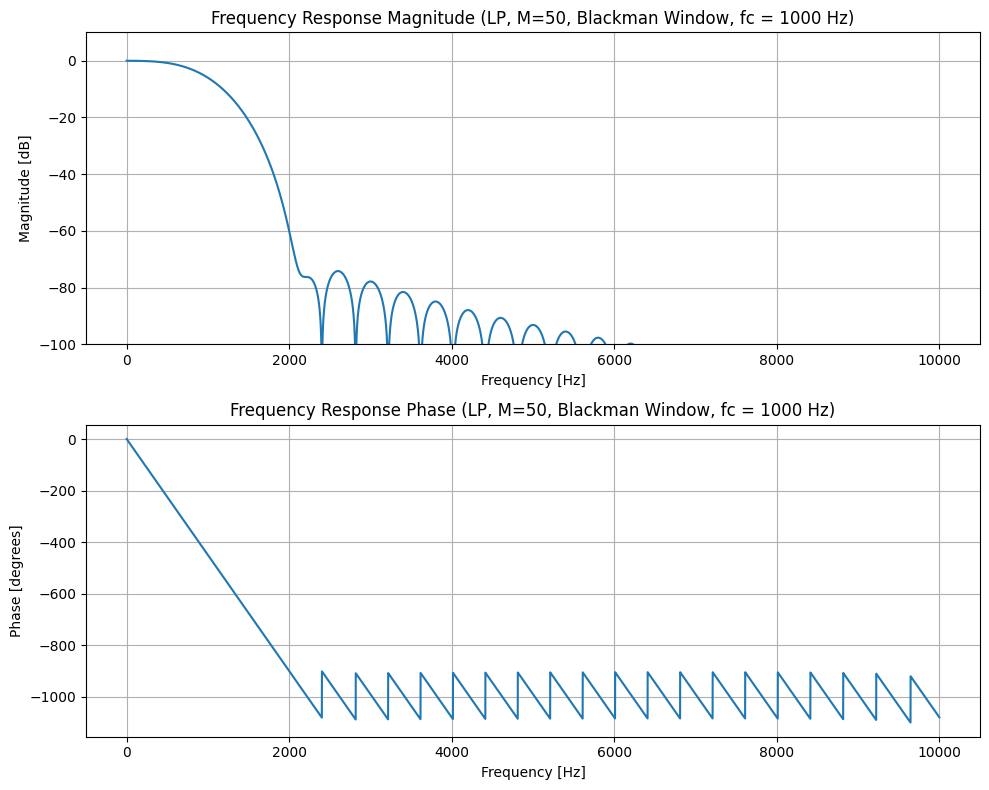

Comments for LP Filter (M=50, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing HP Filter (M=50, Window: Blackman) ---


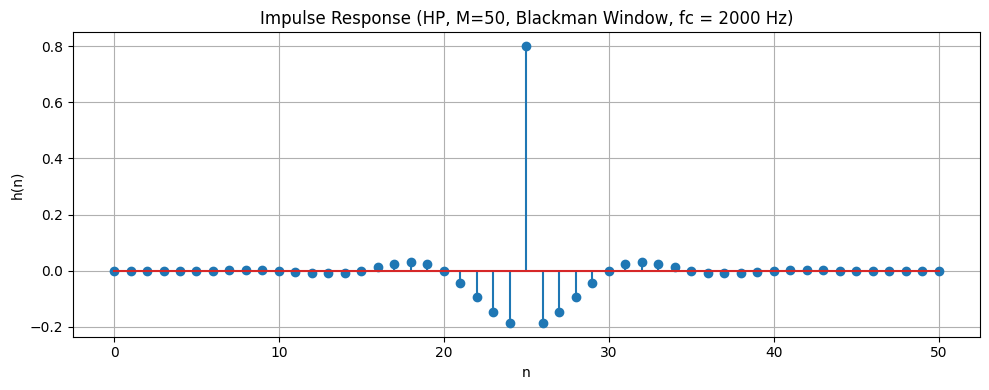

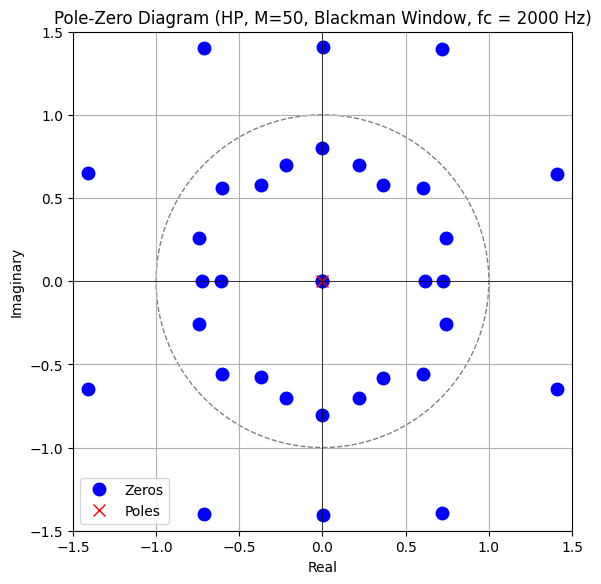

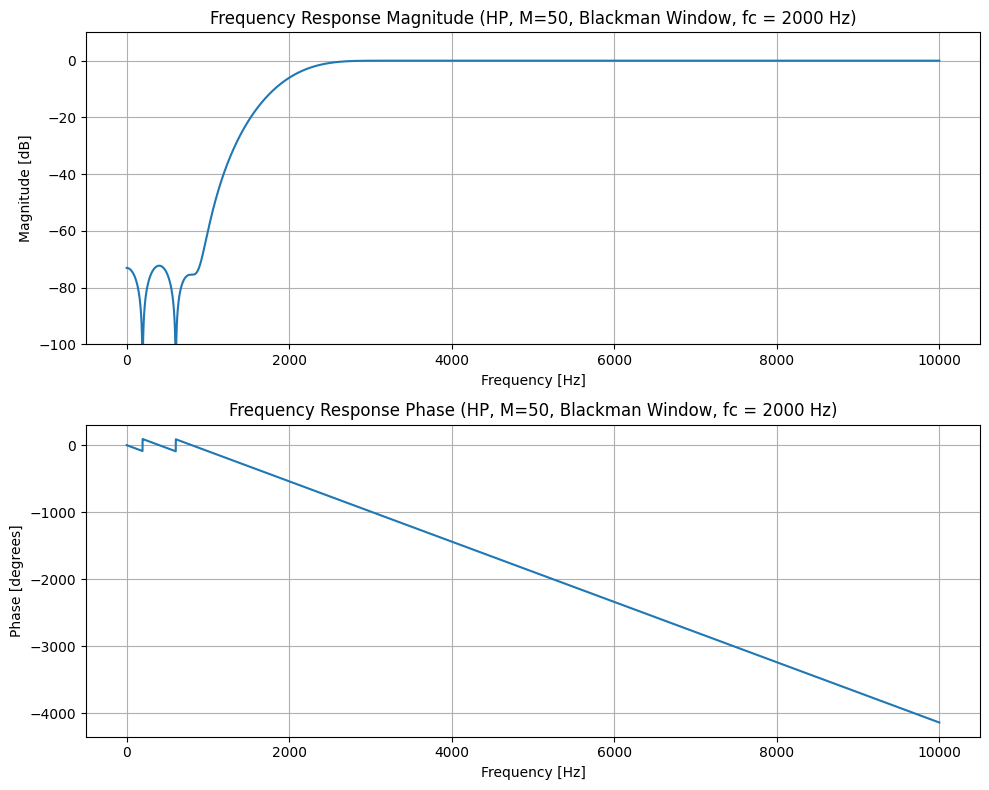

Comments for HP Filter (M=50, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BP Filter (M=50, Window: Blackman) ---


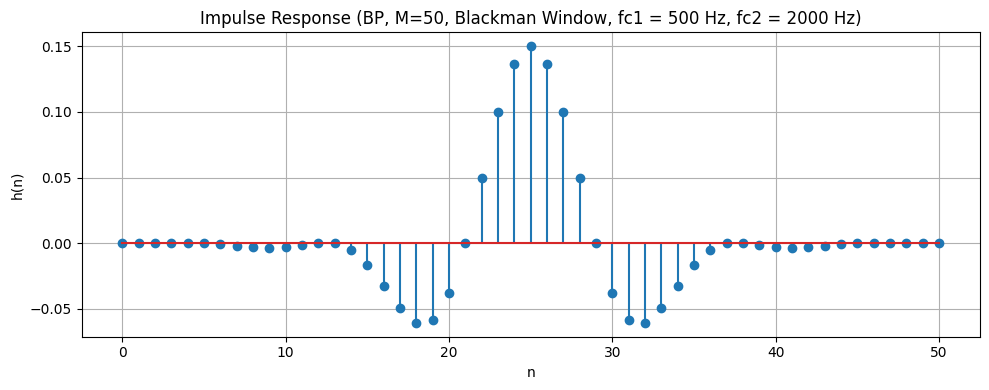

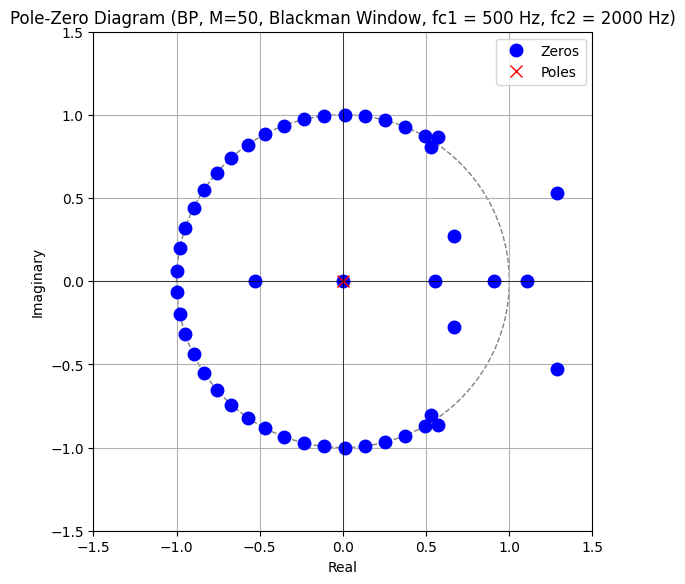

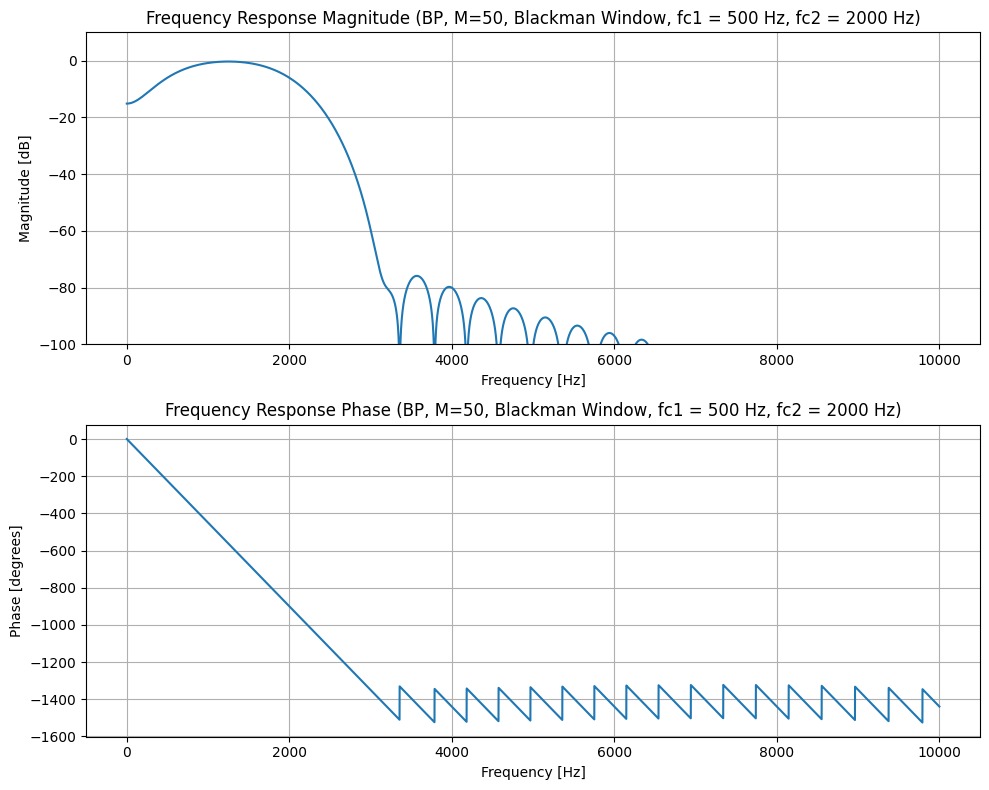

Comments for BP Filter (M=50, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing BR Filter (M=50, Window: Blackman) ---


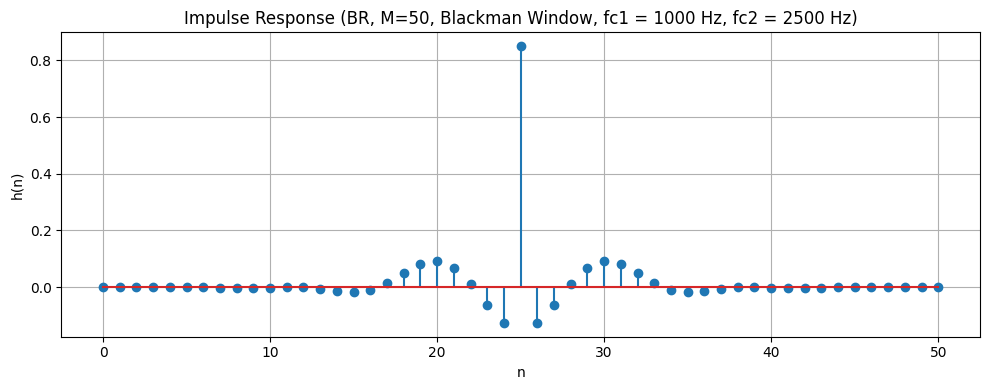

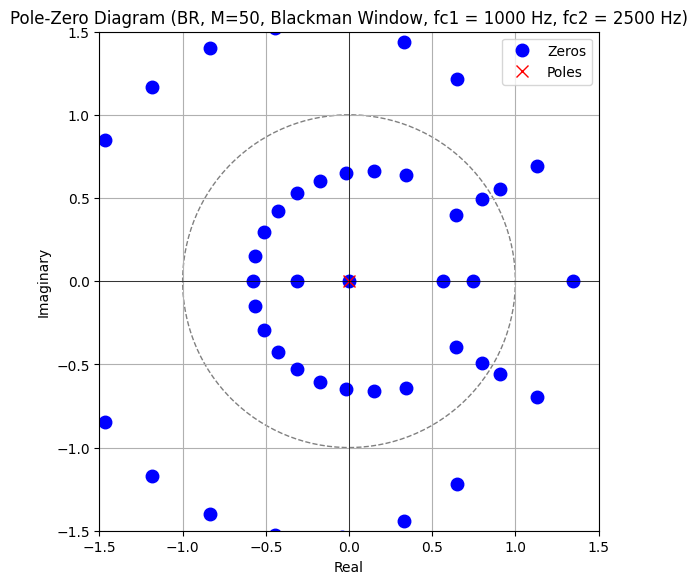

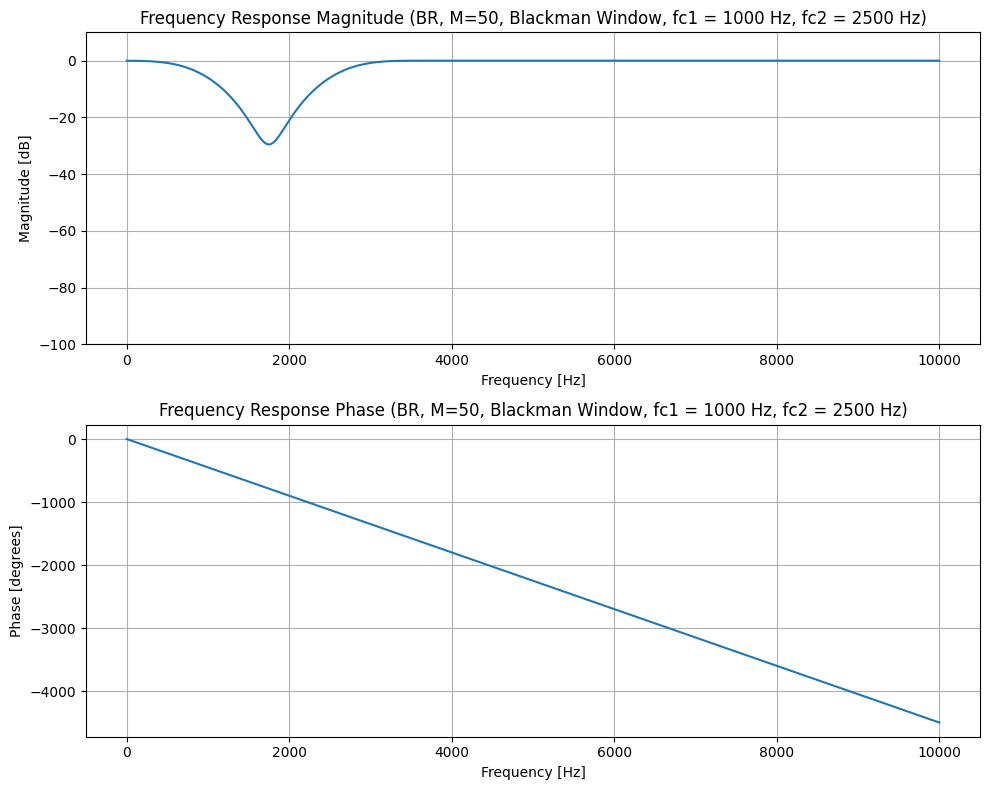

Comments for BR Filter (M=50, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=50: Medium order filters provide a better balance between transition band width, stopband attenuation, and computational cost.

--- Designing LP Filter (M=100, Window: Rectangular) ---


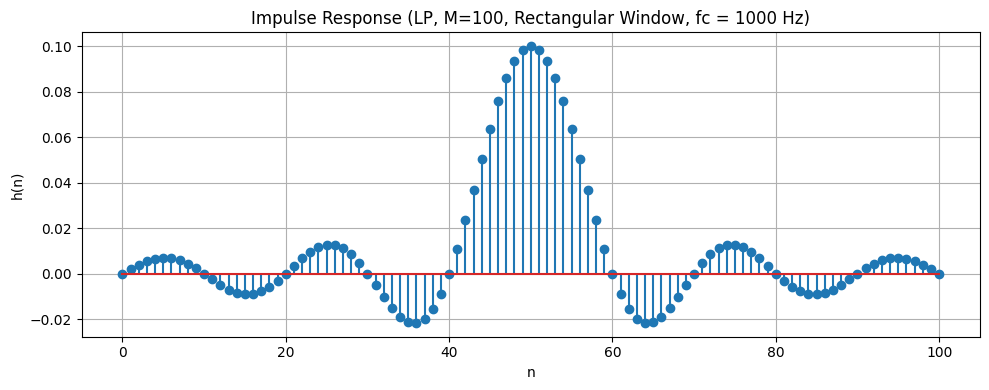

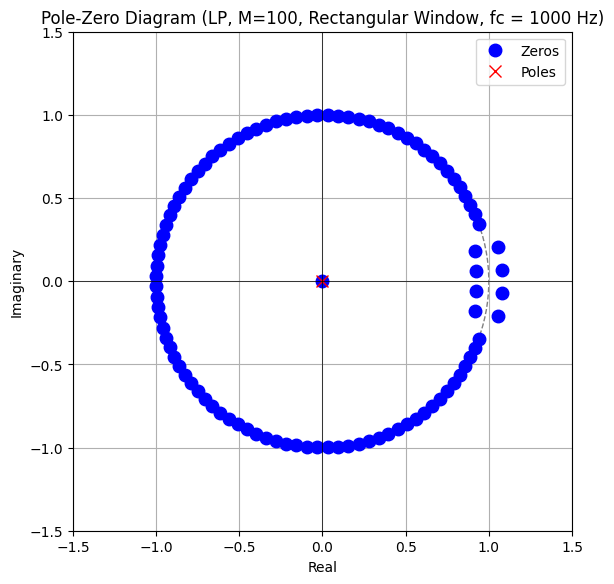

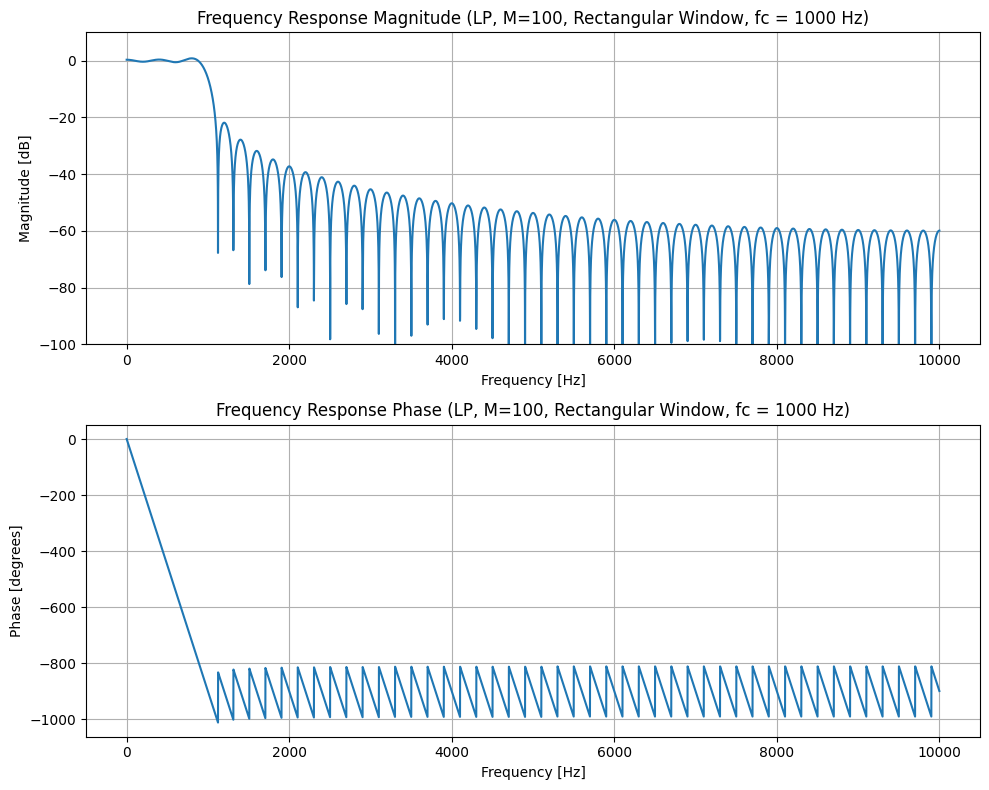

Comments for LP Filter (M=100, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Rectangular) ---


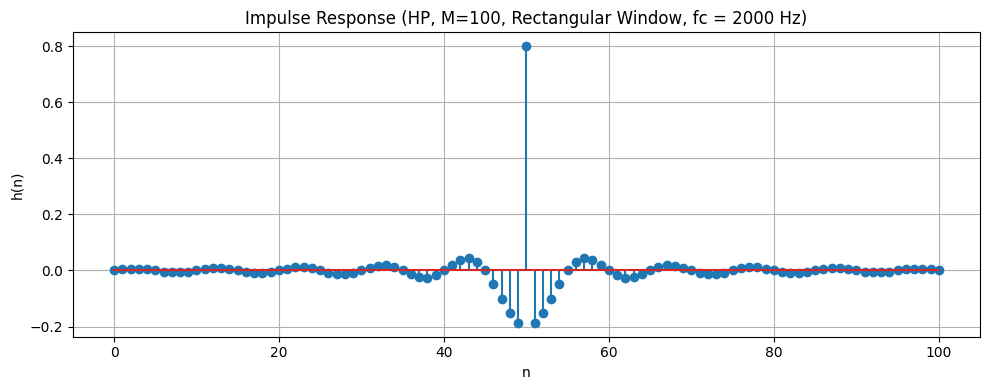

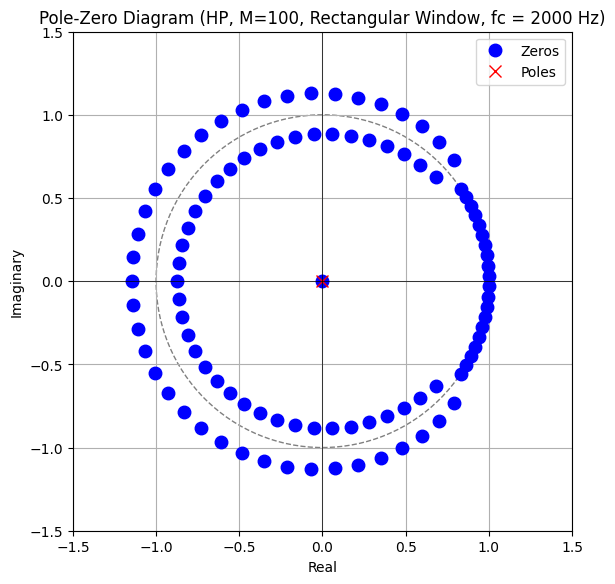

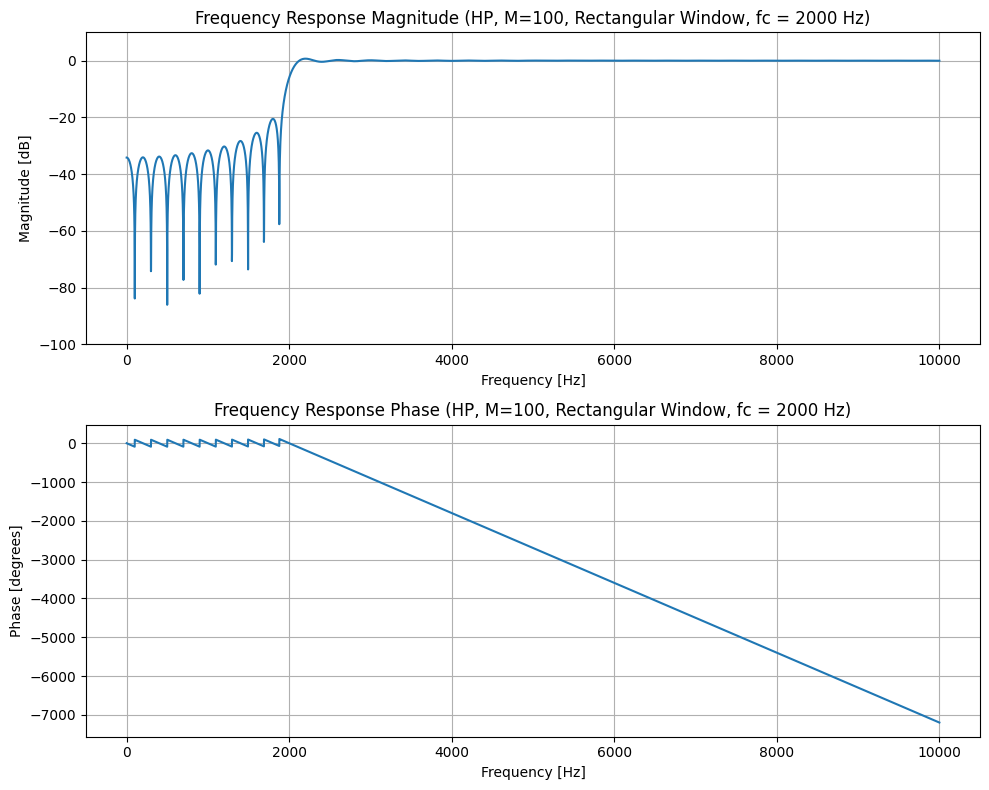

Comments for HP Filter (M=100, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Rectangular) ---


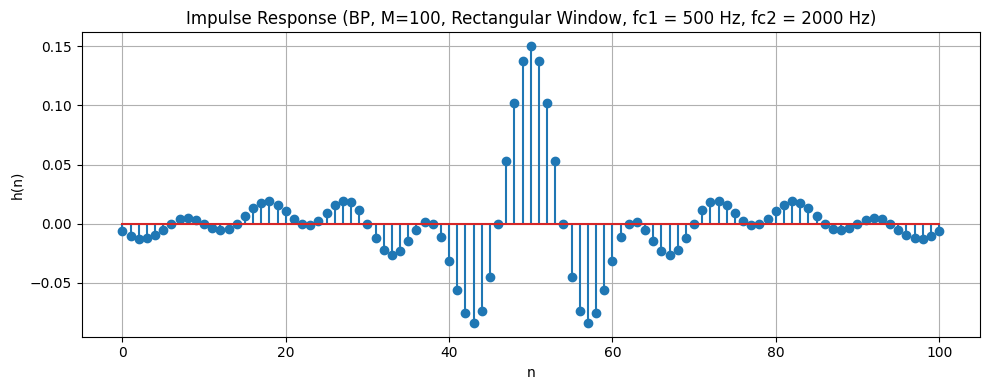

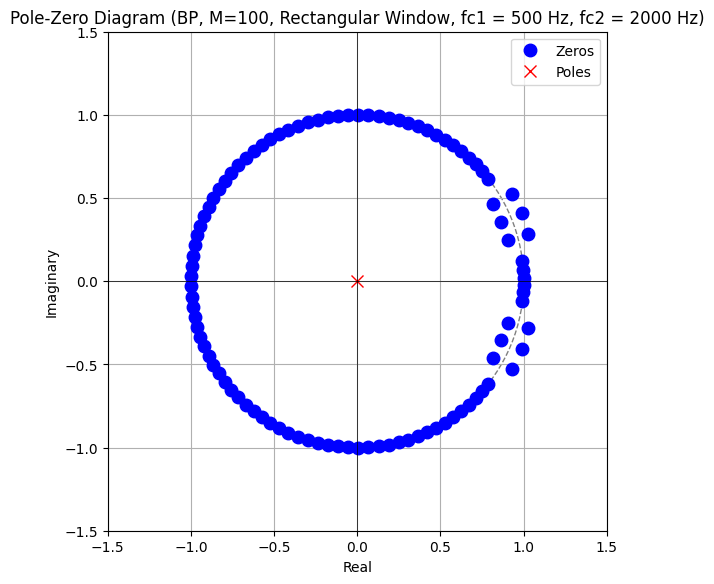

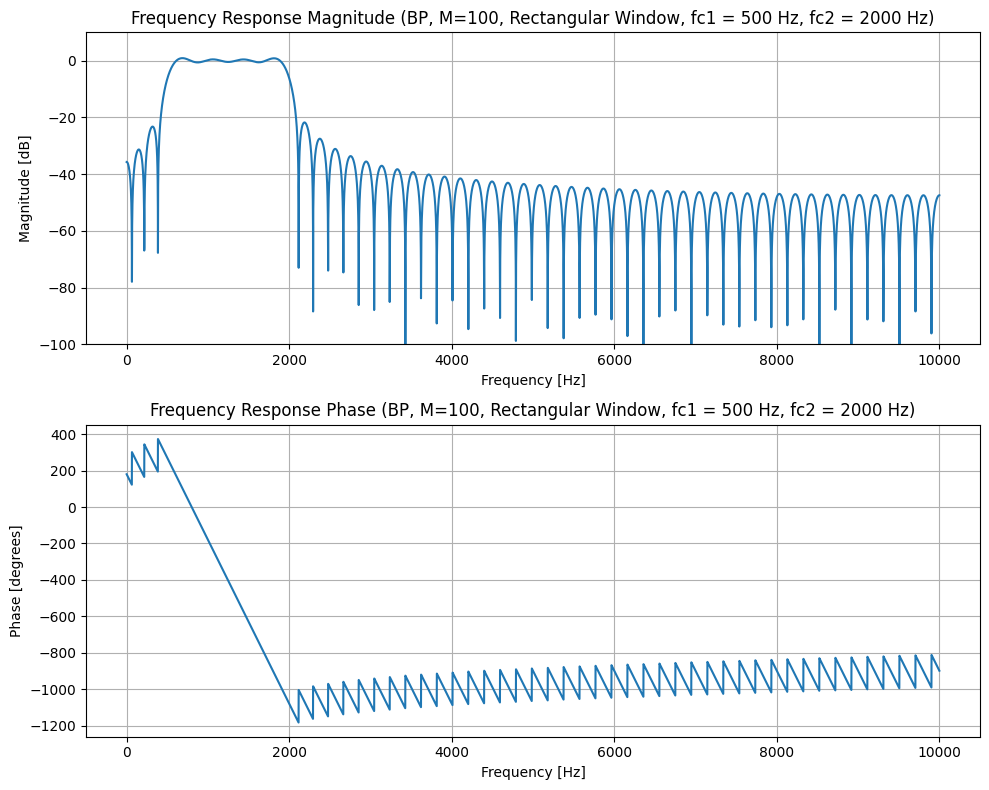

Comments for BP Filter (M=100, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Rectangular) ---


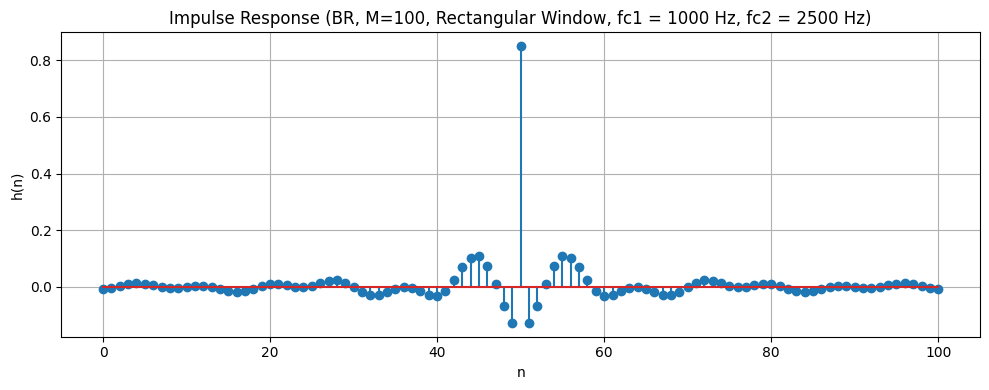

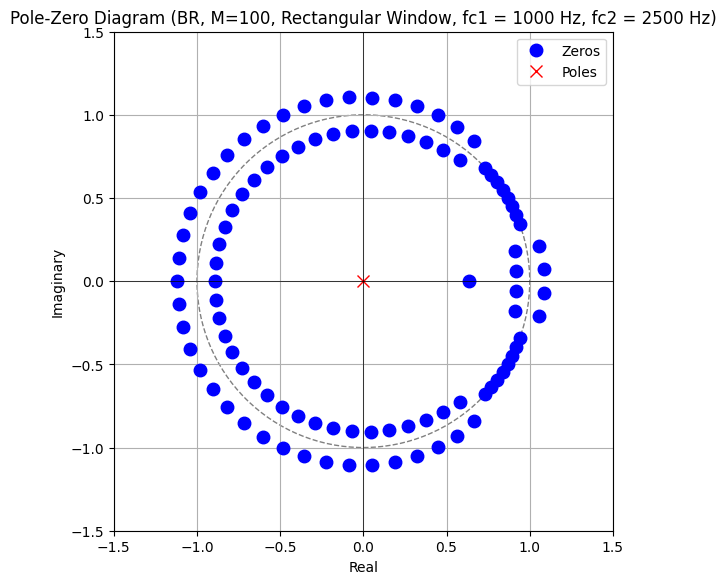

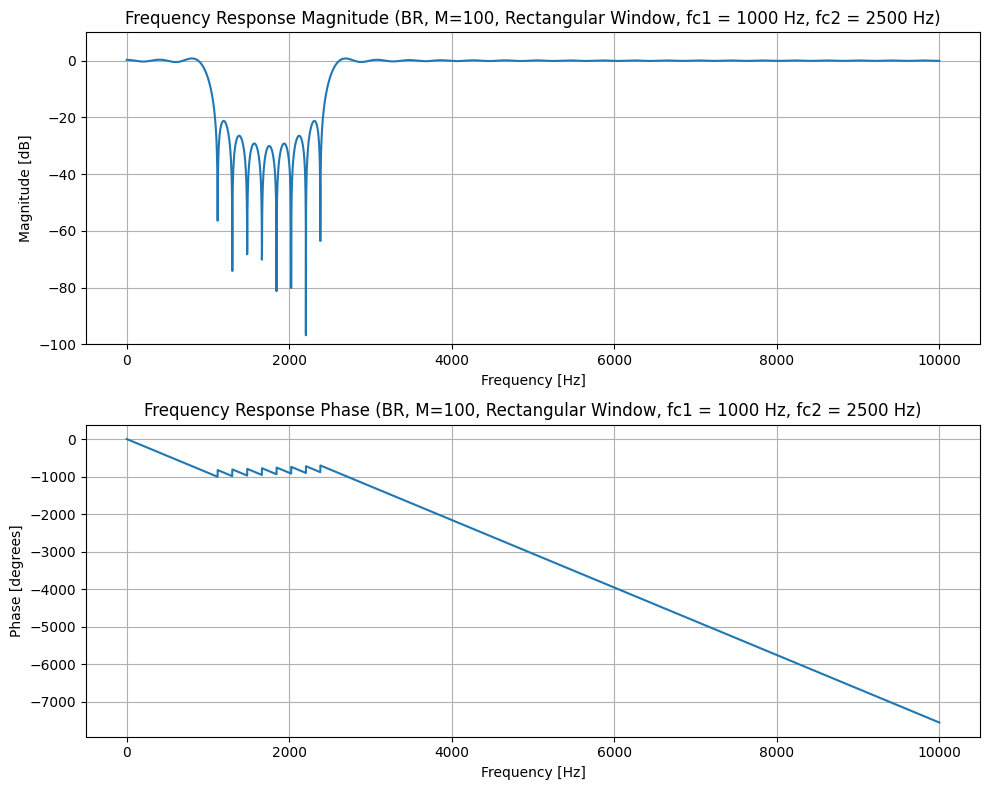

Comments for BR Filter (M=100, Window: Rectangular):
  - Impulse Response: Exhibits a direct truncation, which leads to the Gibbs phenomenon in frequency response.
  - Pole-Zero Diagram: Zeros are located both on and off the unit circle. Poles are at the origin.
  - Frequency Response: Shows significant ripples in both passband and stopband due to sharp discontinuity of the window. Transition band is narrowest compared to other windows for the same M, but stopband attenuation is poor.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing LP Filter (M=100, Window: Triangular) ---


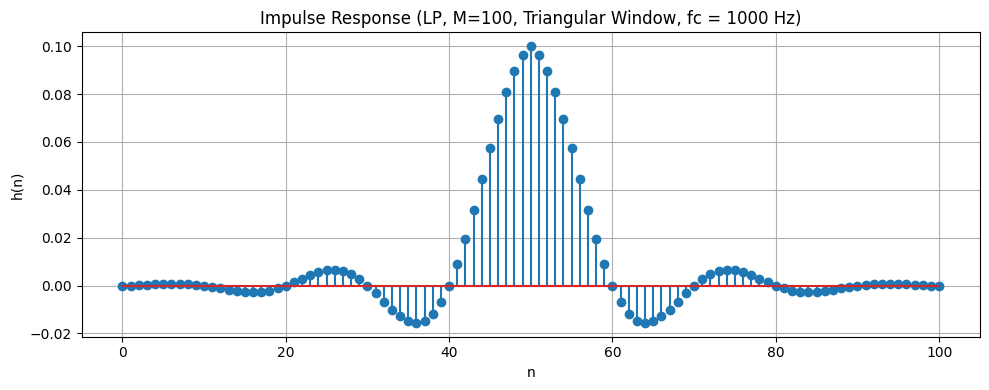

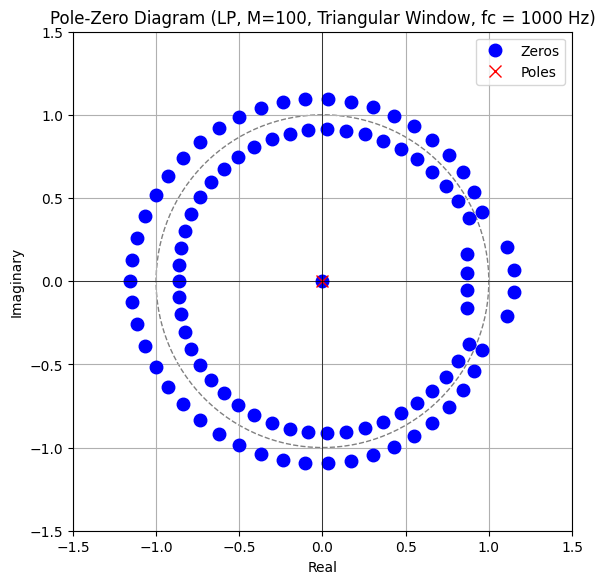

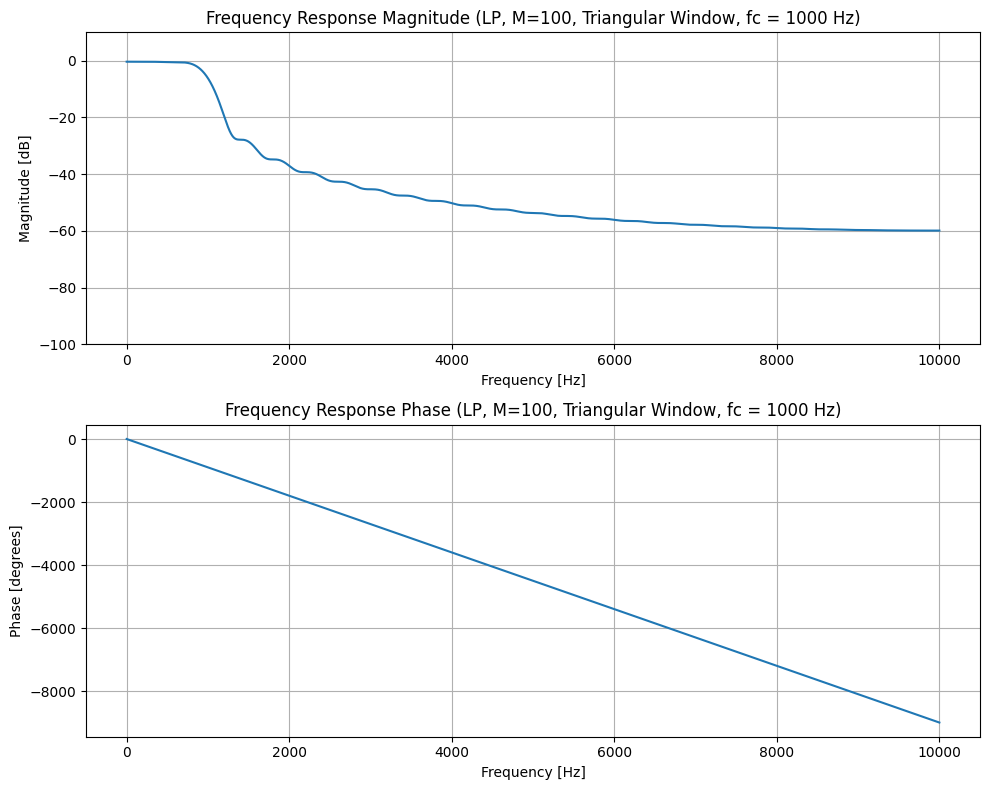

Comments for LP Filter (M=100, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Triangular) ---


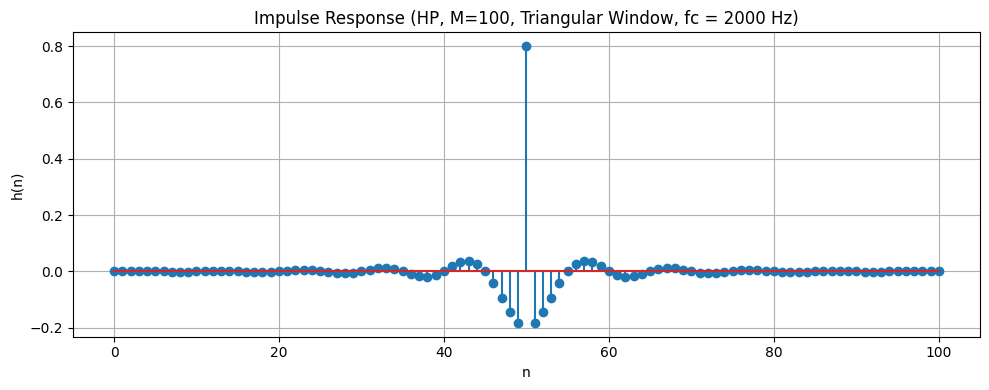

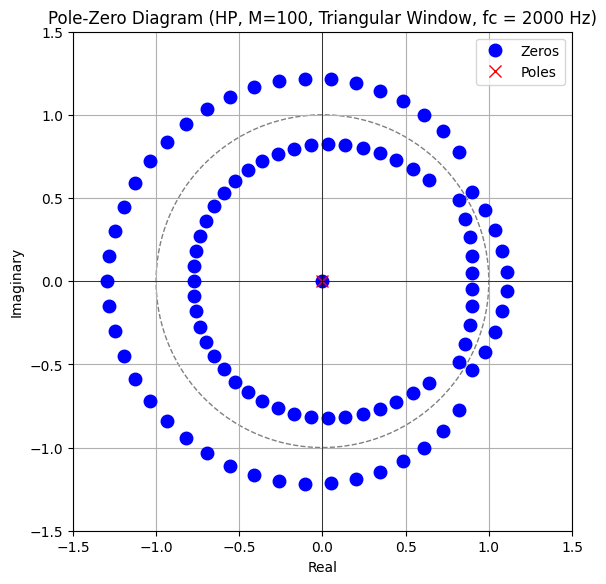

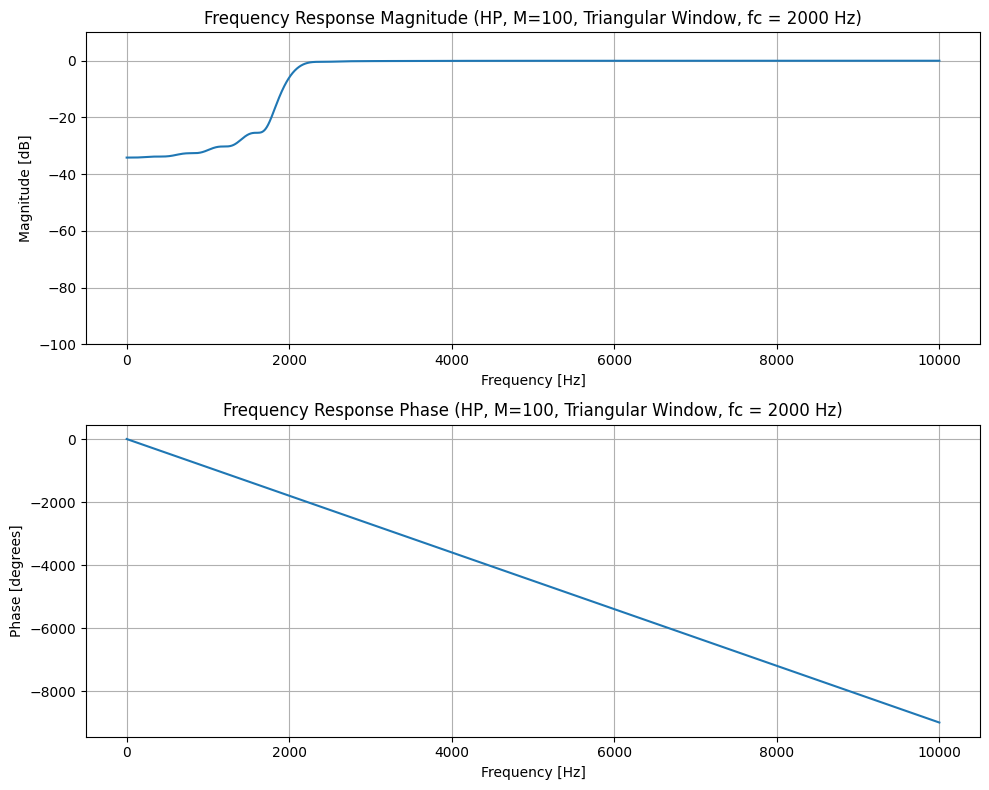

Comments for HP Filter (M=100, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Triangular) ---


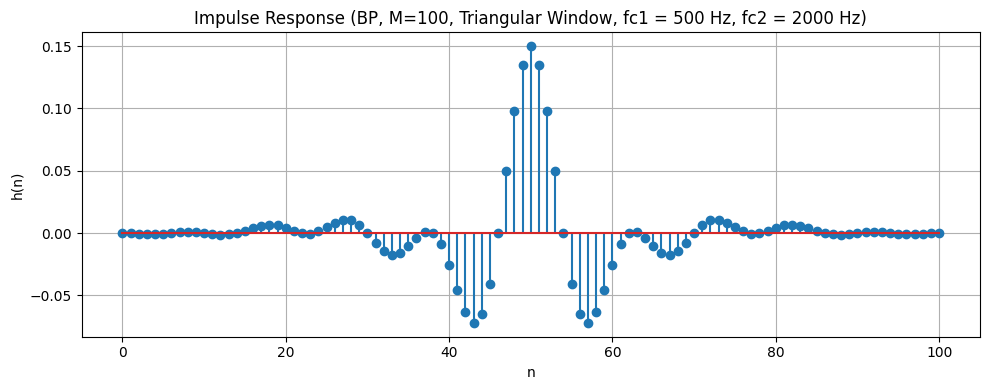

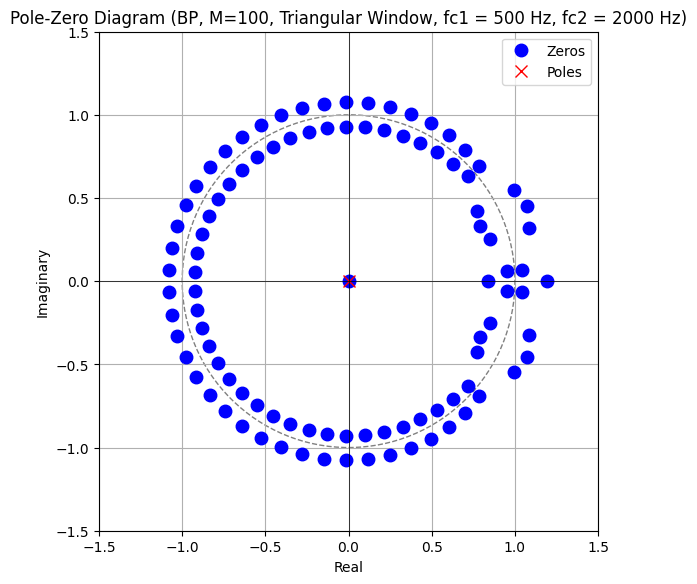

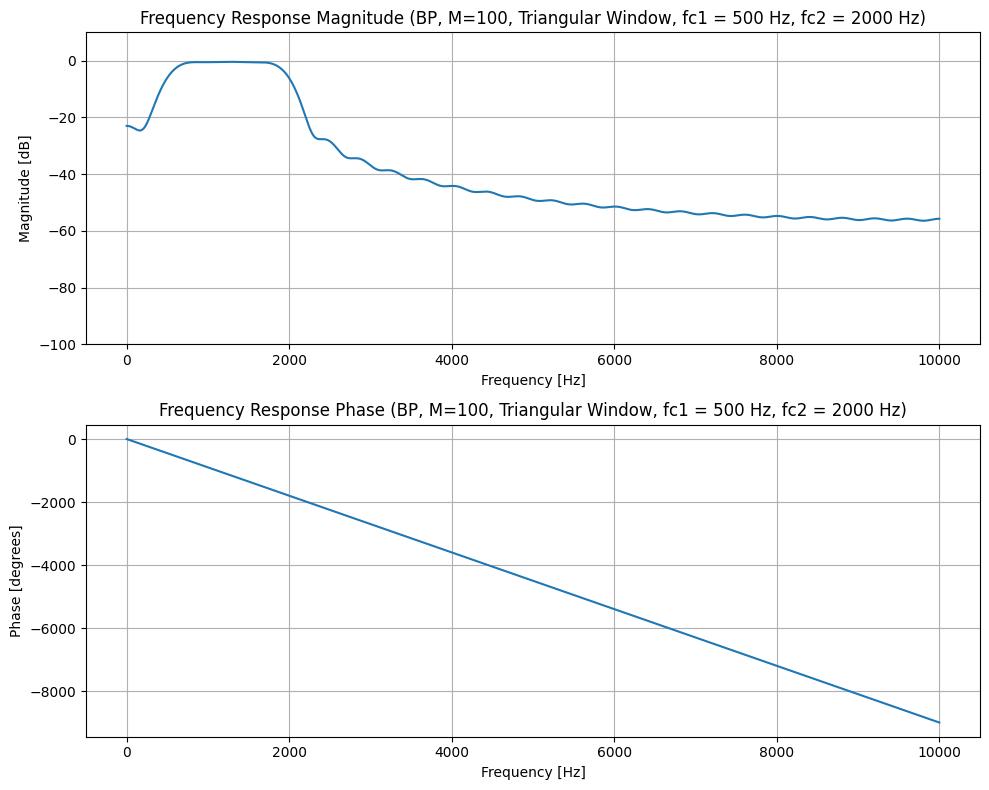

Comments for BP Filter (M=100, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Triangular) ---


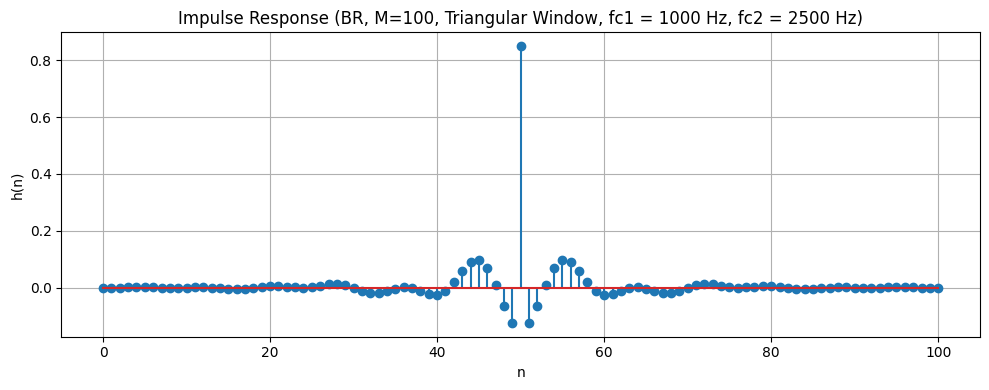

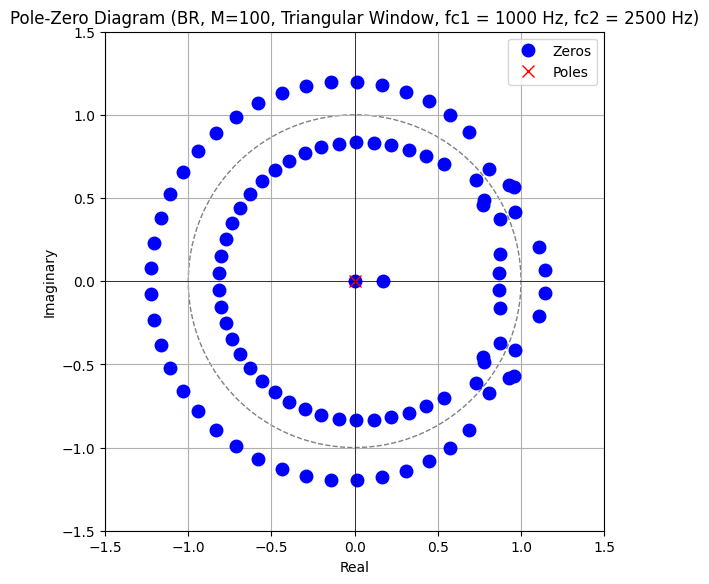

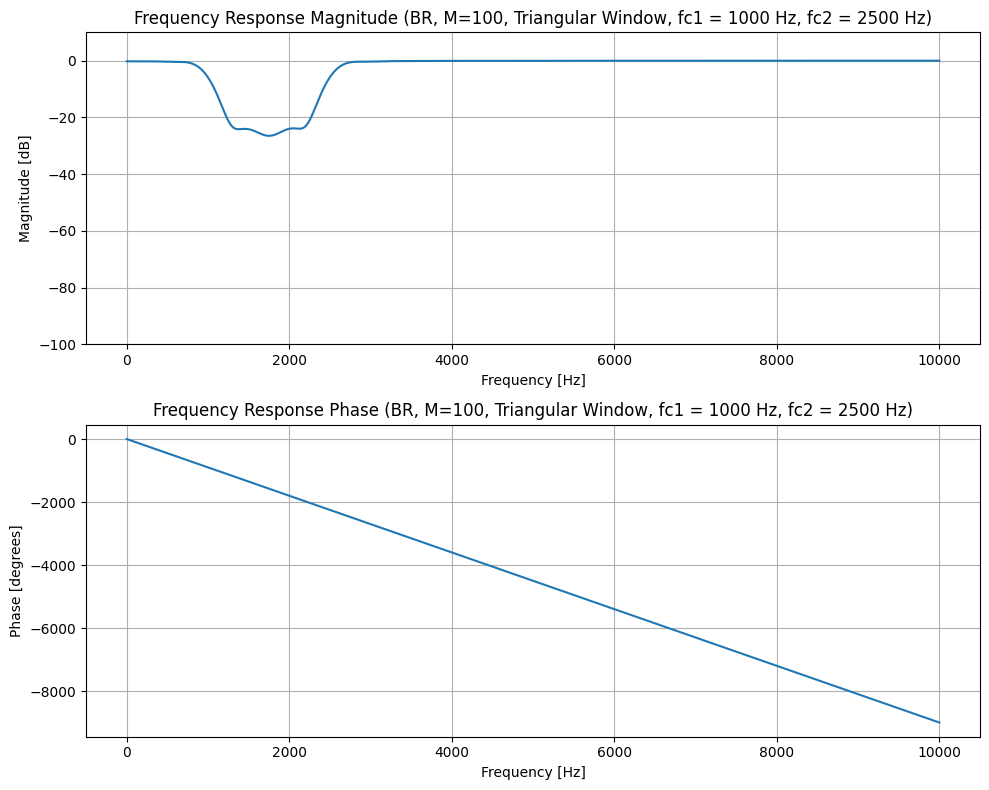

Comments for BR Filter (M=100, Window: Triangular):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing LP Filter (M=100, Window: Bartlett) ---


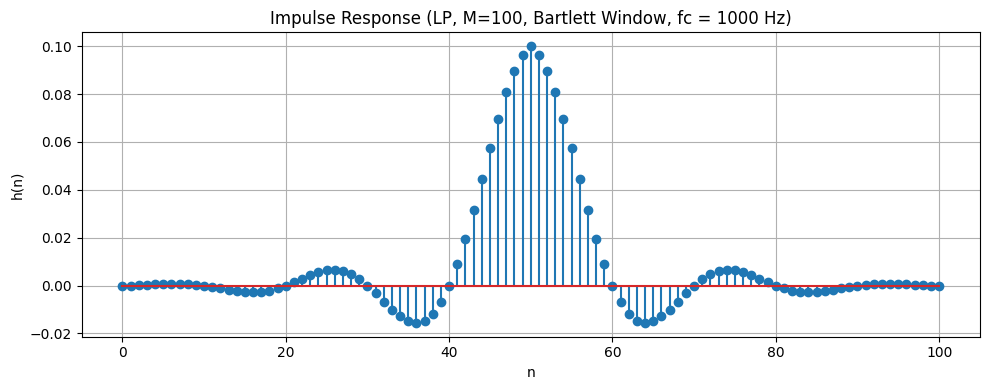

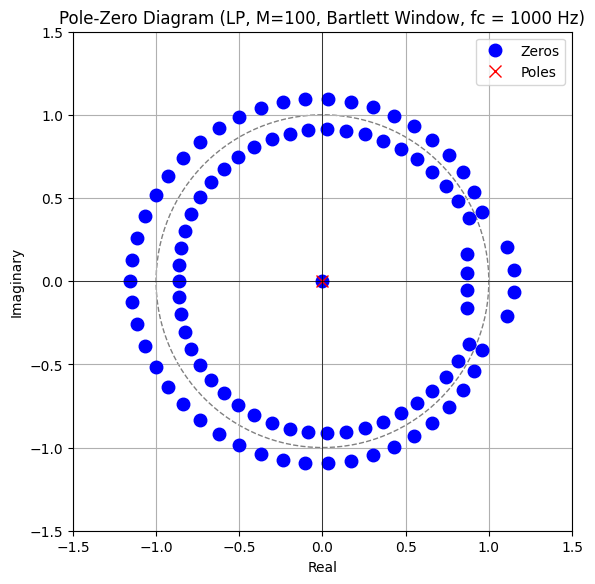

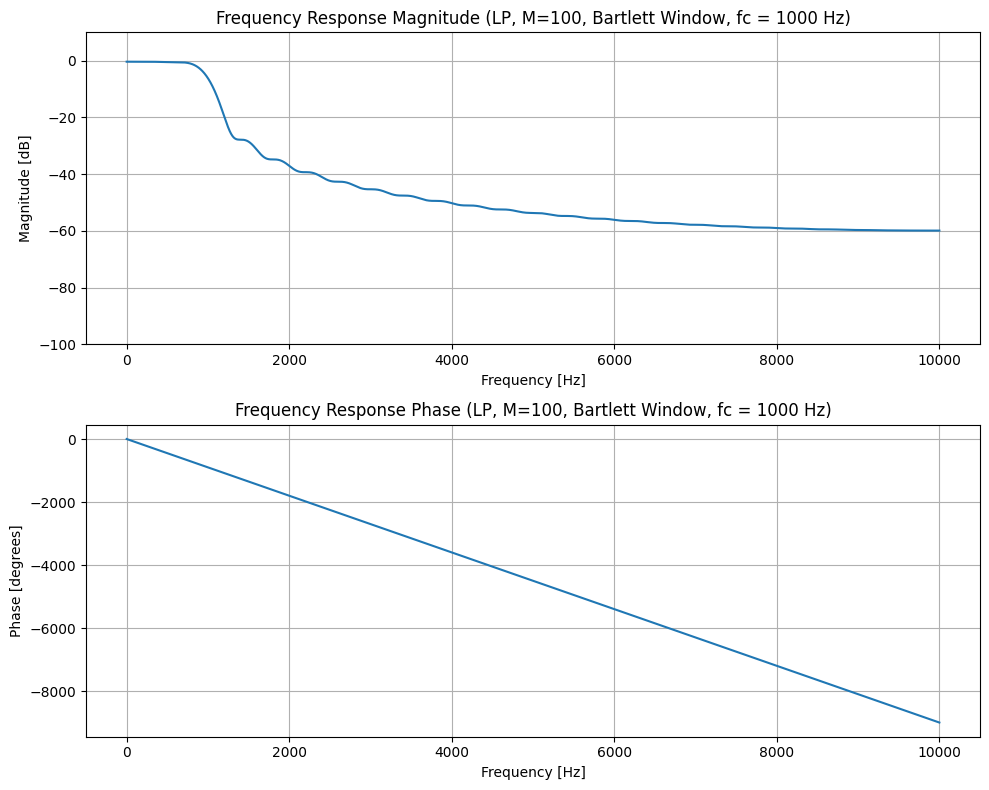

Comments for LP Filter (M=100, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Bartlett) ---


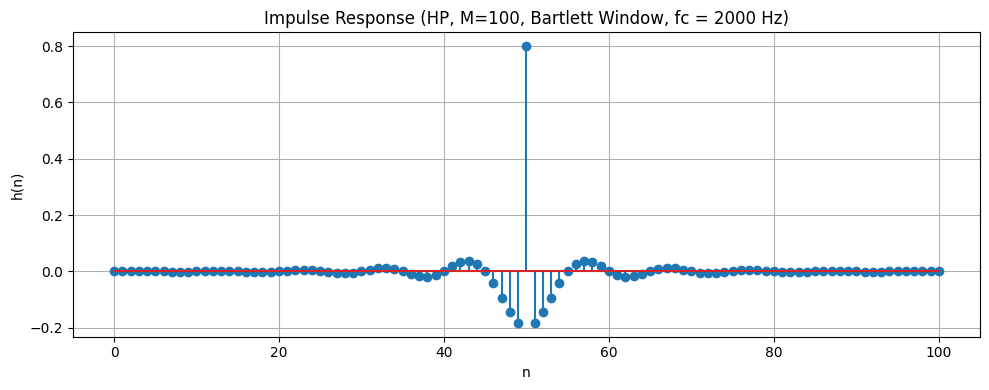

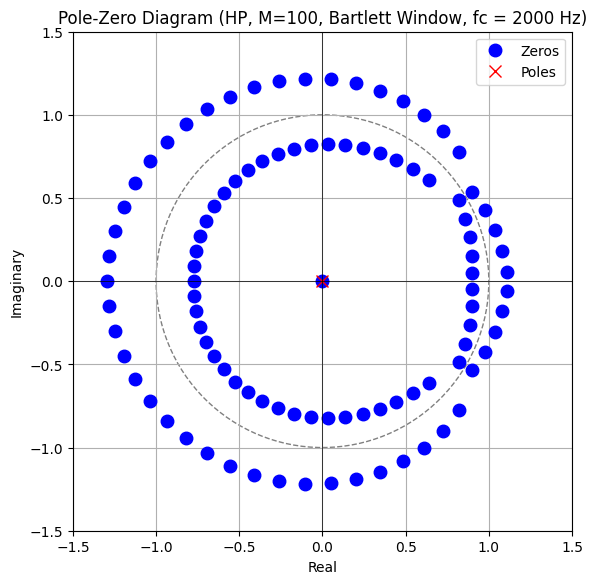

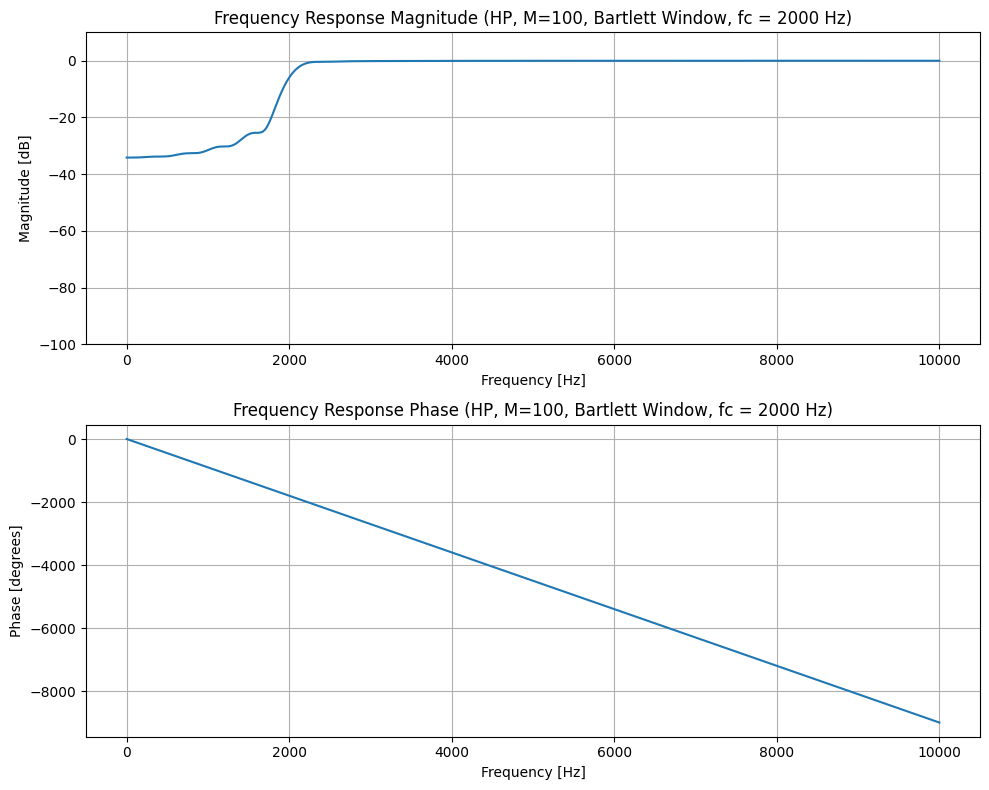

Comments for HP Filter (M=100, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Bartlett) ---


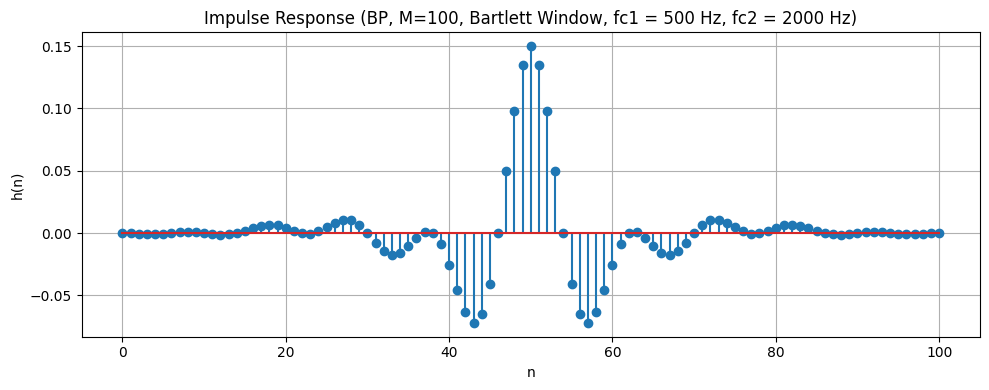

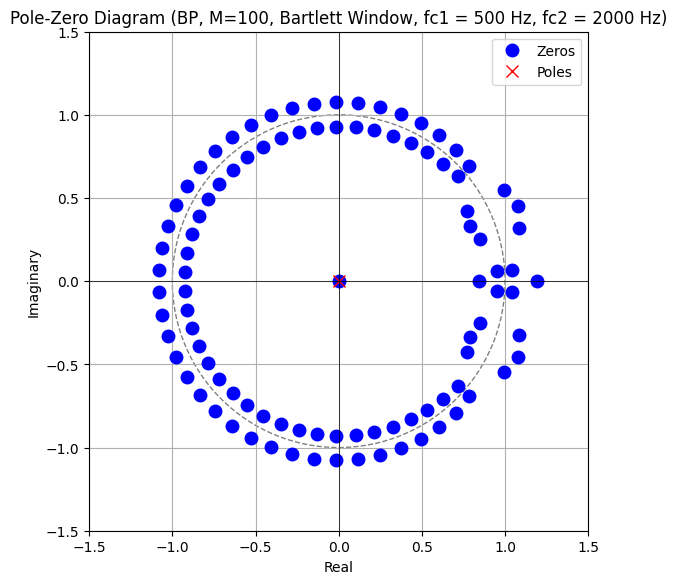

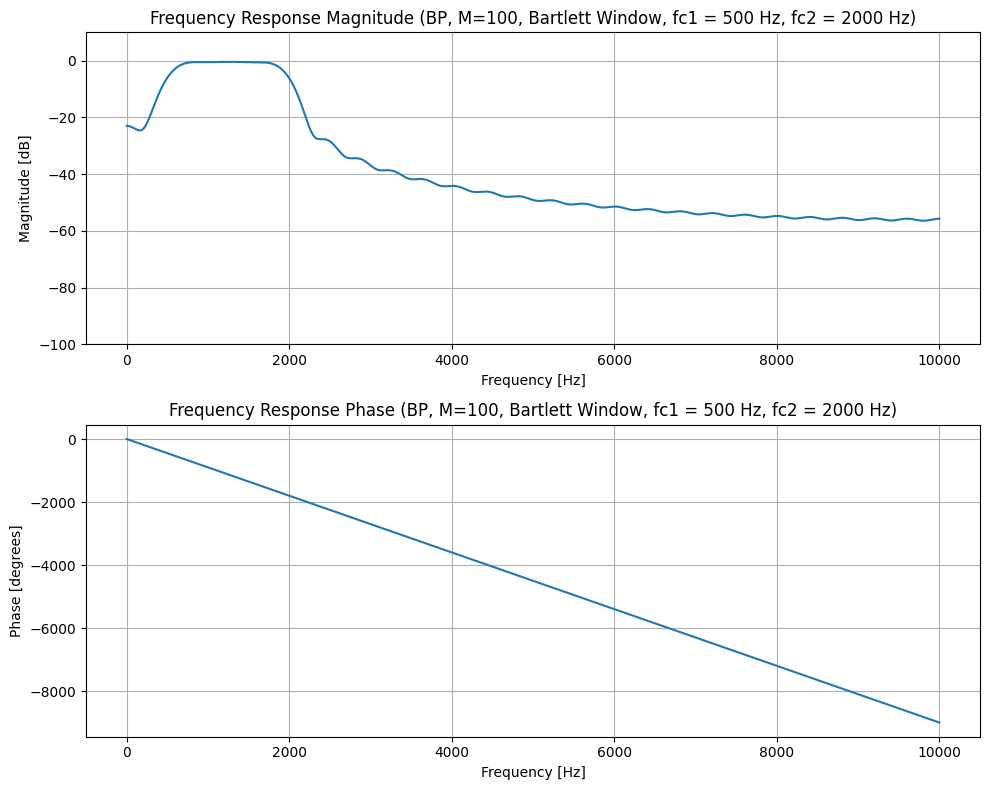

Comments for BP Filter (M=100, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Bartlett) ---


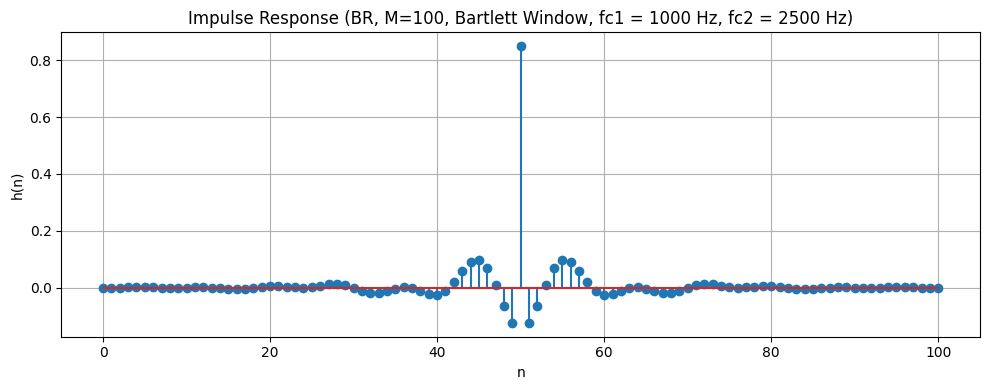

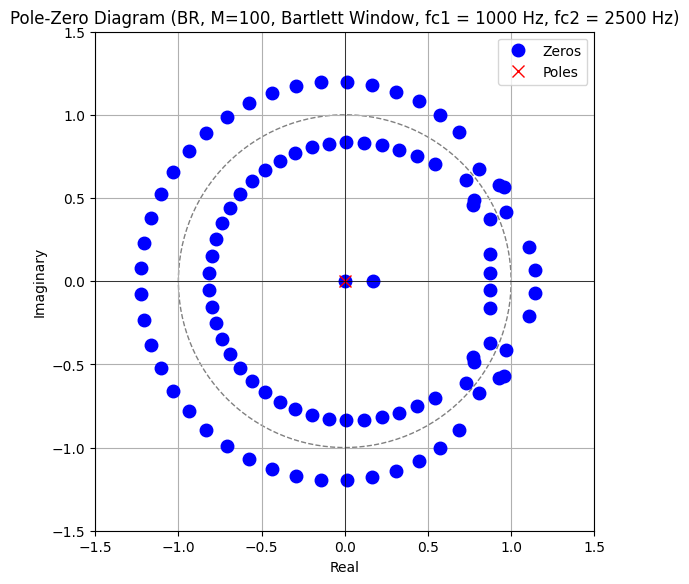

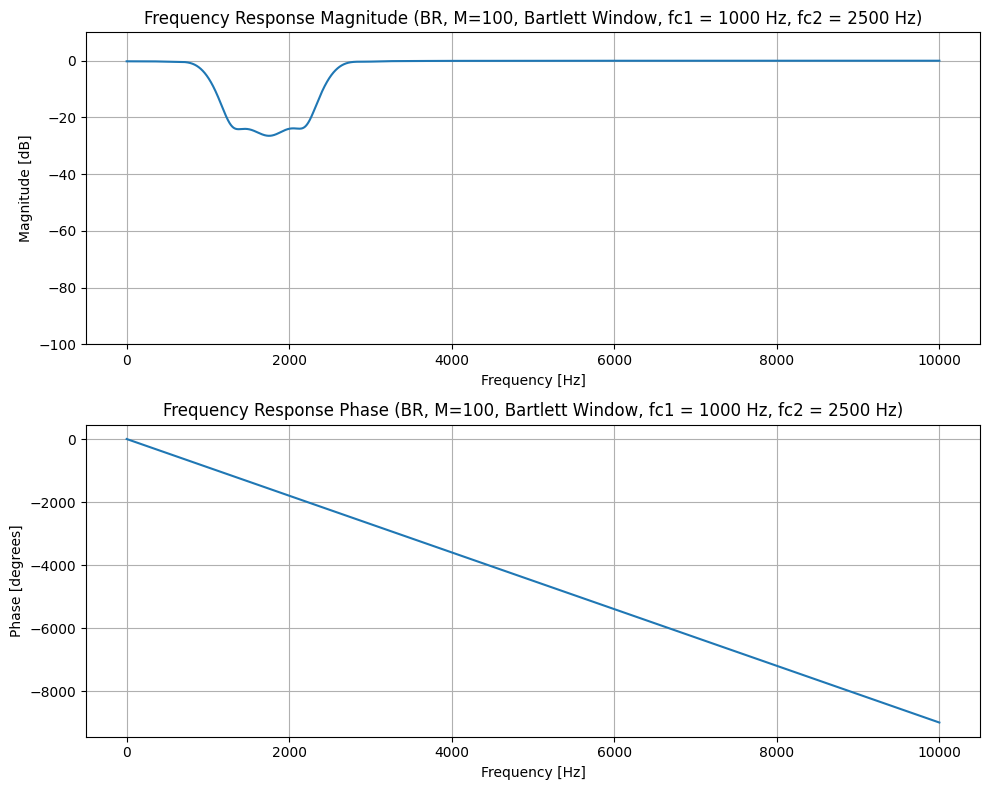

Comments for BR Filter (M=100, Window: Bartlett):
  - Impulse Response: Tapers linearly to zero at the ends, reducing abrupt transitions.
  - Pole-Zero Diagram: Zeros tend to be more spread out, and their proximity to the unit circle influences the smoothness of the frequency response.
  - Frequency Response: Smoother response than rectangular, with reduced ripples but wider transition band and better stopband attenuation. The main lobe is wider.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing LP Filter (M=100, Window: Hamming) ---


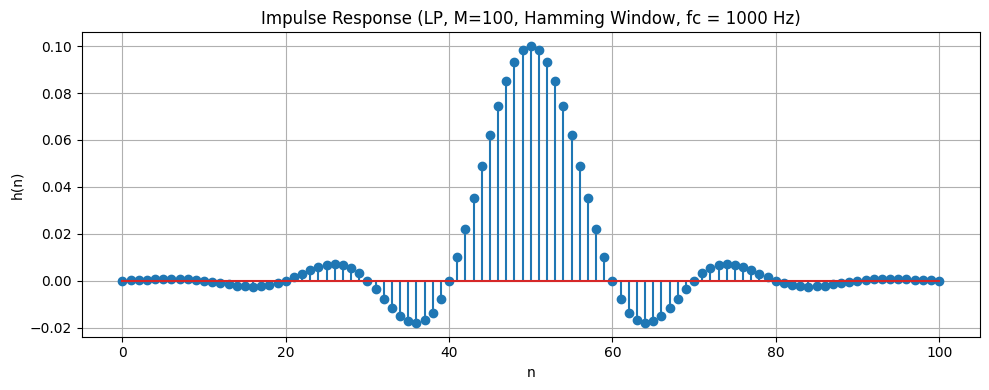

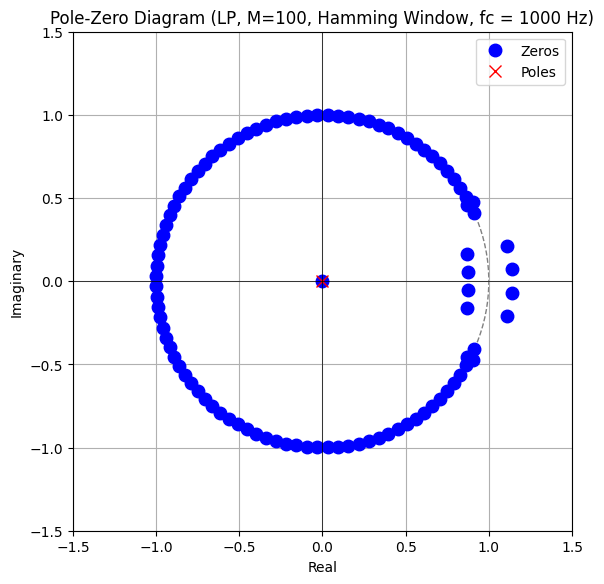

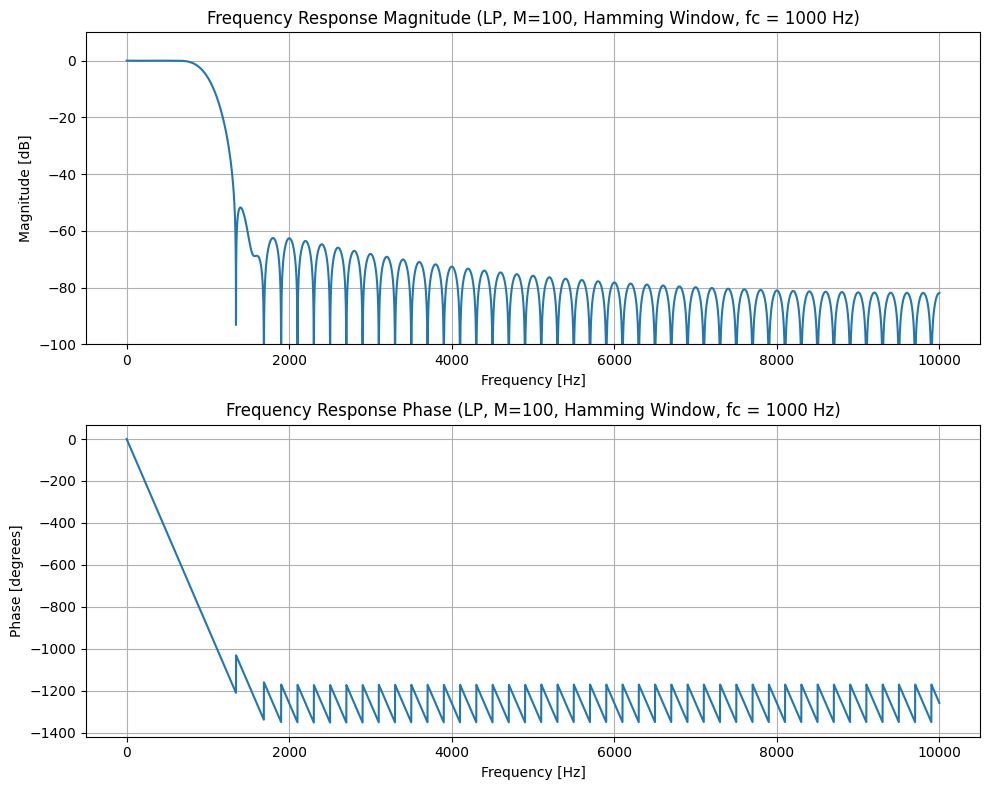

Comments for LP Filter (M=100, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Hamming) ---


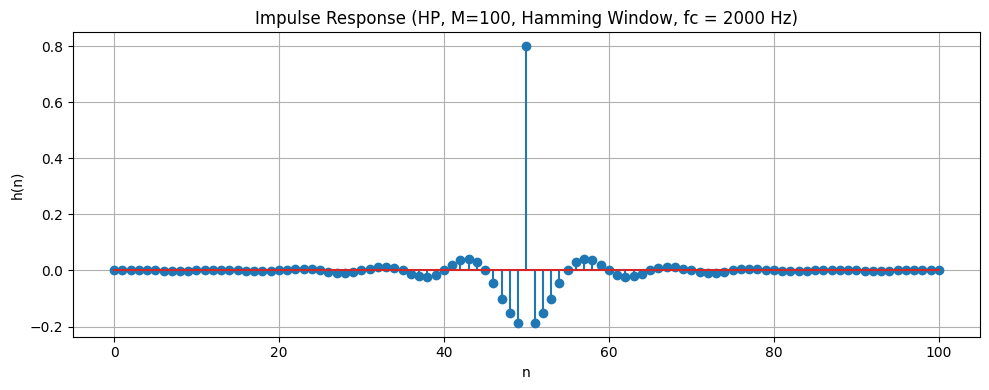

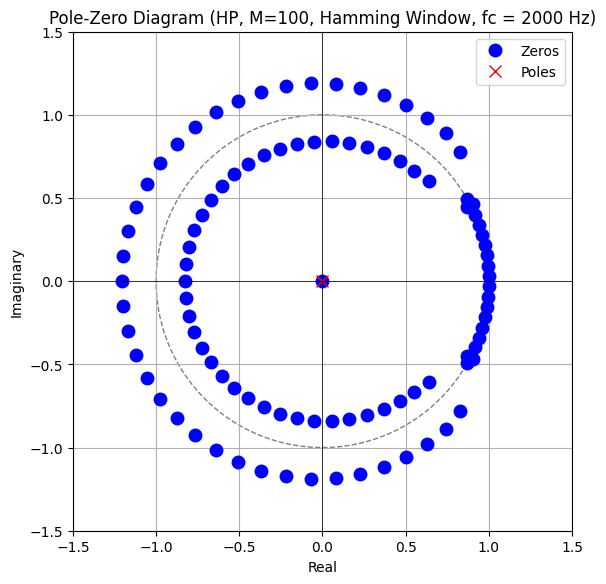

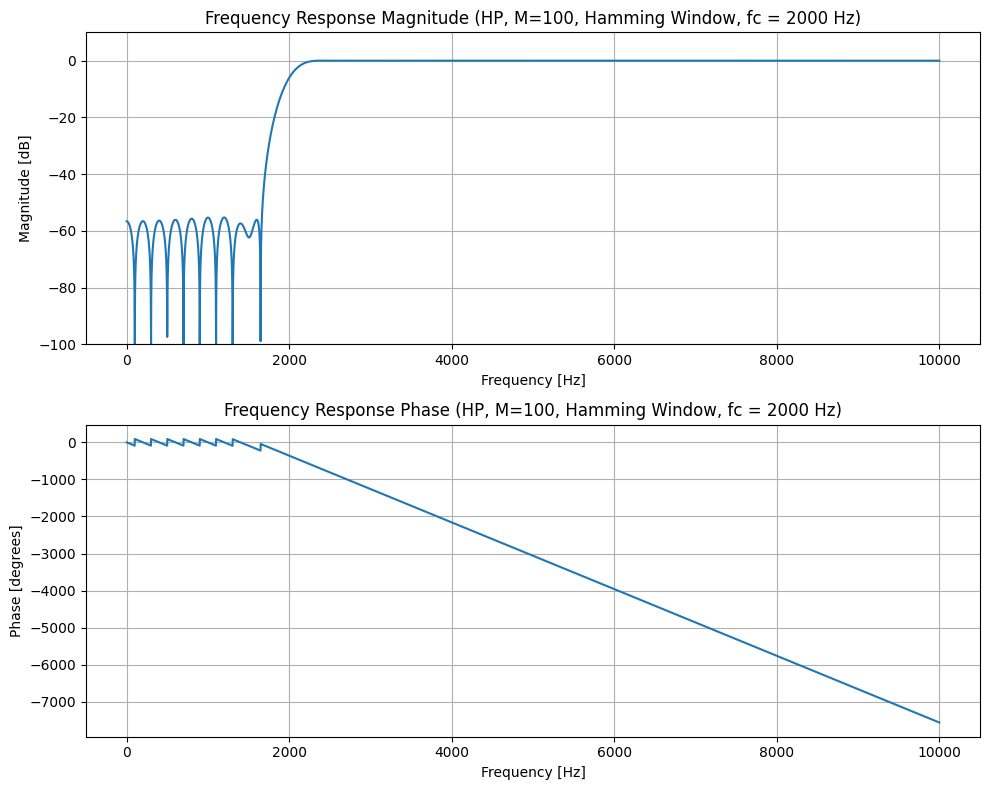

Comments for HP Filter (M=100, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Hamming) ---


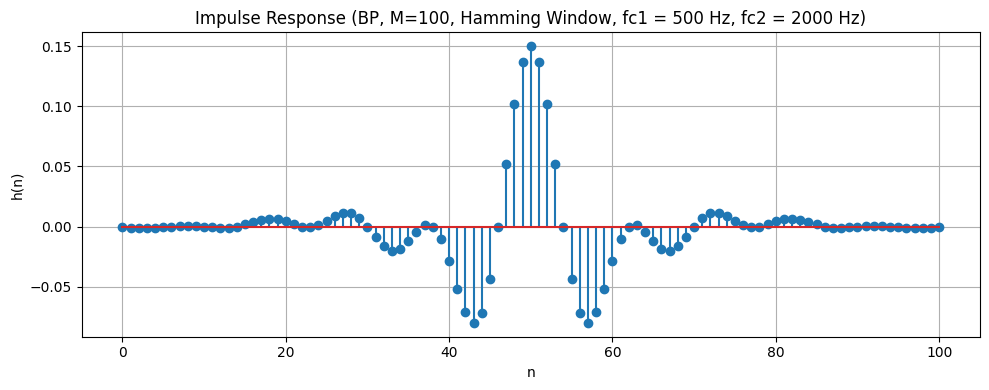

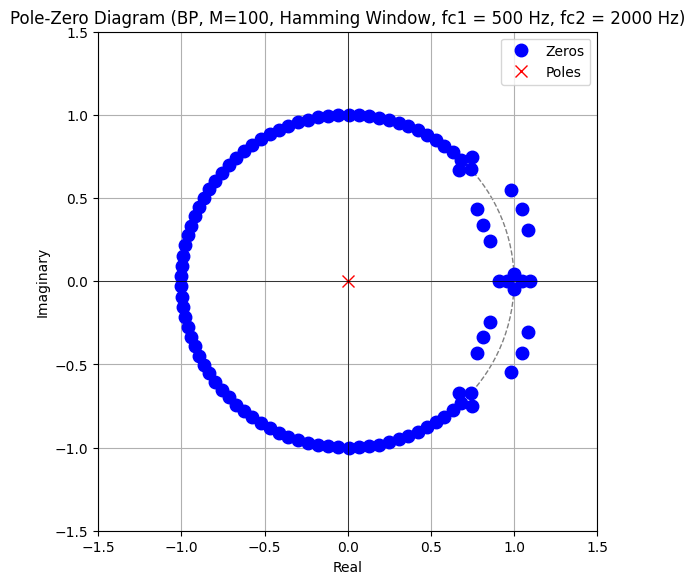

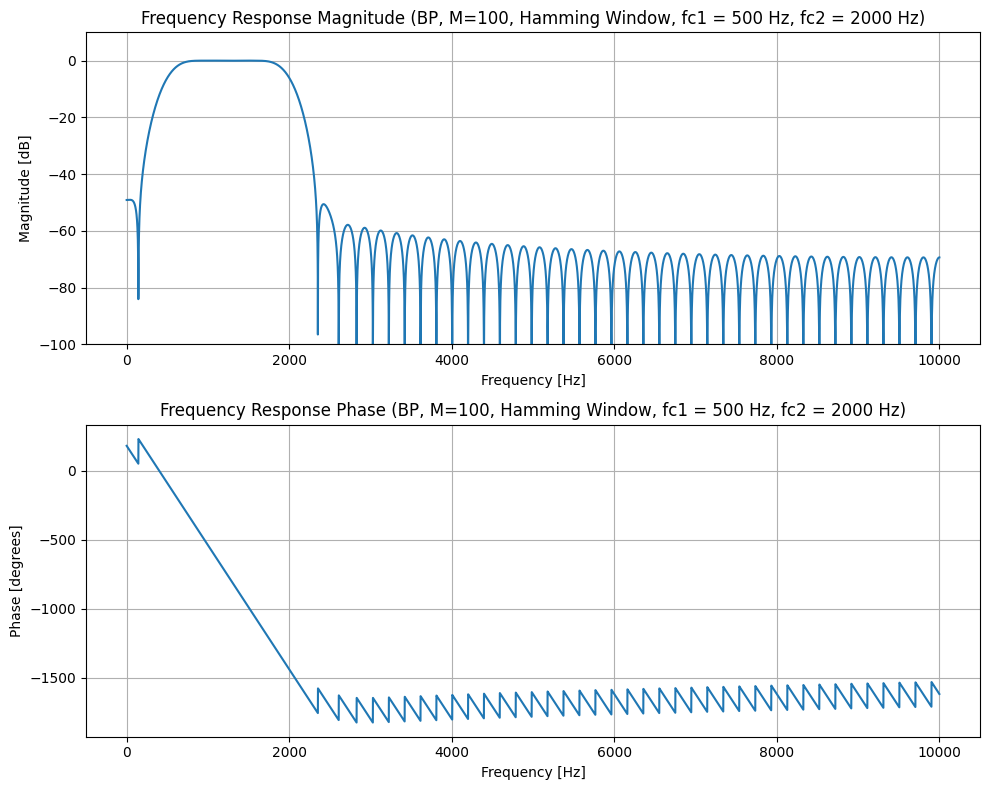

Comments for BP Filter (M=100, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Hamming) ---


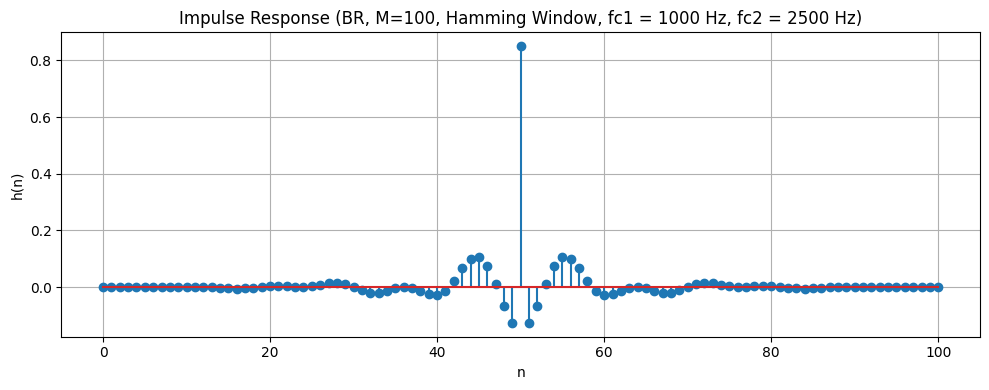

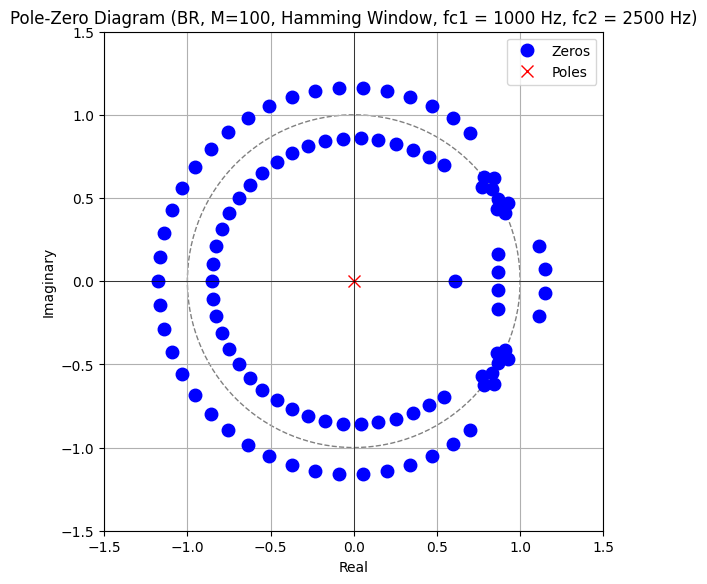

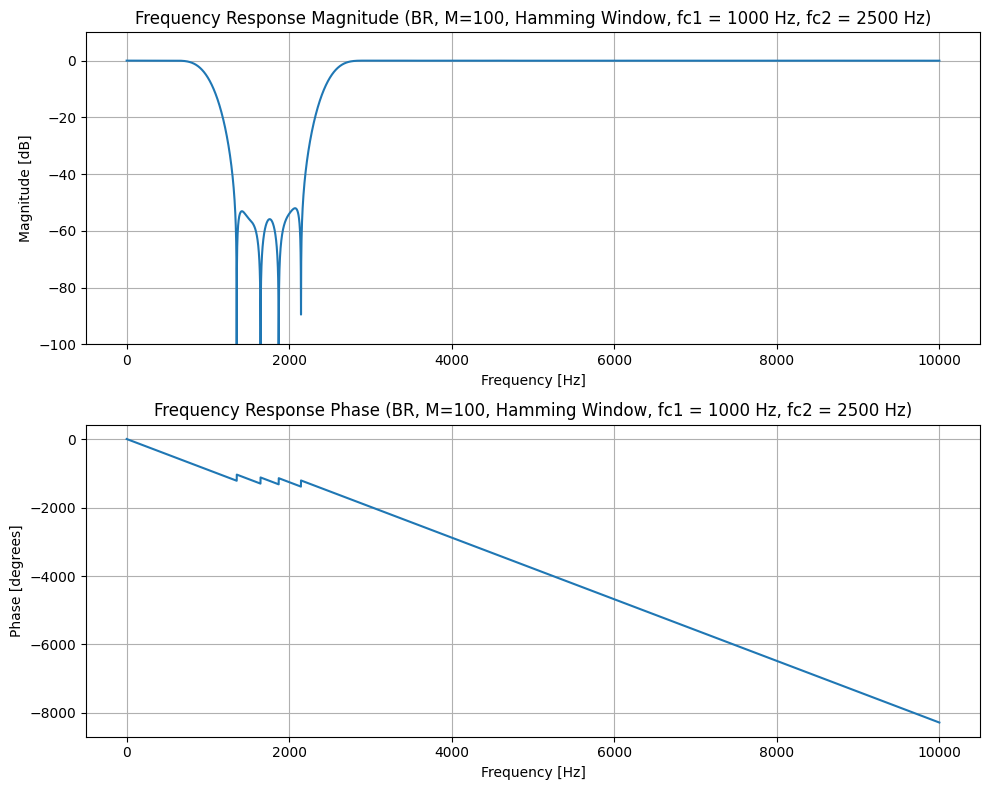

Comments for BR Filter (M=100, Window: Hamming):
  - Impulse Response: Shaped by a raised cosine, providing a smoother transition to zero.
  - Pole-Zero Diagram: Zeros are positioned to minimize sidelobe levels.
  - Frequency Response: Offers a good compromise between main lobe width and sidelobe attenuation. Has better stopband attenuation than rectangular or triangular, with smaller ripples.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing LP Filter (M=100, Window: Hann) ---


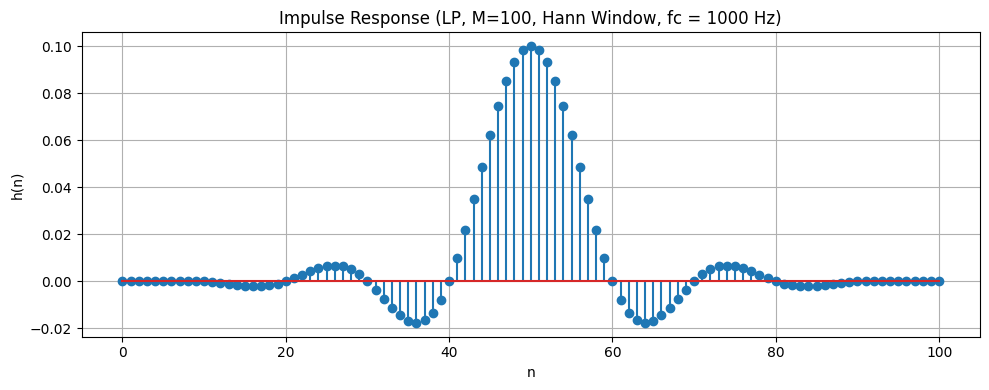

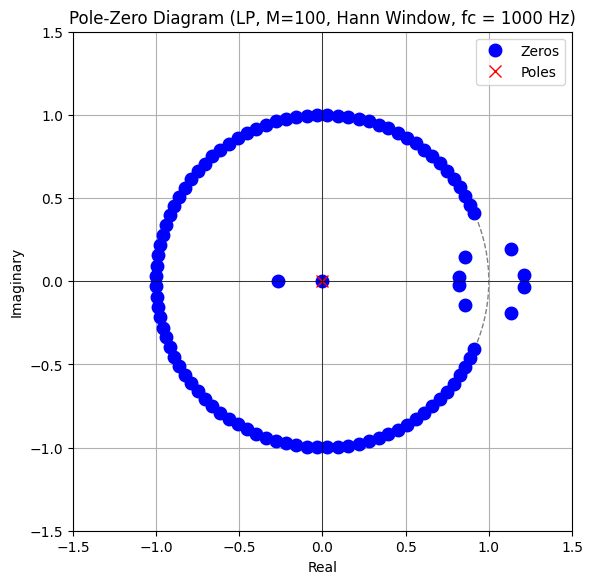

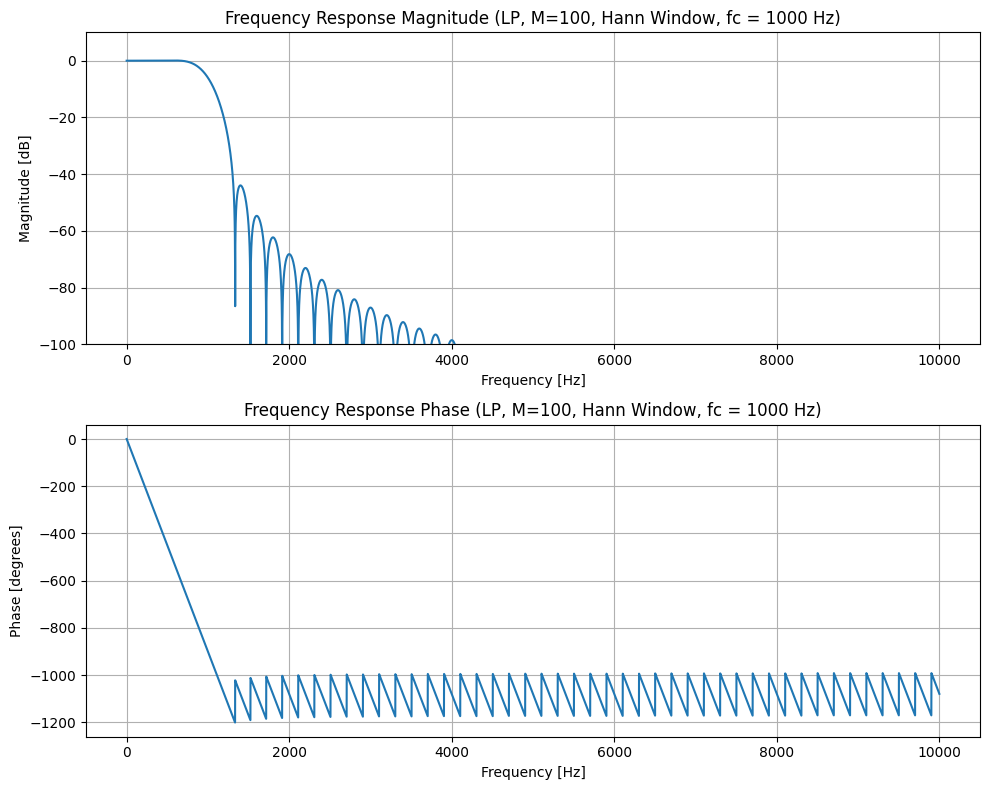

Comments for LP Filter (M=100, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Hann) ---


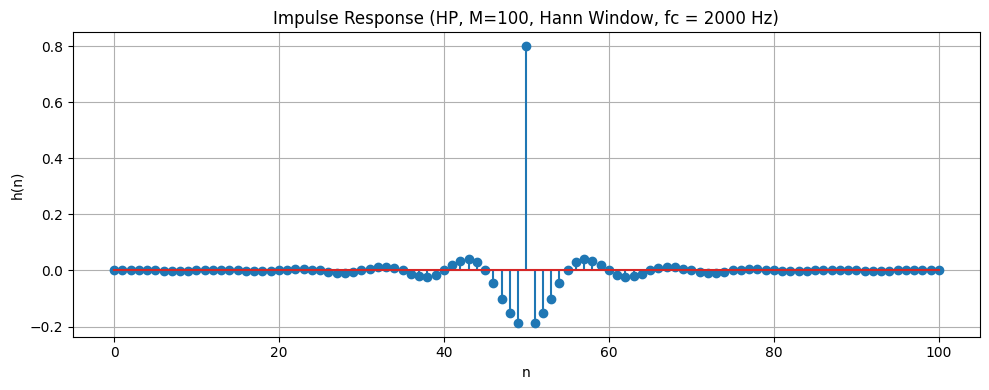

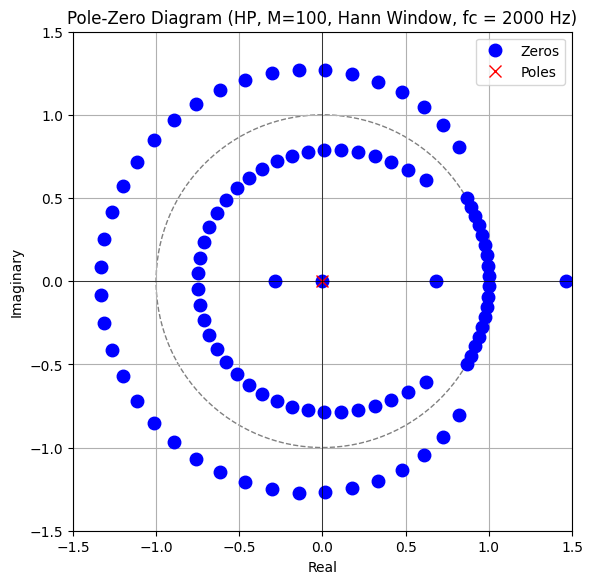

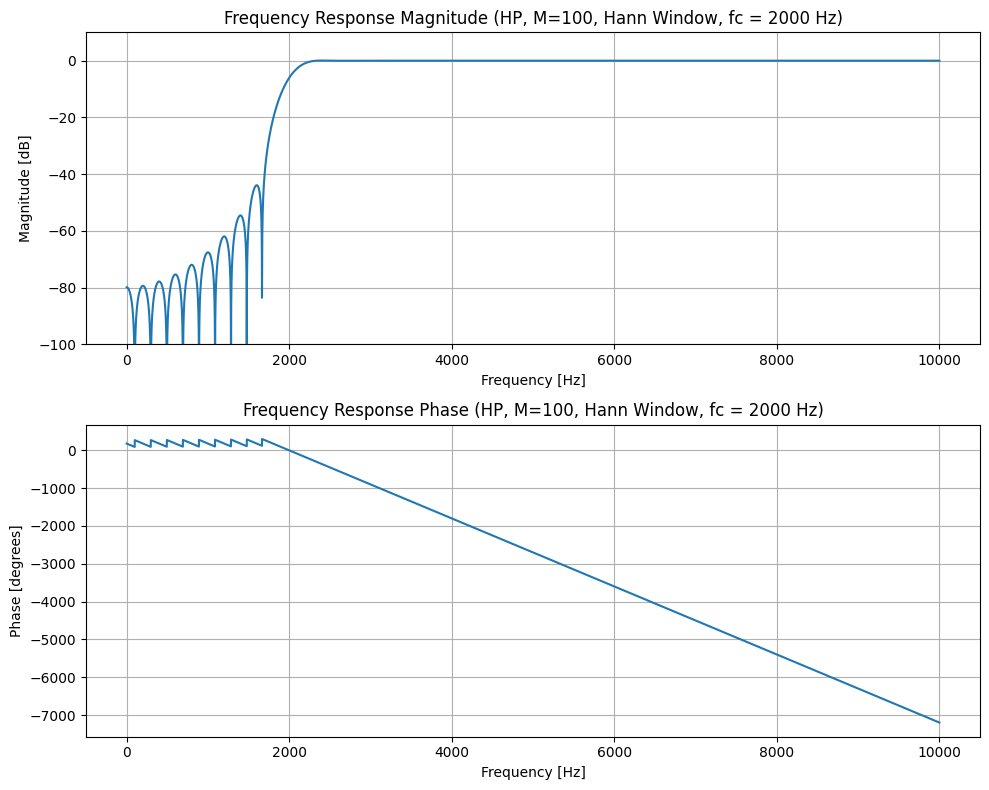

Comments for HP Filter (M=100, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Hann) ---


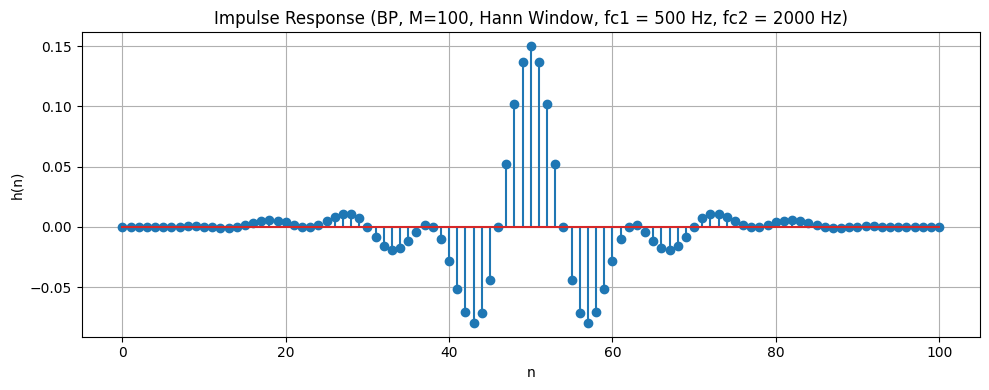

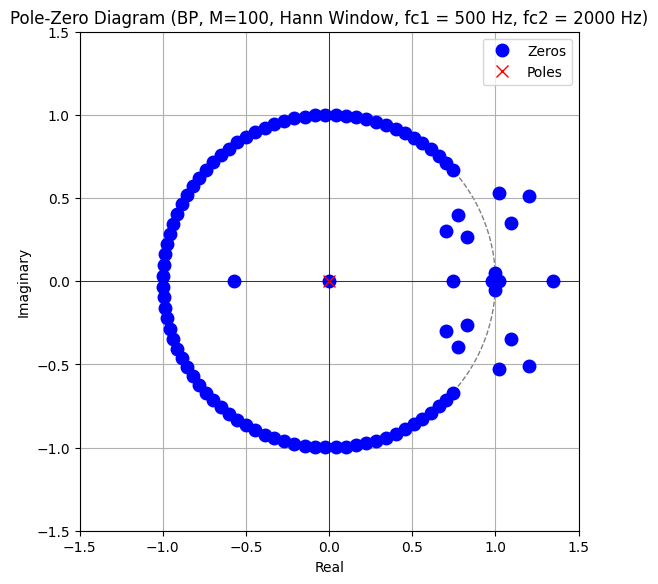

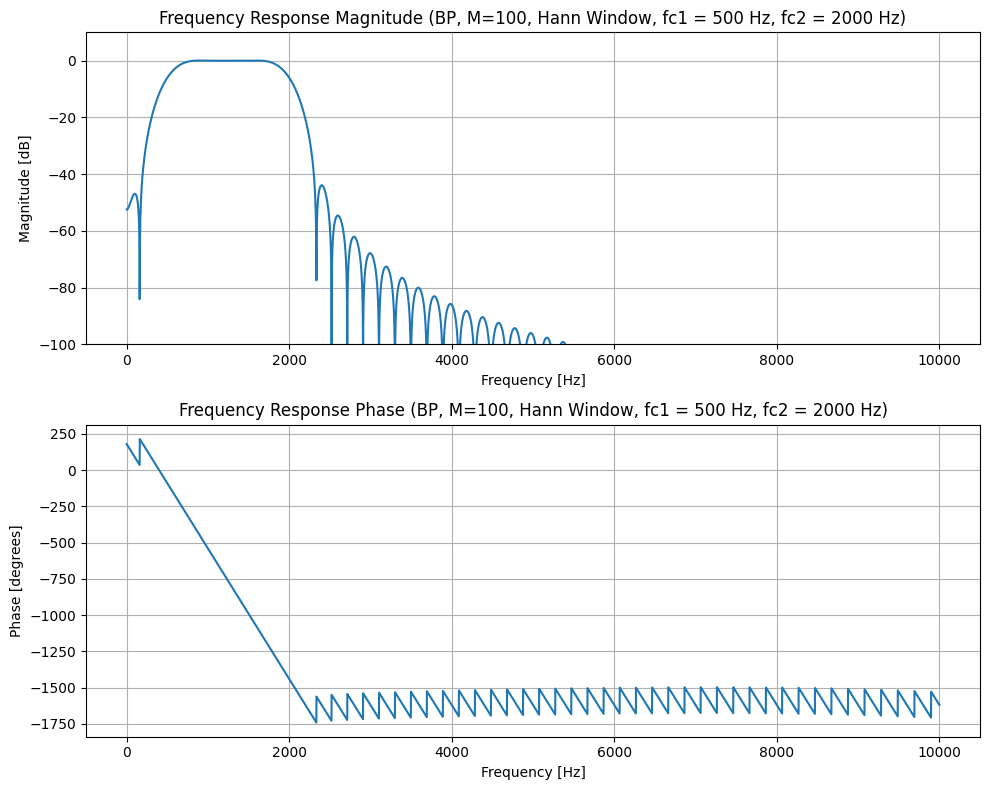

Comments for BP Filter (M=100, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Hann) ---


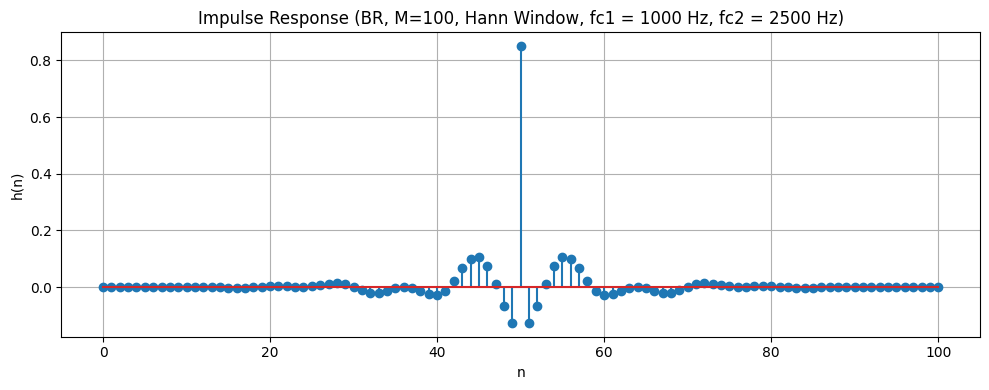

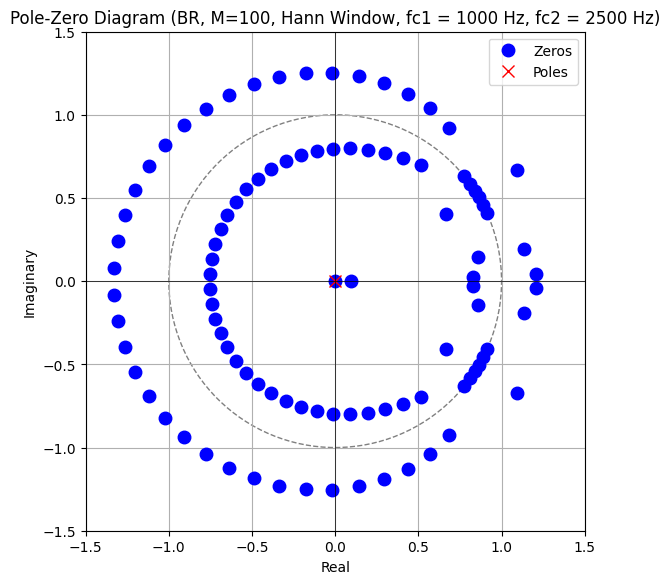

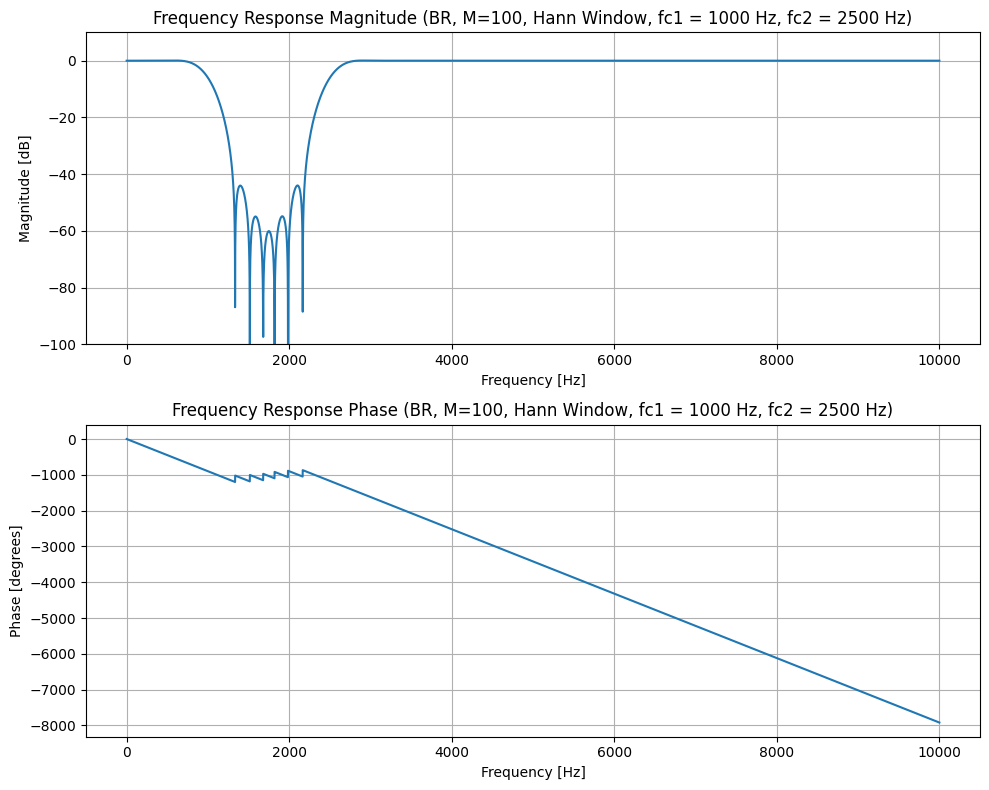

Comments for BR Filter (M=100, Window: Hann):
  - Impulse Response: Similar to Hamming, but with a different cosine weighting.
  - Pole-Zero Diagram: Zeros are placed to achieve smooth frequency response.
  - Frequency Response: Very smooth frequency response with good sidelobe attenuation, though the main lobe is wider than Hamming and stopband attenuation is slightly less good than Blackman.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing LP Filter (M=100, Window: Blackman) ---


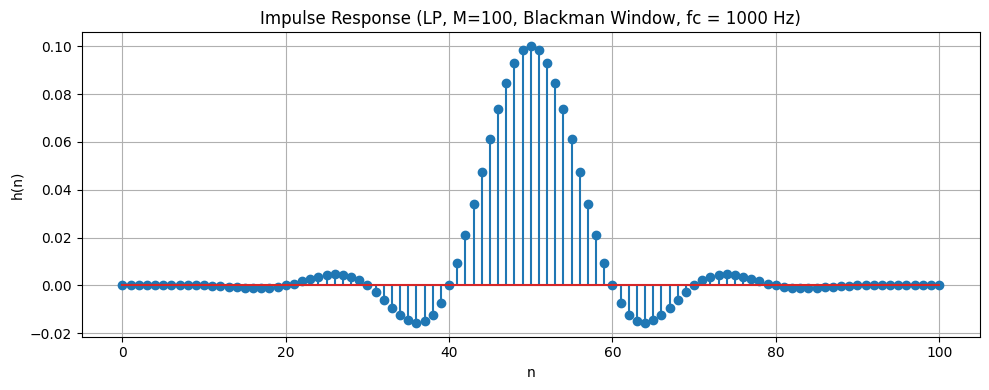

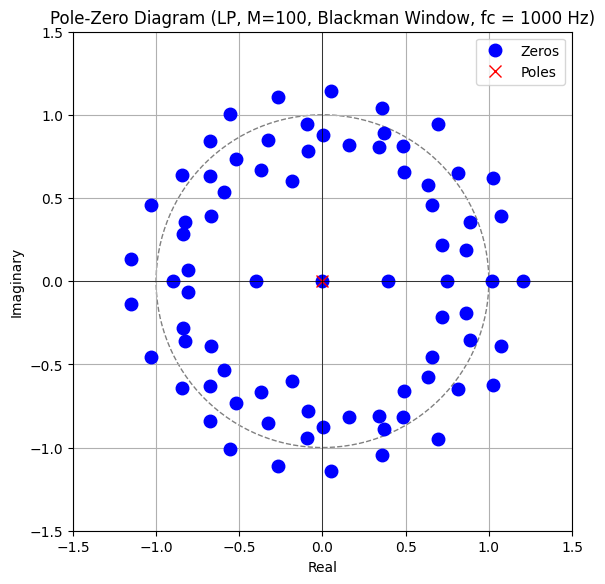

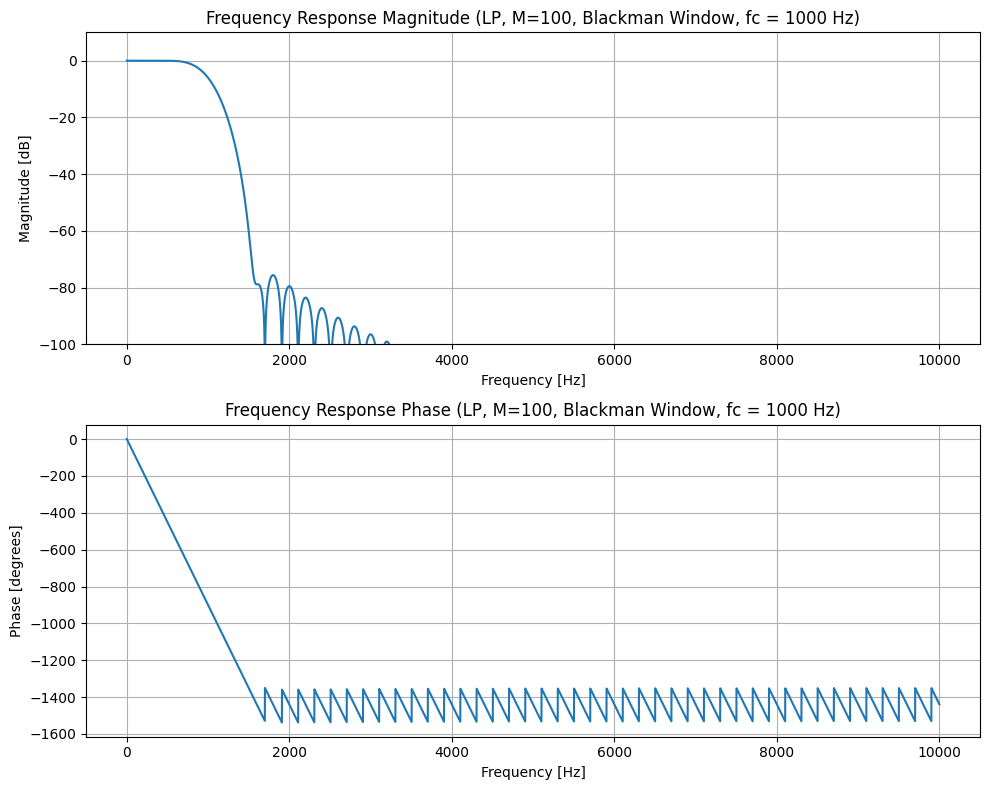

Comments for LP Filter (M=100, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing HP Filter (M=100, Window: Blackman) ---


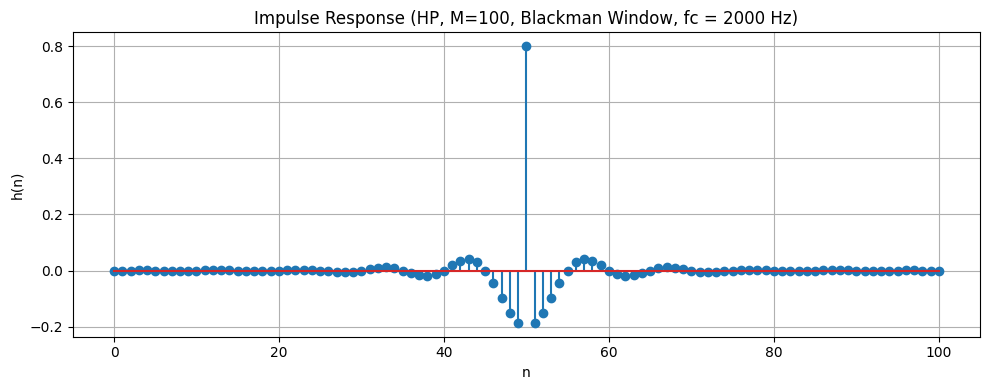

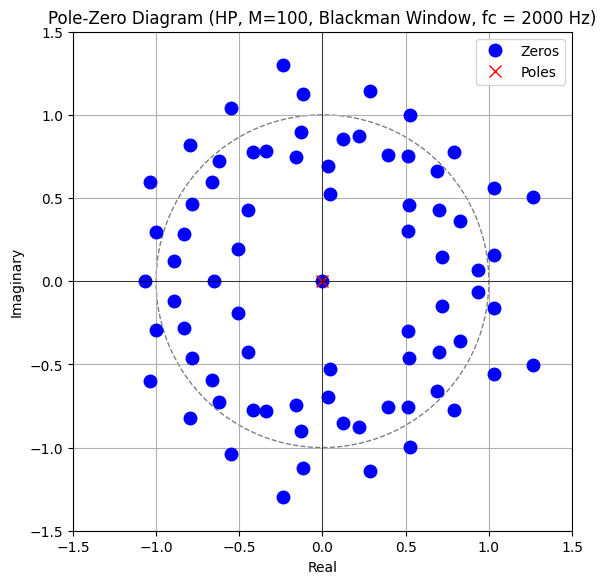

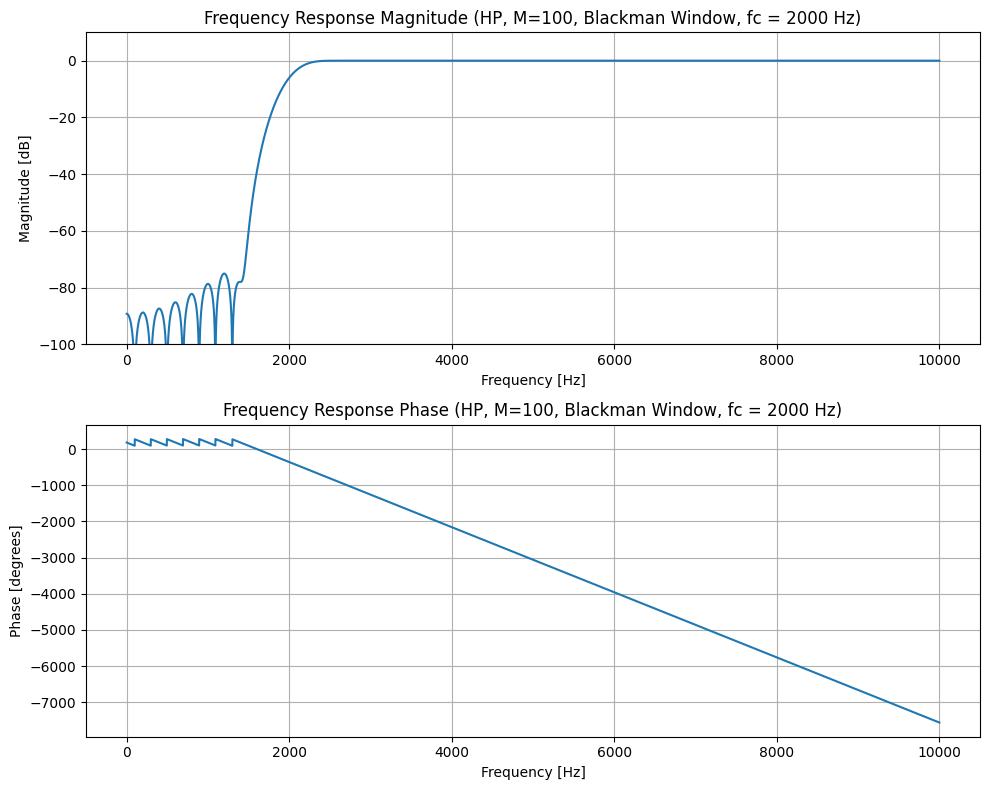

Comments for HP Filter (M=100, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BP Filter (M=100, Window: Blackman) ---


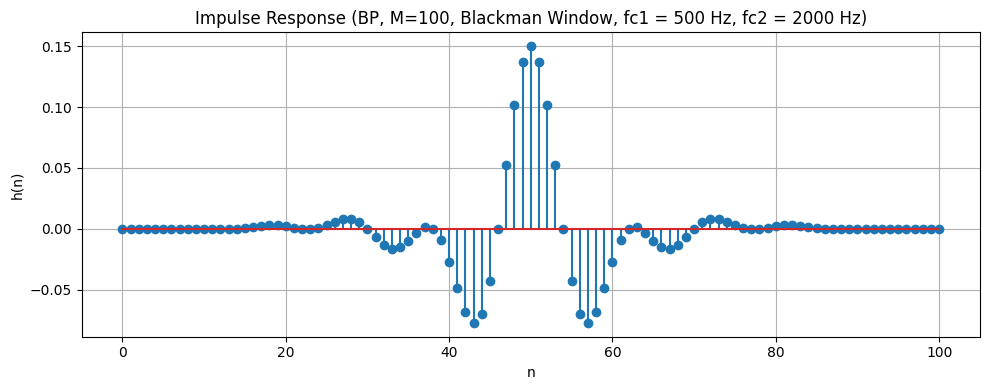

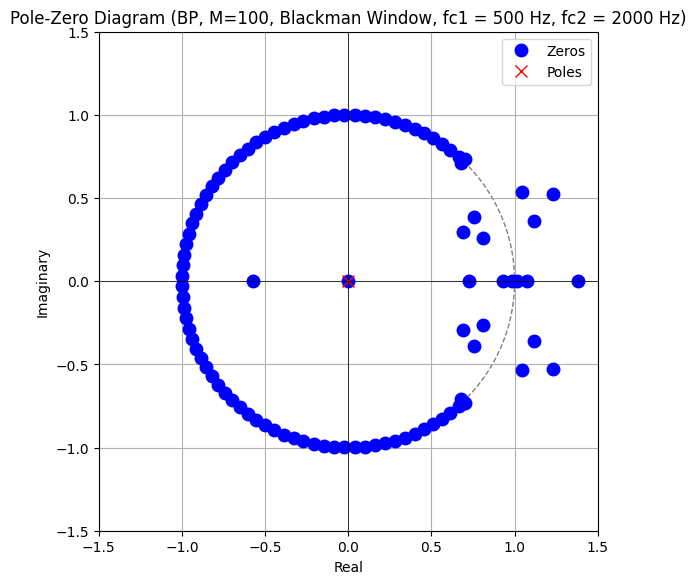

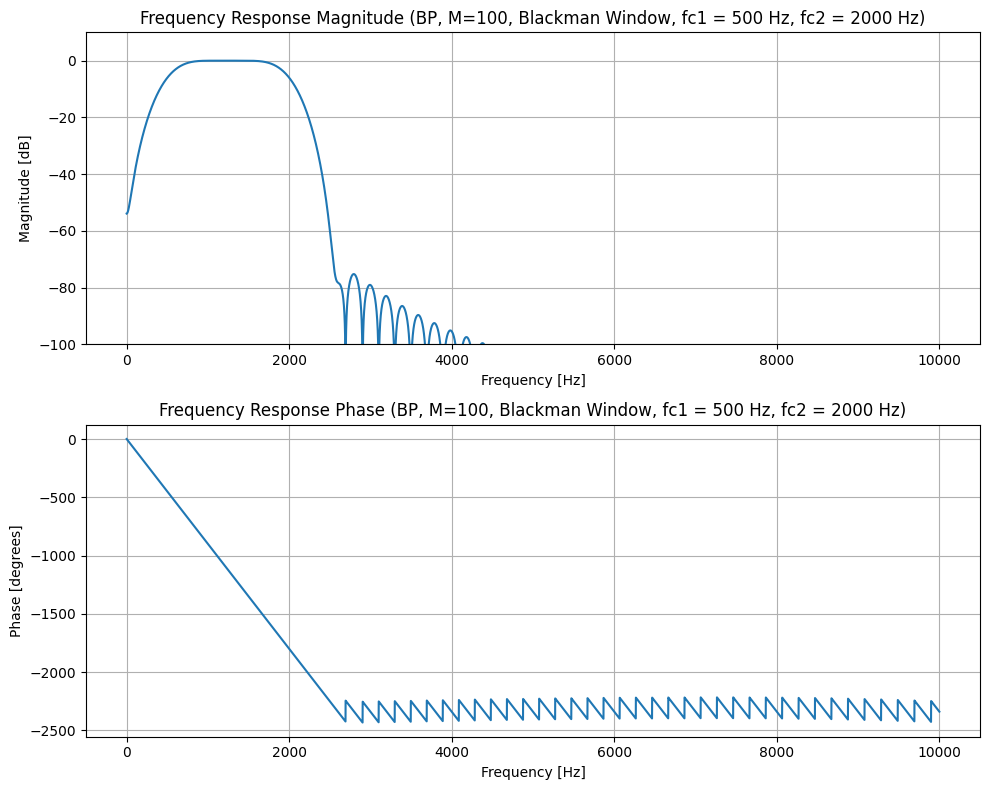

Comments for BP Filter (M=100, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.

--- Designing BR Filter (M=100, Window: Blackman) ---


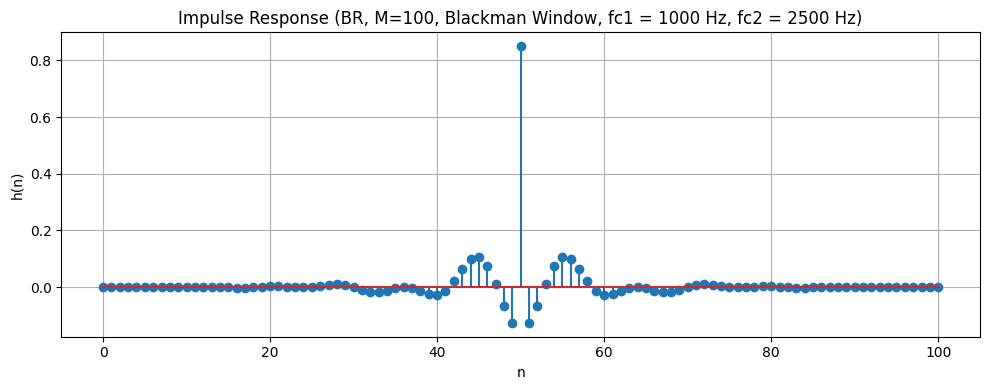

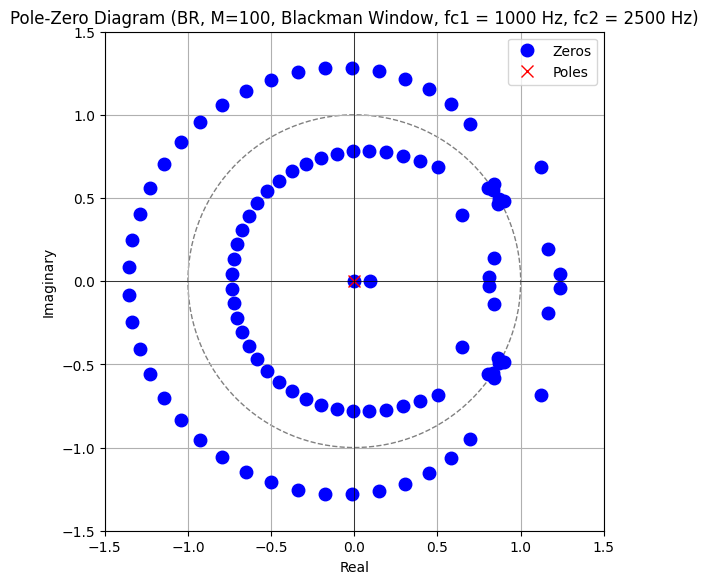

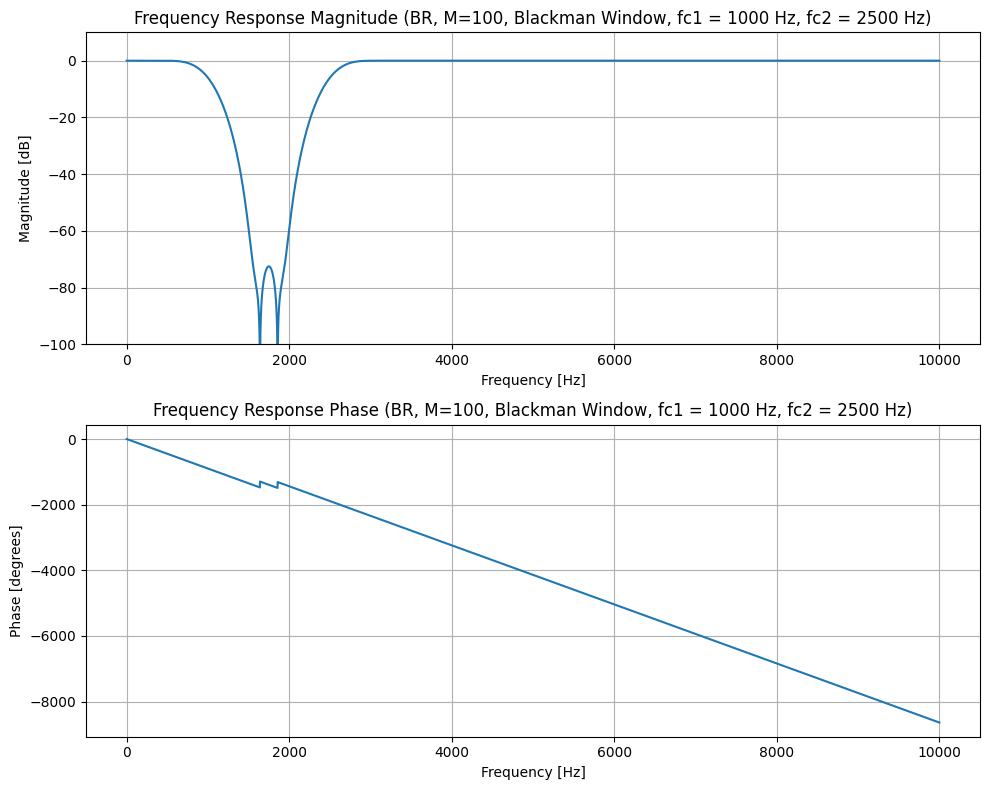

Comments for BR Filter (M=100, Window: Blackman):
  - Impulse Response: Uses a three-term cosine series for tapering, resulting in a very smooth window.
  - Pole-Zero Diagram: Zeros are configured for the highest sidelobe attenuation among the simpler windows.
  - Frequency Response: Provides excellent sidelobe attenuation, but at the cost of the widest main lobe and thus the widest transition band. Ripples are minimal.
  - General comment for M=100: Higher order filters offer sharper transition bands and greater stopband attenuation, but increase computational complexity and group delay.


In [16]:
window_functions = {
    'Rectangular': rectangular_window,
    'Triangular': triangular_window,
    'Bartlett': bartlett_window, # Note: Bartlett is generally triangular for even M
    'Hamming': hamming_window,
    'Hann': hann_window,
    'Blackman': blackman_window,
}

filter_types = ['lp', 'hp', 'bp', 'br']

for M in M_values:
    for window_name, window_func in window_functions.items():
        for filter_type in filter_types:
            design_and_analyze_fir_filter(filter_type, M, window_func, window_name)


QUESTÃO 2 - Para as respostas de módulo mostrada na figura
abaixo, derive a resposta ao impulso do filtro ideal. Em
seguida, projete um filtro FIR de ordem M ∈ {50, 100}
utilizando as janelas retangular, triangular, Hamming,
Hann e Blackman. Apresente a resposta ao impulso, o
diagrama de polos e zeros e a resposta em frequência dos
filtros projetados. Comente os resultados obtidos.

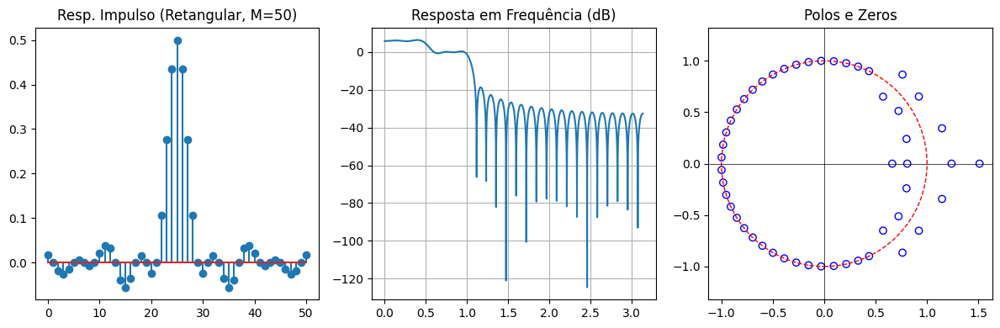

/usr/local/lib/python3.12/dist-packages/scipy/signal/_filter_design.py:1230: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  b, a = normalize(b, a)


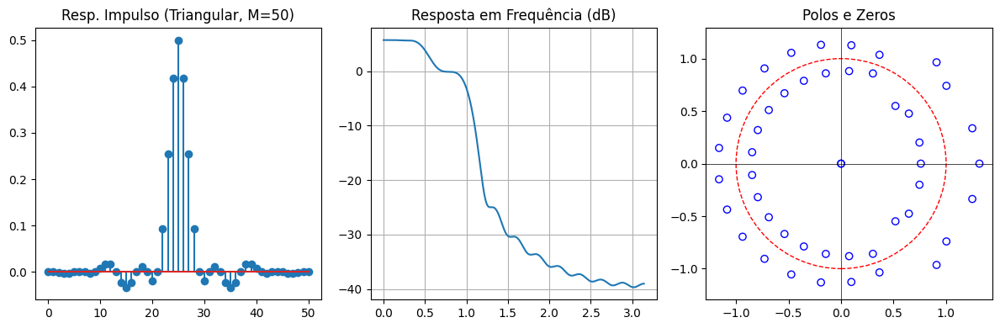

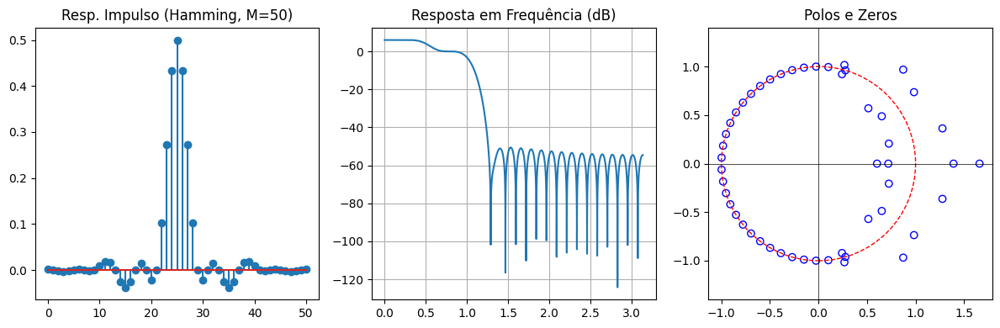

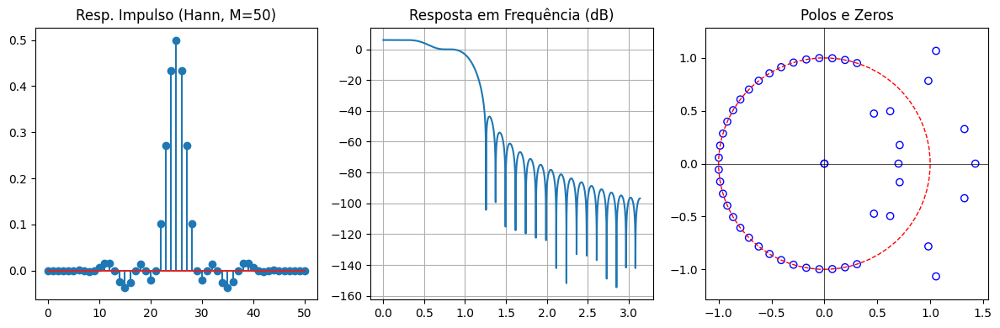

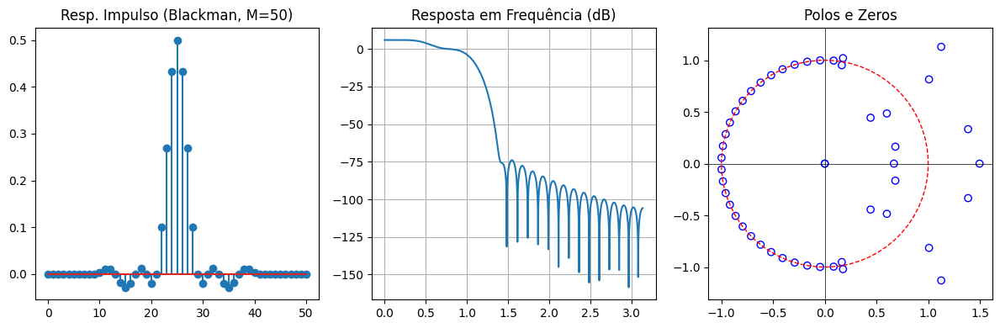

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal

def projetar_e_plotar(M, filtro_num=1):
    n_ideal = np.arange(-M/2, M/2 + 1)

    # Evitar divisão por zero na expressão analítica
    with np.errstate(divide='ignore', invalid='ignore'):
        if filtro_num == 1:
            h_id = (np.sin(np.pi * n_ideal / 6) + np.sin(np.pi * n_ideal / 3)) / (np.pi * n_ideal)
            h_id[n_ideal == 0] = 0.5
        # Adicione elif para os filtros 2 e 3 aqui...

    janelas = {
        'Retangular': np.ones(M + 1),
        'Triangular': signal.windows.bartlett(M + 1),
        'Hamming': signal.windows.hamming(M + 1),
        'Hann': signal.windows.hann(M + 1),
        'Blackman': signal.windows.blackman(M + 1)
    }

    for nome, w in janelas.items():
        h = h_id * w

        # 1. Resposta ao Impulso
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.stem(h)
        plt.title(f'Resp. Impulso ({nome}, M={M})')

        # 2. Resposta em Frequência
        w_freq, H_freq = signal.freqz(h, worN=8000)
        plt.subplot(1, 3, 2)
        plt.plot(w_freq, 20 * np.log10(np.abs(H_freq) + 1e-8))
        plt.title('Resposta em Frequência (dB)')
        plt.grid(True)

        # 3. Polos e Zeros
        plt.subplot(1, 3, 3)
        zeros, polos, k = signal.tf2zpk(h, [1])
        plt.scatter(np.real(zeros), np.imag(zeros), marker='o', edgecolors='b', facecolors='none')
        plt.axhline(0, color='black',lw=0.5); plt.axvline(0, color='black',lw=0.5)
        # Desenhar círculo unitário
        circulo = plt.Circle((0,0), 1, color='r', fill=False, linestyle='--')
        plt.gca().add_patch(circulo)
        plt.title('Polos e Zeros')
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

# Exemplo de execução para M=50 e Filtro 1
projetar_e_plotar(M=50, filtro_num=1)

QUESTÃO 3 - 3. Deseja-se aplicar técnicas de processamento digital
de sinais para análise, modelagem e remoção de interferências em um sinal de áudio corrompido utilizando filtros FIR.
Considere o arquivo de áudio handel.wav. Seja x(t) o sinal de áudio original e construa um sinal contaminado dado por y(t) = x(t) + 0.05 cos(200πt) + 0.075 sin(4000πt) + n(t), onde x(t) é o sinal de áudio proveniente do arquivo handel.wav, o termo 0.05 cos(200πt) representa uma interferência senoidal de baixa frequência, o termo 0.075 sin(4000πt) representa uma interferência tonal de alta frequência e e n(t) é um sinal de ruído branco com variância σ^2 ∈ {10−2, 10−1, 1}.

In [22]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal

# 1. Carregar o arquivo de áudio original
# Caso o arquivo esteja no mesmo diretório, use 'handel.wav'
fs, x = wav.read('handel.wav')

# Garantir que o sinal está normalizado entre -1 e 1 e é mono
if x.dtype == np.int16:
    x = x / 32768.0
elif len(x.shape) > 1:
    x = x[:, 0]

N_samples = len(x)
t = np.arange(N_samples) / fs

# 2. Construir as interferências determinísticas
interf_baixa = 0.05 * np.cos(200 * np.pi * t)
interf_alta = 0.075 * np.sin(4000 * np.pi * t)

# Escolha a variância do ruído aqui: 1e-2, 1e-1, ou 1
variancia = 10**(-2)
ruido = np.random.normal(0, np.sqrt(variancia), N_samples)

# Sinal contaminado y[n]
y = x + interf_baixa + interf_alta + ruido

# 3. Projeto do Filtro FIR Multibanda (Passa-Faixa)
# Vamos deixar passar de 150 Hz até 1800 Hz para eliminar as duas componentes tonais
# Frequências de corte normalizadas (Nyquist = fs / 2)
f_corte_inferior = 150 / (fs / 2)
f_corte_superior = 1800 / (fs / 2)

# Ordem do filtro FIR (ajuste para maior seletividade se necessário)
M = 150

# Coeficientes do filtro usando janela de Hamming
num_coef = signal.firwin(M + 1, [f_corte_inferior, f_corte_superior], pass_zero=False, window='hamming')

# 4. Filtragem do sinal contaminado
y_filtrado = signal.lfilter(num_coef, 1.0, y)

# 5. Salvar os arquivos para análise auditiva
wav.write('handel_contaminado.wav', fs, np.asarray(y, dtype=np.float32))
wav.write('handel_recuperado.wav', fs, np.asarray(y_filtrado, dtype=np.float32))

print("Processamento concluído com sucesso!")

Processamento concluído com sucesso!


Letra A e B

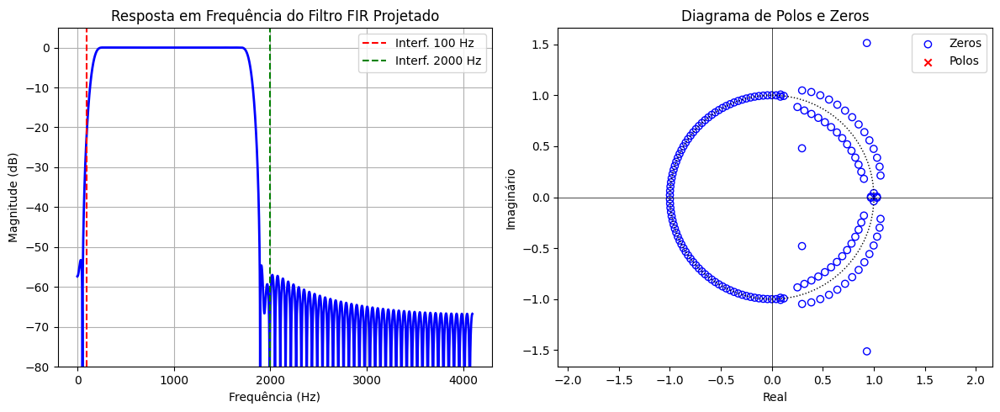

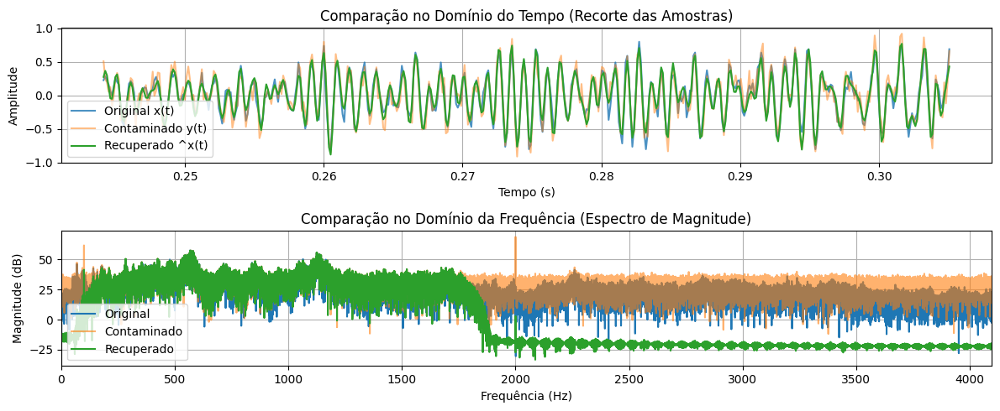

In [23]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal
import matplotlib.pyplot as plt

# 1. Carregamento e Preparação do Áudio Original
fs, x = wav.read('handel.wav')
if x.dtype == np.int16:
    x = x / 32768.0  # Normalização para float entre -1 e 1
elif len(x.shape) > 1:
    x = x[:, 0]      # Garante que é mono

N_samples = len(x)
t = np.arange(N_samples) / fs

# 2. Geração do Sinal Contaminado (Exemplo com Variância = 0.01)
interf_baixa = 0.05 * np.cos(200 * np.pi * t)
interf_alta = 0.075 * np.sin(4000 * np.pi * t)
variance = 0.01
ruido = np.random.normal(0, np.sqrt(variance), N_samples)
y = x + interf_baixa + interf_alta + ruido

# =====================================================================
# ITEM (a): PROJETO DO FILTRO FIR PASSA-FAIXA
# =====================================================================
M = 150  # Ordem do filtro
f_corte_inf = 150 / (fs / 2)
f_corte_sup = 1800 / (fs / 2)

# Coeficientes usando Janela de Hamming
h_fir = signal.firwin(M + 1, [f_corte_inf, f_corte_sup], pass_zero=False, window='hamming')

# --- Gráfico 1: Resposta em Frequência ---
w, H = signal.freqz(h_fir, worN=8000)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot((w * fs) / (2 * np.pi), 20 * np.log10(np.abs(H) + 1e-12), 'b', linewidth=2)
plt.axvline(100, color='r', linestyle='--', label='Interf. 100 Hz')
plt.axvline(2000, color='g', linestyle='--', label='Interf. 2000 Hz')
plt.title('Resposta em Frequência do Filtro FIR Projetado')
plt.xlabel('Frequência (Hz)')
plt.ylabel('Magnitude (dB)')
plt.ylim([-80, 5])
plt.grid(True)
plt.legend()

# --- Gráfico 2: Diagrama de Polos e Zeros ---
plt.subplot(1, 2, 2)
zeros, polos, k = signal.tf2zpk(h_fir, [1])
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', edgecolors='b', facecolors='none', label='Zeros')
plt.scatter(np.real(polos), np.imag(polos), marker='x', color='r', label='Polos')
# Desenha o círculo unitário
circulo = plt.Circle((0, 0), 1, color='black', fill=False, linestyle=':')
plt.gca().add_patch(circulo)
plt.axhline(0, color='black', lw=0.5)
plt.axvline(0, color='black', lw=0.5)
plt.title('Diagrama de Polos e Zeros')
plt.xlabel('Real')
plt.ylabel('Imaginário')
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.show()

# =====================================================================
# ITEM (b): FILTRAGEM E COMPARAÇÃO TEMPO/FREQUÊNCIA
# =====================================================================
# Filtragem
x_rec = signal.lfilter(h_fir, 1.0, y)

# Alinhamento temporal para o gráfico do tempo (Compensação do atraso de grupo = M/2)
atraso = M // 2
x_rec_alinhado = np.zeros_like(x_rec)
x_rec_alinhado[:-atraso] = x_rec[atraso:]

# --- Gráfico Comparativo: Domínio do Tempo ---
plt.figure(figsize=(12, 5))
plt.subplot(2, 1, 1)
plt.plot(t[2000:2500], x[2000:2500], label='Original x(t)', alpha=0.8)
plt.plot(t[2000:2500], y[2000:2500], label='Contaminado y(t)', alpha=0.5)
plt.plot(t[2000:2500], x_rec_alinhado[2000:2500], label='Recuperado ^x(t)', linewidth=1.5)
plt.title('Comparação no Domínio do Tempo (Recorte das Amostras)')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)

# --- Gráfico Comparativo: Domínio da Frequência (FFT) ---
plt.subplot(2, 1, 2)
freqs = np.fft.rfftfreq(N_samples, d=1/fs)
X_fft = np.abs(np.fft.rfft(x))
Y_fft = np.abs(np.fft.rfft(y))
X_rec_fft = np.abs(np.fft.rfft(x_rec))

plt.plot(freqs, 20 * np.log10(X_fft + 1e-5), label='Original')
plt.plot(freqs, 20 * np.log10(Y_fft + 1e-5), label='Contaminado', alpha=0.6)
plt.plot(freqs, 20 * np.log10(X_rec_fft + 1e-5), label='Recuperado', linewidth=1.5)
plt.title('Comparação no Domínio da Frequência (Espectro de Magnitude)')
plt.xlabel('Frequência (Hz)')
plt.ylabel('Magnitude (dB)')
plt.xlim([0, fs/2])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Letra C

In [24]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal

# Carregar áudio
fs, x = wav.read('handel.wav')
if x.dtype == np.int16: x = x / 32768.0
elif len(x.shape) > 1: x = x[:, 0]

N_samples = len(x)
t = np.arange(N_samples) / fs
M = 150
atraso = M // 2

# Recalcular filtro do item (a)
f_corte_inf, f_corte_sup = 150 / (fs/2), 1800 / (fs/2)
h_fir = signal.firwin(M + 1, [f_corte_inf, f_corte_sup], pass_zero=False, window='hamming')

variancias = [1e-2, 1e-1, 1]

print(f"{'Variância':<10} | {'SNR Entrada (dB)':<16} | {'SNR Saída (dB)':<15} | {'MSE':<12}")
print("-" * 62)

for var in variancias:
    # Contaminar
    interf = 0.05 * np.cos(200*np.pi*t) + 0.075 * np.sin(4000*np.pi*t)
    ruido = np.random.normal(0, np.sqrt(var), N_samples)
    y = x + interf + ruido

    # Filtrar
    x_rec = signal.lfilter(h_fir, 1.0, y)

    # Alinhamento temporal para o cálculo correto das métricas
    x_rec_alinhado = np.zeros_like(x_rec)
    x_rec_alinhado[:-atraso] = x_rec[atraso:]

    # Cálculos das Métricas
    pot_sinal = np.mean(x**2)
    pot_ruido_entrada = np.mean((y - x)**2)
    pot_ruido_residual = np.mean((x_rec_alinhado - x)**2)

    snr_entrada = 10 * np.log10(pot_sinal / pot_ruido_entrada)
    snr_saida = 10 * np.log10(pot_sinal / pot_ruido_residual)
    mse = pot_ruido_residual

    print(f"{var:<10} | {snr_entrada:<16.2f} | {snr_saida:<15.2f} | {mse:<12.6f}")

Variância  | SNR Entrada (dB) | SNR Saída (dB)  | MSE         
--------------------------------------------------------------
0.01       | 4.41             | 8.19            | 0.005848    
0.1        | -4.32            | -0.34           | 0.041686    
1          | -14.16           | -10.12          | 0.396165    


Letra D

In [25]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal

fs, x = wav.read('handel.wav')
if x.dtype == np.int16: x = x / 32768.0
elif len(x.shape) > 1: x = x[:, 0]

N_samples = len(x)
t = np.arange(N_samples) / fs
M = 150

h_fir = signal.firwin(M + 1, [150/(fs/2), 1800/(fs/2)], pass_zero=False, window='hamming')

# Vamos exportar os áudios gerados com a variância intermediária (10^-1) para teste perceptual
var_teste = 0.1
y_teste = x + 0.05*np.cos(200*np.pi*t) + 0.075*np.sin(4000*np.pi*t) + np.random.normal(0, np.sqrt(var_teste), N_samples)
x_rec_teste = signal.lfilter(h_fir, 1.0, y_teste)

# Salvar em formato float32 legível por qualquer player de mídia
wav.write('handel_original.wav', fs, x.astype(np.float32))
wav.write('handel_contaminado.wav', fs, y_teste.astype(np.float32))
wav.write('handel_recuperado.wav', fs, x_rec_teste.astype(np.float32))

print("Arquivos de áudio salvos! Verifique a pasta onde está rodando o script.")

Arquivos de áudio salvos! Verifique a pasta onde está rodando o script.


### Audio Playback for Question 3

Listen to the original, contaminated, and recovered audio signals to assess the filter's effectiveness perceptually.

In [27]:
from IPython.display import Audio

print("Original Audio:")
Audio('handel_original.wav')

Original Audio:


In [28]:
print("Contaminated Audio:")
Audio('handel_contaminado.wav')

Contaminated Audio:


In [29]:
print("Recovered Audio:")
Audio('handel_recuperado.wav')

Recovered Audio:


Letra E

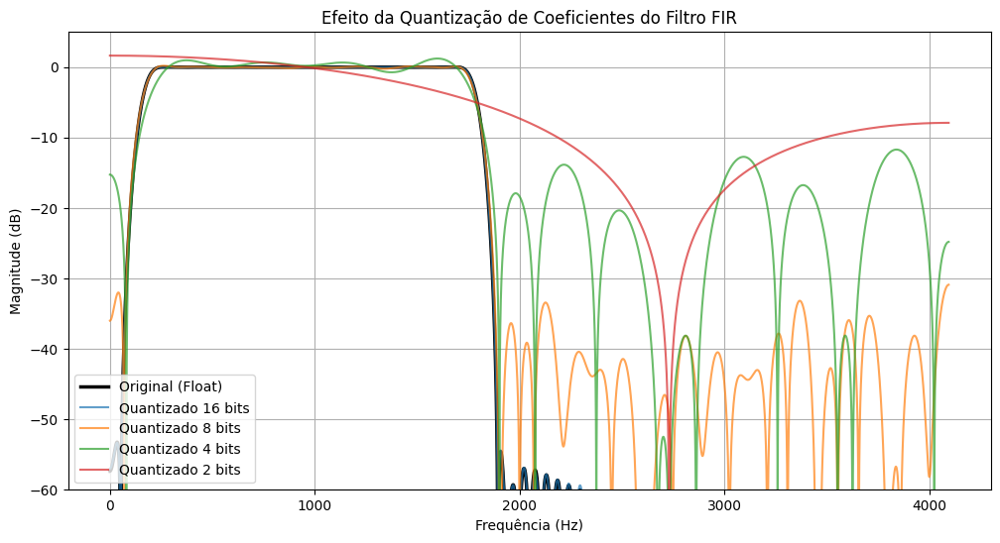

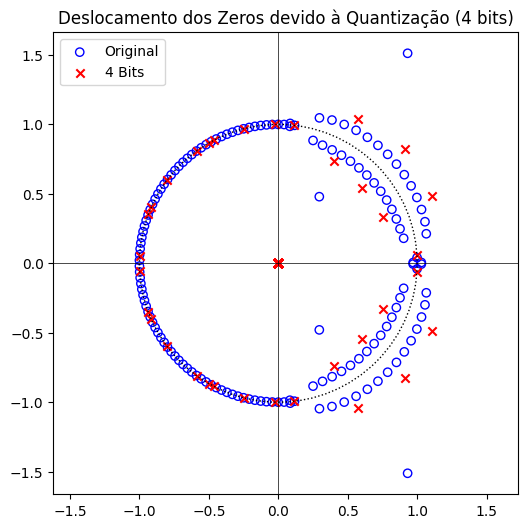

In [26]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal
import matplotlib.pyplot as plt

def quantizar_coeficientes(coefs, bits):
    """ Quantiza os coeficientes em ponto fixo com base no número de bits """
    max_val = np.max(np.abs(coefs))
    # Encontra o fator de escala para mapear os coeficientes na faixa da palavra binária
    coefs_normalizados = coefs / max_val
    n_niveis = 2**(bits - 1) - 1
    coefs_quantizados = np.round(coefs_normalizados * n_niveis) / n_niveis
    return coefs_quantizados * max_val

# Carregar dados básicos
fs, x = wav.read('handel.wav')
if x.dtype == np.int16: x = x / 32768.0
elif len(x.shape) > 1: x = x[:, 0]

M = 150
h_original = signal.firwin(M + 1, [150/(fs/2), 1800/(fs/2)], pass_zero=False, window='hamming')

bits_lista = [16, 8, 4, 2]

plt.figure(figsize=(12, 6))
# Plot da resposta original como referência
w, H_orig = signal.freqz(h_original, worN=8000)
plt.plot((w * fs) / (2 * np.pi), 20 * np.log10(np.abs(H_orig) + 1e-12), label='Original (Float)', linewidth=2.5, color='black')

for b in bits_lista:
    h_quant = quantizar_coeficientes(h_original, b)
    w, H_q = signal.freqz(h_quant, worN=8000)
    plt.plot((w * fs) / (2 * np.pi), 20 * np.log10(np.abs(H_q) + 1e-12), label=f'Quantizado {b} bits', alpha=0.7)

plt.title('Efeito da Quantização de Coeficientes do Filtro FIR')
plt.xlabel('Frequência (Hz)')
plt.ylabel('Magnitude (dB)')
plt.ylim([-60, 5])
plt.grid(True)
plt.legend()
plt.show()

# --- Plot Auxiliar: Comparação de Zeros para Caso Crítico (4 bits vs Original) ---

h_4bits = quantizar_coeficientes(h_original, 4)
zeros_orig, _, _ = signal.tf2zpk(h_original, [1])
zeros_4b, _, _ = signal.tf2zpk(h_4bits, [1])

plt.figure(figsize=(6, 6))
plt.scatter(np.real(zeros_orig), np.imag(zeros_orig), marker='o', facecolors='none', edgecolors='b', label='Original')
plt.scatter(np.real(zeros_4b), np.imag(zeros_4b), marker='x', color='r', label='4 Bits')
plt.gca().add_patch(plt.Circle((0, 0), 1, color='black', fill=False, linestyle=':'))
plt.axhline(0, color='black', lw=0.5); plt.axvline(0, color='black', lw=0.5)
plt.title('Deslocamento dos Zeros devido à Quantização (4 bits)')
plt.axis('equal')
plt.legend()
plt.show()